# 啊哈！原来大家好这口！——对搞笑萌宠推特WeRateDogs的过度分析

# 综述
---

WeRateDogs是推特帐最受欢迎的搞笑萌宠推主之一。其开创性的将宠物，打分和搞笑元素结合，收获了不少粉丝。我们拿到了与WeRateDogs相关的三个数据集，尝试探索15年11月到17年8月之推特账号所蕴藏的，粉丝的喜好的秘密。我们修复了原始数据集存在的13个质量问题，两个整洁度问题，并额外提取了4项特征以便分析。在观察了推特账号的运营情况后进行进一步探索的过程中，我们确认发帖时间，发帖时是星期几，推文主体的性别，以及推文主体究竟是不是狗，很可能对单条推文的受欢迎程度几乎没有影响。我们对以下三个方面进行了更加深入的探究：品种，评分和生长分类。我们最终的结论可以用以下三句话概括：1）众汪平等：人们对不同品种的狗没有特别的偏好；2）小奶狗不吃香：WeRateDogs推特中小狗的受欢迎程度比不上大狗；3）低分有铁粉，高分更吸睛：尽管高评分的推特更有可能获得更高的点赞量，但地评分的推文反而更容易获得转发。最后，我们探讨了上述的三点观察背后可能的原因，并指出了本文的不足和后续努力的方向。

<h1>目录<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#啊哈！原来大家好这口！——对搞笑萌宠推特WeRateDogs的过度分析" data-toc-modified-id="啊哈！原来大家好这口！——对搞笑萌宠推特WeRateDogs的过度分析-1">啊哈！原来大家好这口！——对搞笑萌宠推特WeRateDogs的过度分析</a></span></li><li><span><a href="#综述" data-toc-modified-id="综述-2">综述</a></span><ul class="toc-item"><li><span><a href="#1.-简介" data-toc-modified-id="1.-简介-2.1">1. 简介</a></span><ul class="toc-item"><li><span><a href="#1.1-依赖包导入，及项目初始化" data-toc-modified-id="1.1-依赖包导入，及项目初始化-2.1.1">1.1 依赖包导入，及项目初始化</a></span></li><li><span><a href="#1.2-数据集初探" data-toc-modified-id="1.2-数据集初探-2.1.2">1.2 数据集初探</a></span><ul class="toc-item"><li><span><a href="#1.2.1-加载数据集" data-toc-modified-id="1.2.1-加载数据集-2.1.2.1">1.2.1 加载数据集</a></span></li><li><span><a href="#1.2.2-数据集预览" data-toc-modified-id="1.2.2-数据集预览-2.1.2.2">1.2.2 数据集预览</a></span></li></ul></li></ul></li><li><span><a href="#2.-数据整理" data-toc-modified-id="2.-数据整理-2.2">2. 数据整理</a></span><ul class="toc-item"><li><span><a href="#2.1-去除无用的数据" data-toc-modified-id="2.1-去除无用的数据-2.2.1">2.1 去除无用的数据</a></span><ul class="toc-item"><li><span><a href="#2.1.1-读取数据集表头" data-toc-modified-id="2.1.1-读取数据集表头-2.2.1.1">2.1.1 读取数据集表头</a></span></li><li><span><a href="#2.1.2-整理数据集" data-toc-modified-id="2.1.2-整理数据集-2.2.1.2">2.1.2 整理数据集</a></span></li><li><span><a href="#2.1.3-去掉不必要的行" data-toc-modified-id="2.1.3-去掉不必要的行-2.2.1.3">2.1.3 去掉不必要的行</a></span></li></ul></li><li><span><a href="#2.2-评估数据" data-toc-modified-id="2.2-评估数据-2.2.2">2.2 评估数据</a></span><ul class="toc-item"><li><span><a href="#针对dogrates_lite数据集的评估" data-toc-modified-id="针对dogrates_lite数据集的评估-2.2.2.1">针对dogrates_lite数据集的评估</a></span></li><li><span><a href="#针对breeds_lite数据集的评估" data-toc-modified-id="针对breeds_lite数据集的评估-2.2.2.2">针对breeds_lite数据集的评估</a></span></li><li><span><a href="#针对retweets_lite数据集的评估" data-toc-modified-id="针对retweets_lite数据集的评估-2.2.2.3">针对<code>retweets_lite</code>数据集的评估</a></span></li><li><span><a href="#2.2.1-质量问题" data-toc-modified-id="2.2.1-质量问题-2.2.2.4">2.2.1 质量问题</a></span></li><li><span><a href="#2.2.2-整洁度问题" data-toc-modified-id="2.2.2-整洁度问题-2.2.2.5">2.2.2 整洁度问题</a></span></li><li><span><a href="#2.2.3-其他" data-toc-modified-id="2.2.3-其他-2.2.2.6">2.2.3 其他</a></span></li><li><span><a href="#2.2.4-小结" data-toc-modified-id="2.2.4-小结-2.2.2.7">2.2.4 小结</a></span></li></ul></li></ul></li><li><span><a href="#3-数据的清洗、整理及初步探索" data-toc-modified-id="3-数据的清洗、整理及初步探索-2.3">3 数据的清洗、整理及初步探索</a></span><ul class="toc-item"><li><span><a href="#3.1-质量问题" data-toc-modified-id="3.1-质量问题-2.3.1">3.1 质量问题</a></span><ul class="toc-item"><li><span><a href="#1.-该删的删" data-toc-modified-id="1.-该删的删-2.3.1.1">1. 该删的删</a></span></li><li><span><a href="#2.-该补的补" data-toc-modified-id="2.-该补的补-2.3.1.2">2. 该补的补</a></span></li><li><span><a href="#3.-该改的改（分类）" data-toc-modified-id="3.-该改的改（分类）-2.3.1.3">3. 该改的改（分类）</a></span></li><li><span><a href="#4.-该改的改（分数）" data-toc-modified-id="4.-该改的改（分数）-2.3.1.4">4. 该改的改（分数）</a></span></li><li><span><a href="#5.-该改的改（其他）" data-toc-modified-id="5.-该改的改（其他）-2.3.1.5">5. 该改的改（其他）</a></span></li><li><span><a href="#修改breeds_clean数据集中的名称" data-toc-modified-id="修改breeds_clean数据集中的名称-2.3.1.6">修改<code>breeds_clean</code>数据集中的名称</a></span></li></ul></li><li><span><a href="#3.2-整洁度问题" data-toc-modified-id="3.2-整洁度问题-2.3.2">3.2 整洁度问题</a></span></li><li><span><a href="#3.3-其他" data-toc-modified-id="3.3-其他-2.3.3">3.3 其他</a></span><ul class="toc-item"><li><span><a href="#从text列中提取性别信息" data-toc-modified-id="从text列中提取性别信息-2.3.3.1">从<code>text</code>列中提取性别信息</a></span></li><li><span><a href="#计算转赞比RT/Like" data-toc-modified-id="计算转赞比RT/Like-2.3.3.2">计算转赞比<code>RT/Like</code></a></span></li><li><span><a href="#生成推文点赞量&amp;转赞比里程碑推文数据集" data-toc-modified-id="生成推文点赞量&amp;转赞比里程碑推文数据集-2.3.3.3">生成推文点赞量&amp;转赞比里程碑推文数据集</a></span></li><li><span><a href="#将评分分组" data-toc-modified-id="将评分分组-2.3.3.4">将评分分组</a></span></li><li><span><a href="#对推文是否为狗进行分类" data-toc-modified-id="对推文是否为狗进行分类-2.3.3.5">对推文是否为狗进行分类</a></span></li></ul></li></ul></li></ul></li><li><span><a href="#4-WeRateDogs推特账号的数据素描" data-toc-modified-id="4-WeRateDogs推特账号的数据素描-3">4 WeRateDogs推特账号的数据素描</a></span><ul class="toc-item"><li><span><a href="#4.1-账号各项属性一览" data-toc-modified-id="4.1-账号各项属性一览-3.1">4.1 账号各项属性一览</a></span></li><li><span><a href="#4.2-数据集各项唯一值情况" data-toc-modified-id="4.2-数据集各项唯一值情况-3.2">4.2 数据集各项唯一值情况</a></span></li><li><span><a href="#4.3-各分类型数据细分占比一览" data-toc-modified-id="4.3-各分类型数据细分占比一览-3.3">4.3 各分类型数据细分占比一览</a></span><ul class="toc-item"><li><ul class="toc-item"><li><span><a href="#单只/多只狗狗推文数量占比" data-toc-modified-id="单只/多只狗狗推文数量占比-3.3.0.1">单只/多只狗狗推文数量占比</a></span></li><li><span><a href="#生长阶段分类占比" data-toc-modified-id="生长阶段分类占比-3.3.0.2">生长阶段分类占比</a></span></li><li><span><a href="#狗狗生长阶段分类的详细分布（包括/不包括未指明的分类）" data-toc-modified-id="狗狗生长阶段分类的详细分布（包括/不包括未指明的分类）-3.3.0.3">狗狗生长阶段分类的详细分布（包括/不包括未指明的分类）</a></span></li><li><span><a href="#评分等级的分布情况" data-toc-modified-id="评分等级的分布情况-3.3.0.4">评分等级的分布情况</a></span></li><li><span><a href="#品种分布情况" data-toc-modified-id="品种分布情况-3.3.0.5">品种分布情况</a></span></li><li><span><a href="#狗狗性别分布情况" data-toc-modified-id="狗狗性别分布情况-3.3.0.6">狗狗性别分布情况</a></span></li><li><span><a href="#推文主题是否为狗的分布情况" data-toc-modified-id="推文主题是否为狗的分布情况-3.3.0.7">推文主题是否为狗的分布情况</a></span></li></ul></li></ul></li><li><span><a href="#4.4-对数值型变量的探索" data-toc-modified-id="4.4-对数值型变量的探索-3.4">4.4 对数值型变量的探索</a></span><ul class="toc-item"><li><span><a href="#4.4.1-对数值型变量的分布情况探索" data-toc-modified-id="4.4.1-对数值型变量的分布情况探索-3.4.1">4.4.1 对数值型变量的分布情况探索</a></span><ul class="toc-item"><li><span><a href="#1.-点赞量与转发量的分布趋势（一般-&amp;-ln标准化），与二者之间的关系" data-toc-modified-id="1.-点赞量与转发量的分布趋势（一般-&amp;-ln标准化），与二者之间的关系-3.4.1.1">1. 点赞量与转发量的分布趋势（一般 &amp; ln标准化），与二者之间的关系</a></span></li><li><span><a href="#2.-转赞比的分布趋势-（一般-&amp;-log标准化）" data-toc-modified-id="2.-转赞比的分布趋势-（一般-&amp;-log标准化）-3.4.1.2">2. 转赞比的分布趋势 （一般 &amp; log标准化）</a></span></li><li><span><a href="#3.-名字的频次分布" data-toc-modified-id="3.-名字的频次分布-3.4.1.3">3. 名字的频次分布</a></span></li></ul></li><li><span><a href="#4.4.2-对一些有趣极值的探索" data-toc-modified-id="4.4.2-对一些有趣极值的探索-3.4.2">4.4.2 对一些有趣极值的探索</a></span><ul class="toc-item"><li><span><a href="#1.-评分" data-toc-modified-id="1.-评分-3.4.2.1">1. 评分</a></span></li><li><span><a href="#2.-点赞" data-toc-modified-id="2.-点赞-3.4.2.2">2. 点赞</a></span></li><li><span><a href="#3.-转赞比" data-toc-modified-id="3.-转赞比-3.4.2.3">3. 转赞比</a></span></li></ul></li><li><span><a href="#4.4.3-对数据集数据相关性的探索" data-toc-modified-id="4.4.3-对数据集数据相关性的探索-3.4.3">4.4.3 对数据集数据相关性的探索</a></span></li></ul></li><li><span><a href="#4.5-数值型变量随时间序列演变的探索" data-toc-modified-id="4.5-数值型变量随时间序列演变的探索-3.5">4.5 数值型变量随时间序列演变的探索</a></span><ul class="toc-item"><li><ul class="toc-item"><li><span><a href="#发帖量随时间变化（逐月）的情况" data-toc-modified-id="发帖量随时间变化（逐月）的情况-3.5.0.1">发帖量随时间变化（逐月）的情况</a></span></li><li><span><a href="#分数随时间变化（逐月）的情况" data-toc-modified-id="分数随时间变化（逐月）的情况-3.5.0.2">分数随时间变化（逐月）的情况</a></span></li><li><span><a href="#点赞/转发的（逐月）变化情况" data-toc-modified-id="点赞/转发的（逐月）变化情况-3.5.0.3">点赞/转发的（逐月）变化情况</a></span></li></ul></li></ul></li></ul></li><li><span><a href="#5.-数据的可视化与分析I：客观因素对推文受欢迎程度的影响" data-toc-modified-id="5.-数据的可视化与分析I：客观因素对推文受欢迎程度的影响-4">5. 数据的可视化与分析I：客观因素对推文受欢迎程度的影响</a></span><ul class="toc-item"><li><span><a href="#5.1-发推时间点对点赞量/转发量的影响" data-toc-modified-id="5.1-发推时间点对点赞量/转发量的影响-4.1">5.1 发推时间点对点赞量/转发量的影响</a></span></li><li><span><a href="#5.2-一周中的某一天对受欢迎程度的影响" data-toc-modified-id="5.2-一周中的某一天对受欢迎程度的影响-4.2">5.2 一周中的某一天对受欢迎程度的影响</a></span></li></ul></li><li><span><a href="#6.-数据的可视化与分析II：推文内容对推文受欢迎程度的影响" data-toc-modified-id="6.-数据的可视化与分析II：推文内容对推文受欢迎程度的影响-5">6. 数据的可视化与分析II：推文内容对推文受欢迎程度的影响</a></span><ul class="toc-item"><li><span><a href="#6.0-是骡子是马，先画出来看看" data-toc-modified-id="6.0-是骡子是马，先画出来看看-5.1">6.0 是骡子是马，先画出来看看</a></span><ul class="toc-item"><li><span><a href="#1.-点赞量/转赞比与品种的关系" data-toc-modified-id="1.-点赞量/转赞比与品种的关系-5.1.1">1. 点赞量/转赞比与品种的关系</a></span></li><li><span><a href="#2.-生长阶段与点赞量/转赞比的关系" data-toc-modified-id="2.-生长阶段与点赞量/转赞比的关系-5.1.2">2. 生长阶段与点赞量/转赞比的关系</a></span></li><li><span><a href="#3.-评分与转发量/点赞数的关系" data-toc-modified-id="3.-评分与转发量/点赞数的关系-5.1.3">3. 评分与转发量/点赞数的关系</a></span></li><li><span><a href="#4.-推文主题是不是狗的影响" data-toc-modified-id="4.-推文主题是不是狗的影响-5.1.4">4. 推文主题是不是狗的影响</a></span></li><li><span><a href="#5.-点赞量/转赞比与性别的关系" data-toc-modified-id="5.-点赞量/转赞比与性别的关系-5.1.5">5. 点赞量/转赞比与性别的关系</a></span></li></ul></li><li><span><a href="#6.1-转发量/点赞量与品种的关系" data-toc-modified-id="6.1-转发量/点赞量与品种的关系-5.2">6.1 转发量/点赞量与品种的关系</a></span><ul class="toc-item"><li><span><a href="#6.1.1-对点赞量前10名的狗狗，点赞量的单因素方差分析（One-Way-ANOVA）" data-toc-modified-id="6.1.1-对点赞量前10名的狗狗，点赞量的单因素方差分析（One-Way-ANOVA）-5.2.1">6.1.1 对点赞量前10名的狗狗，点赞量的单因素方差分析（One-Way ANOVA）</a></span><ul class="toc-item"><li><span><a href="#a)-检验正态性" data-toc-modified-id="a)-检验正态性-5.2.1.1">a) 检验正态性</a></span></li><li><span><a href="#b)-检验样本的方差齐性" data-toc-modified-id="b)-检验样本的方差齐性-5.2.1.2">b) 检验样本的方差齐性</a></span></li><li><span><a href="#c)-对样本点赞量的单因素方差分析" data-toc-modified-id="c)-对样本点赞量的单因素方差分析-5.2.1.3">c) 对样本点赞量的单因素方差分析</a></span></li></ul></li><li><span><a href="#6.1.2-对点赞量前10名的狗狗，转赞比的单因素方差分析（One-Way-ANOVA）" data-toc-modified-id="6.1.2-对点赞量前10名的狗狗，转赞比的单因素方差分析（One-Way-ANOVA）-5.2.2">6.1.2 对点赞量前10名的狗狗，转赞比的单因素方差分析（One-Way ANOVA）</a></span><ul class="toc-item"><li><span><a href="#a)-检验正态性" data-toc-modified-id="a)-检验正态性-5.2.2.1">a) 检验正态性</a></span></li><li><span><a href="#b)-检验样本的方差齐性" data-toc-modified-id="b)-检验样本的方差齐性-5.2.2.2">b) 检验样本的方差齐性</a></span></li><li><span><a href="#c)-对样本转赞比的单因素方差分析" data-toc-modified-id="c)-对样本转赞比的单因素方差分析-5.2.2.3">c) 对样本转赞比的单因素方差分析</a></span></li></ul></li><li><span><a href="#6.1.3-小结" data-toc-modified-id="6.1.3-小结-5.2.3">6.1.3 小结</a></span></li></ul></li><li><span><a href="#6.2-在狗狗不同的生长阶段，每个阶段的狗狗获得的转发量/点赞数是否不同？" data-toc-modified-id="6.2-在狗狗不同的生长阶段，每个阶段的狗狗获得的转发量/点赞数是否不同？-5.3">6.2 在狗狗不同的生长阶段，每个阶段的狗狗获得的转发量/点赞数是否不同？</a></span><ul class="toc-item"><li><span><a href="#6.2.1-对点赞量的单因素方差分析" data-toc-modified-id="6.2.1-对点赞量的单因素方差分析-5.3.1">6.2.1 对点赞量的单因素方差分析</a></span><ul class="toc-item"><li><span><a href="#a)-检验样本方差齐性" data-toc-modified-id="a)-检验样本方差齐性-5.3.1.1">a) 检验样本方差齐性</a></span></li><li><span><a href="#b)-执行单因素方差分析" data-toc-modified-id="b)-执行单因素方差分析-5.3.1.2">b) 执行单因素方差分析</a></span></li><li><span><a href="#c)-哪些组之间均值不同——Dunn's检验" data-toc-modified-id="c)-哪些组之间均值不同——Dunn's检验-5.3.1.3">c) 哪些组之间均值不同——Dunn's检验</a></span></li><li><span><a href="#d)-统计结果能在多大程度上说明问题——对η2的计算" data-toc-modified-id="d)-统计结果能在多大程度上说明问题——对η2的计算-5.3.1.4">d) 统计结果能在多大程度上说明问题——对η<sup>2</sup>的计算</a></span></li></ul></li><li><span><a href="#6.2.2-对转赞比的单因素方差分析" data-toc-modified-id="6.2.2-对转赞比的单因素方差分析-5.3.2">6.2.2 对转赞比的单因素方差分析</a></span><ul class="toc-item"><li><span><a href="#a)-检验样本方差齐性" data-toc-modified-id="a)-检验样本方差齐性-5.3.2.1">a) 检验样本方差齐性</a></span></li><li><span><a href="#b)-执行单因素方差分析" data-toc-modified-id="b)-执行单因素方差分析-5.3.2.2">b) 执行单因素方差分析</a></span></li><li><span><a href="#c)-哪些组之间均值不同——Tukey's-HSD检验" data-toc-modified-id="c)-哪些组之间均值不同——Tukey's-HSD检验-5.3.2.3">c) 哪些组之间均值不同——Tukey's HSD检验</a></span></li><li><span><a href="#d)-统计结果能在多大程度上说明问题——对η2的计算" data-toc-modified-id="d)-统计结果能在多大程度上说明问题——对η2的计算-5.3.2.4">d) 统计结果能在多大程度上说明问题——对η<sup>2</sup>的计算</a></span></li></ul></li><li><span><a href="#6.2.3-小结" data-toc-modified-id="6.2.3-小结-5.3.3">6.2.3 小结</a></span></li></ul></li><li><span><a href="#6.3-评分与转发量/点赞数的关系是什么？即：分数越高的狗狗，点赞和转发量就一定越高吗？或是有什么其他的可能？" data-toc-modified-id="6.3-评分与转发量/点赞数的关系是什么？即：分数越高的狗狗，点赞和转发量就一定越高吗？或是有什么其他的可能？-5.4">6.3 评分与转发量/点赞数的关系是什么？即：分数越高的狗狗，点赞和转发量就一定越高吗？或是有什么其他的可能？</a></span><ul class="toc-item"><li><span><a href="#6.3.1-点赞量的线性回归分析" data-toc-modified-id="6.3.1-点赞量的线性回归分析-5.4.1">6.3.1 点赞量的线性回归分析</a></span></li><li><span><a href="#6.3.2-转赞比的线性回归模型" data-toc-modified-id="6.3.2-转赞比的线性回归模型-5.4.2">6.3.2 转赞比的线性回归模型</a></span></li><li><span><a href="#6.3.3-对点赞量的单因素方差分析" data-toc-modified-id="6.3.3-对点赞量的单因素方差分析-5.4.3">6.3.3 对点赞量的单因素方差分析</a></span><ul class="toc-item"><li><span><a href="#a)-检验样本方差齐性" data-toc-modified-id="a)-检验样本方差齐性-5.4.3.1">a) 检验样本方差齐性</a></span></li><li><span><a href="#b)-执行单因素方差分析" data-toc-modified-id="b)-执行单因素方差分析-5.4.3.2">b) 执行单因素方差分析</a></span></li><li><span><a href="#c)-执行后续分析——Tukey's-HSD检验" data-toc-modified-id="c)-执行后续分析——Tukey's-HSD检验-5.4.3.3">c) 执行后续分析——Tukey's HSD检验</a></span></li><li><span><a href="#d)-统计结果能在多大程度上说明问题——对η2的计算" data-toc-modified-id="d)-统计结果能在多大程度上说明问题——对η2的计算-5.4.3.4">d) 统计结果能在多大程度上说明问题——对η<sup>2</sup>的计算</a></span></li></ul></li><li><span><a href="#6.3.4-对转赞比的单因素方差分析" data-toc-modified-id="6.3.4-对转赞比的单因素方差分析-5.4.4">6.3.4 对转赞比的单因素方差分析</a></span><ul class="toc-item"><li><span><a href="#a)-检验样本方差齐性" data-toc-modified-id="a)-检验样本方差齐性-5.4.4.1">a) 检验样本方差齐性</a></span></li><li><span><a href="#b)-执行单因素方差分析" data-toc-modified-id="b)-执行单因素方差分析-5.4.4.2">b) 执行单因素方差分析</a></span></li><li><span><a href="#c)-执行后续分析——Dunn's检验" data-toc-modified-id="c)-执行后续分析——Dunn's检验-5.4.4.3">c) 执行后续分析——Dunn's检验</a></span></li><li><span><a href="#d)-统计结果能在多大程度上说明问题——对η2的计算" data-toc-modified-id="d)-统计结果能在多大程度上说明问题——对η2的计算-5.4.4.4">d) 统计结果能在多大程度上说明问题——对η<sup>2</sup>的计算</a></span></li></ul></li><li><span><a href="#6.3.5-小结" data-toc-modified-id="6.3.5-小结-5.4.5">6.3.5 小结</a></span></li></ul></li></ul></li><li><span><a href="#7.-总结与讨论" data-toc-modified-id="7.-总结与讨论-6">7. 总结与讨论</a></span><ul class="toc-item"><li><span><a href="#7.1-对数据集的清洗和整理" data-toc-modified-id="7.1-对数据集的清洗和整理-6.1">7.1 对数据集的清洗和整理</a></span></li><li><span><a href="#7.2-对推特账号运营情况的观察" data-toc-modified-id="7.2-对推特账号运营情况的观察-6.2">7.2 对推特账号运营情况的观察</a></span></li><li><span><a href="#7.3-对影响推文受欢迎程度因素的讨论" data-toc-modified-id="7.3-对影响推文受欢迎程度因素的讨论-6.3">7.3 对影响推文受欢迎程度因素的讨论</a></span><ul class="toc-item"><li><span><a href="#7.3.1-大千世界，众汪平等" data-toc-modified-id="7.3.1-大千世界，众汪平等-6.3.1">7.3.1 大千世界，众汪平等</a></span></li><li><span><a href="#7.3.2-小奶狗居然不吃香" data-toc-modified-id="7.3.2-小奶狗居然不吃香-6.3.2">7.3.2 小奶狗居然不吃香</a></span></li><li><span><a href="#7.3.3-低分有铁粉，高分更吸睛" data-toc-modified-id="7.3.3-低分有铁粉，高分更吸睛-6.3.3">7.3.3 低分有铁粉，高分更吸睛</a></span></li></ul></li><li><span><a href="#7.4-本报告的局限之处，和未来努力的方向" data-toc-modified-id="7.4-本报告的局限之处，和未来努力的方向-6.4">7.4 本报告的局限之处，和未来努力的方向</a></span></li></ul></li></ul></div>

## 1. 简介
------

WeRateDogs是推特上受欢迎的萌宠推主之一。

其主要风格为搞笑，具体表现形式为使用推文为一张狗狗（well，理论上都是）的照片进行十分制的打分。尽管其满分为10分，但推主常常打出10分以上的高分（13，14等），并一本正经的配上推文说明理由，十分有趣。推主有时也会一本正经给一些并不是狗的照片打分，喜剧效果十足。某些时候某些狗狗会被刻意打出低分，同样配上令人捧腹的推文。

WeRateDogs创建于11月15日。创始人时坎贝尔大学的（辍）学生Matt Nelson，当时读该校高尔夫管理专业的大二学生。当时，他和他的朋友们一起在一家苹果蜜蜂餐厅(Applebee's）的餐桌旁，用WeRateDogs账号发出了第一条推特。

如同天底下所有真实的创业故事那样，这个独特的推特账号的发展并非一帆风顺。15年11、12月是最初的激情，很快挑战便接踵而至：
- 大学繁重的课业使得Nelson疲惫不堪，严重睡眠不足，甚至不得不放弃了高尔夫球（well，作为一名高尔夫管理专业的学生，这好像有点，emmm......too much）；
- 16年2月，甚至有人给他下套，声称WeRateDogs侵犯了图片版权；
- 16年春季，他招聘并最终开除了两名员工；其中一位还想买下他的账号；

身心俱疲的Nelson当然想过放弃。他联系了John Ricci，一位拥有丰富社交媒体运营经验的市场人，想要卖掉账号一了百了，没想到后者居然拒绝了。Rucci看到了账号的潜力，极力劝说Matt改变方式坚持运营，并在16年某个未知的时间点开始帮助他运营。Rucci每天帮Matt筛选出20-30张各地粉丝发来的请求打分的照片，而Nelson则挑出两张，分别在中午和晚上8：00左右发出即可。慢慢的，Nelson重新找到了节奏。17年某个未知的时间点，升入大四的Nelson退学，全心投入推特账号的运营。

现在，WeRateDogs主要依靠自营[电商](https://weratedogs.com/)盈利，向通过推特账号积攒的粉丝售卖写有推特账号标志性语录的狗狗围巾、卫衣等。Nelson自己透露，每个月的收入在1万美元左右。

> 综合自下列报道
- [This 21-Year-Old Quit College to Rate Dogs on the Internet. He's Now Making Six Figures](http://money.com/money/5225272/weratedogs-matt-nelson-interview/), 
- [Jerk’s One-on-One with the Guy Who Makes a Living Rating Dogs](http://www.jerkmagazine.net/john-ricci-interview/), 
- [Pet Project](https://www.esquire.com/lifestyle/a54940/we-rate-dogs-matt-nelson-interview/), 
- [WeRateDogs Is Coming to Cambridge](https://www.bostonmagazine.com/arts-entertainment/2017/04/18/dog-rates-mit/), 
- [I Started the WeRateDogs Twitter Account and Here's My Career Story](https://www.themuse.com/advice/how-creator-of-weratedogs-twitter-account-started-career), 
- [They're Good Dogs Brent](https://knowyourmeme.com/memes/theyre-good-dogs-brent)

显然，WeRateDogs误打误撞探索出的这一定位十分有趣。传统上，萌宠推主千千万万，但绝大多数萌宠的推文都停留在“啊！好萌！”的层次上，而萌宠推主们之间的竞争主要依靠谁更萌获胜，这显然同质化严重而且很容易相互抄袭；给狗狗评价和打分的博主又太过严肃显得不近人情；而传统的搞笑博主又几乎没有与宠物结合起来的。系统性的发掘狗狗的萌点，并通过带有喜剧色彩的文案强化，最后配上打破传统令人捧腹的打分和评价，令人耳目一新并不令人意外。

但是，正如开心麻花的喜剧，在让观众开怀大笑之余，也有商业和受欢迎程度的考量一样，WeRateDogs的内容质量显然也是有部分更受欢迎的。问题是，究竟是怎样的内容更受欢迎呢？为了更好的云吸狗，我选择了这个非常繁琐，非常容易导致过度分析（事实上确实如此），看起来也不甚有意义的角度进行了探索。甚至，在探索的过程中，我的腹肌似乎因为笑得过于猛烈而受到了伤害。

在进行分析之前，我们需要明确，什么是“更受欢迎”。传统意义上，我们需要知道一条推特在发出的时候有多少关注者，这条推特有多少浏览量，多少点赞数和多少转发数，来一步一步计算转化比例。在这一框架中，更多的浏览量可能意味着火爆，但运营者们显然更关注点赞和转发的数据。

在这篇过度分析中，我们将围绕两个维度进行受欢迎程度的探索：
- **点赞量**，在拿不到关注量和浏览量这两个数据的前提之下，点赞量(数据集中叫favorite,Teitter上实际叫like）是最能直接反映一条推文得到关注和赞赏的指标；
- **转赞比**（Retweet/Favorite Ratio），衡量的是转发用户占点赞用户的比例，用于衡量核心用户占整体点赞用户的比例；

转赞比可以用来衡量核心用户占比的理论依据如下：
- 一个用户在社交网络上发出的内容，本质上都是他/她的社交货币；
- 社交货币是建立人设的一部分，是用户与周遭用户交流的一种前置条件，因此相比起点赞，转发更加困难，因其牵扯到个人形象问题；
- 社交货币依靠转发和原创内容生成；点赞不涉及分享，绝大多数社交网络（嗯我没有说微信朋友圈）里看不到点赞的详细信息，并不构成社交货币；
- 转发，意味着用户愿意将推文内容作为自己人设的一部分；这可能意味着他/她是这一话题的核心粉丝，并且不介意周围人知道这一点，哪怕，在此案例中，这枚社交货币是娱乐用途。


我们将围绕以下数据集展开探索：
1. 一个包含相关推特文本，清洗出来的狗狗评分，和推主自创的四个分类之一的部分的数据集；
2. 一个包含对推特中狗狗品种预测的数据集
3. 一个包含推特转发和评论数量的数据集

我们将首先惊醒项目初始化（不然呢）；随后将进行数据集的初步探索，并根据需要清洗数据，拓展数据集特征；随后，我们将简单的使用核心数据素描一下WeRateDogs账号；最后，我们将针对如下特性展开点赞量和转赞比区别的探索，并尝试得出结论：
- 推特发出的时间（24小时，累计）是否对点赞和转赞比有影响？
    - （即，我们假设大多数人看推特有相对固定的时间段，且这些时间段会影响阅读量，金额让影响到点赞和转赞比）
- 推特发出的日子（每周，例如周一还是周二）是否对点赞和转赞比有影响？
    - （即，我们假设部分推特在某些特定的天数更受欢迎，比如周末大家有更充足的时间刷手机的时候，虽然对于外国人民来说可能并不）
- 有没有某些特定品种的点赞量和转赞比相对较高？
- 大狗狗和小狗狗，哪种更讨人喜欢？
- 推主基于的评分，与点赞量和转赞比有没有关系？
- 推文主题是否是狗，与点赞量和转赞比有没有关系？

---

### 1.1 依赖包导入，及项目初始化

In [1]:
# 导入项目基础依赖包
import re
import requests
import datetime
import numpy as np
import pandas as pd
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

# 设定pandas dataframe的显示宽度，防止折叠
# 参考：https://ask.csdn.net/questions/367253
pd.set_option('display.max_colwidth', 1000)

# 设置pandas dataframe的最大行数，显著节约空间，减少割裂感
# 参考：https://stackoverflow.com/questions/42504984/python-pandas-select-both-head-and-tail
# 参考：https://pandas.pydata.org/pandas-docs/stable/generated/pandas.set_option.html
pd.set_option('display.max_rows', 10)

In [2]:
# 统计学相关包
import scikit_posthocs as sp
import scipy.stats as stats
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from statsmodels.stats.multicomp import MultiComparison


In [3]:
# 导入项目可视化部分依赖包
import matplotlib.pyplot as plt
import seaborn as sns

# plotLy需要1.9以上的版本
import plotly.offline as of
import plotly.graph_objs as go
of.init_notebook_mode(connected=True)

from matplotlib.colors import ListedColormap

%matplotlib inline
sns.set(style='white')




In [4]:
# 获取文件现在的路径，用于文件储存
import os
os.getcwd()


'C:\\Users\\willl\\OneDrive - WillfortheFuture\\我的文档\\学习\\Python\\Udacity\\DA Advanced\\P3\\submission1'

In [5]:
# 导入展示图片所需的库
from scipy.misc import imread
from PIL import Image
from io import BytesIO


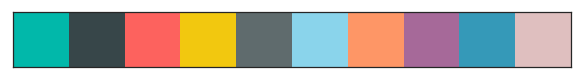

In [6]:
# 设定可视化颜色-分类类别
# 主色调
ui = ["#01B8AA", "#374649", "#FD625E", "#F2C80F", "#5F6B6D", "#8AD4EB", "#FE9666", "#A66999", "#3599B8", "#DFBFBF"]
# 浅一阶
ui_light = ["#4AC5BB", "#5F6B6D", "#FB8281", "#F4D25A","#7F898A", "#A4DDEE", "#FDAB89", "#B687AC", "#28738A", "#A78F8F"]
# 深一阶
ui_dark = ["#168980", "#293537", "#BB4A4A", "#B59525", "#475052", "#6A9FB0", "#BD7150", "#7B4F71", "#1B4D5C", "#706060"]

# 将颜色设定为Seaborn Palette
ui_palette_light = sns.color_palette(ui_light)
ui_palette_dark = sns.color_palette(ui_dark)
ui_palette_default = sns.set_palette(ui)

# 主色调预览
sns.palplot(sns.color_palette(ui))


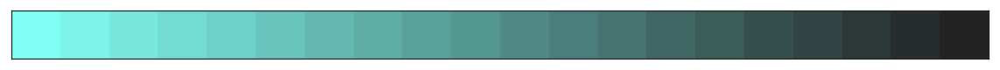

In [7]:
# 设置可视化颜色-连续类别
# 内心os：Seaborn实乃神器也哇哈哈哈哈~
sequential_ui = sns.dark_palette(
    "#82FFF5", n_colors=20, reverse=True, as_cmap=True)
sequential_ui_palette_reverse = sns.dark_palette(
    "#82FFF5", n_colors=20, reverse=False)
sns.palplot(sns.dark_palette("#82FFF5", n_colors=20, reverse=True))


### 1.2 数据集初探

#### 1.2.1 加载数据集

In [8]:
# 加载包含狗狗信息的原始数据集，并命名为“dogrates"
dogrates = pd.read_csv('twitter-archive-enhanced.csv', encoding='utf8')


In [9]:
# 加载包含了预测狗狗品种的数据集，并命名为breeds
# 根据要求，使用request库进行下载
url = "https://raw.githubusercontent.com/udacity/new-dand-advanced-china/master/%E6%95%B0%E6%8D%AE%E6%B8%85%E6%B4%97/WeRateDogs%E9%A1%B9%E7%9B%AE/image-predictions.tsv"
image_perdictions = requests.get(url)

# 将网络上的返回保存为文件
# 为啥requests库就不把这个部分搞简单点呢~瞧瞧人家urllib，一个retrieve就搞定了~
with open('image-predictions-download.tsv', mode='wb') as downloads:
     downloads.write(image_perdictions.content)

breeds = pd.read_csv('image-predictions-download.tsv', sep='\t', encoding = 'utf8')


In [10]:
# 加载推特转载数记录的数据集，并将其命名为retweet
# 由于众所周知的原因，没有通过Twitter API进行下载；这里我们直接导入优达学城提供的数据
retweets = pd.read_json('tweet.json', orient='string',
                        lines=True, encoding='utf8')


#### 1.2.2 数据集预览

In [11]:
dogrates.head(1)


,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892420643555336193/photo/1,13,10,Phineas,None,None,None,None


In [12]:
breeds.head(1)


,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh_springer_spaniel,0.465074,True,collie,0.156665,True,Shetland_sheepdog,0.061428,True


In [13]:
retweets.head(1)


,contributors,coordinates,created_at,display_text_range,entities,extended_entities,favorite_count,favorited,full_text,geo,...,possibly_sensitive_appealable,quoted_status,quoted_status_id,quoted_status_id_str,retweet_count,retweeted,retweeted_status,source,truncated,user
0,NaN,NaN,2017-08-01 16:23:56,"[0, 85]","{'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 892420639486877696, 'id_str': '892420639486877696', 'indices': [86, 109], 'media_url': 'http://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg', 'url': 'https://t.co/MgUWQ76dJU', 'display_url': 'pic.twitter.com/MgUWQ76dJU', 'expanded_url': 'https://twitter.com/dog_rates/status/892420643555336193/photo/1', 'type': 'photo', 'sizes': {'large': {'w': 540, 'h': 528, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 540, 'h': 528, 'resize': 'fit'}, 'medium': {'w': 540, 'h': 528, 'resize': 'fit'}}}]}","{'media': [{'id': 892420639486877696, 'id_str': '892420639486877696', 'indices': [86, 109], 'media_url': 'http://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg', 'url': 'https://t.co/MgUWQ76dJU', 'display_url': 'pic.twitter.com/MgUWQ76dJU', 'expanded_url': 'https://twitter.com/dog_rates/status/892420643555336193/photo/1', 'type': 'photo', 'sizes': {'large': {'w': 540, 'h': 528, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 540, 'h': 528, 'resize': 'fit'}, 'medium': {'w': 540, 'h': 528, 'resize': 'fit'}}}]}",39492,False,This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,NaN,...,0.0,NaN,NaN,NaN,8842,False,NaN,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",False,"{'id': 4196983835, 'id_str': '4196983835', 'name': 'SpookyWeRateDogs™', 'screen_name': 'dog_rates', 'location': 'MERCH↴ DM DOGS. WE WILL RATE', 'description': 'Only Legit Source for Professional Dog Ratings STORE: @ShopWeRateDogs | IG, FB & SC: WeRateDogs | MOBILE APP: @GoodDogsGame Business: dogratingtwitter@gmail.com', 'url': 'https://t.co/N7sNNHAEXS', 'entities': {'url': {'urls': [{'url': 'https://t.co/N7sNNHAEXS', 'expanded_url': 'http://weratedogs.com', 'display_url': 'weratedogs.com', 'indices': [0, 23]}]}, 'description': {'urls': []}}, 'protected': False, 'followers_count': 3768791, 'friends_count': 107, 'listed_count': 3169, 'created_at': 'Sun Nov 15 21:41:29 +0000 2015', 'favourites_count': 120162, 'utc_offset': None, 'time_zone': None, 'geo_enabled': True, 'verified': True, 'statuses_count': 5749, 'lang': 'en', 'contributors_enabled': False, 'is_translator': False, 'is_translation_enabled': False, 'profile_background_color': '000000', 'profile_background_image_url': 'htt..."


这些数据集看起来包含了许多我们不需要的信息；在如此之多的无效信息面前，我们无法做出有效的判断。因此，在评估数据质量之前，我们需要去除我们不需要的列，以减少信息干扰。

## 2. 数据整理
------

### 2.1 去除无用的数据

#### 2.1.1 读取数据集表头

In [14]:
dogrates.columns


Index(['tweet_id', 'in_reply_to_status_id', 'in_reply_to_user_id', 'timestamp',
       'source', 'text', 'retweeted_status_id', 'retweeted_status_user_id',
       'retweeted_status_timestamp', 'expanded_urls', 'rating_numerator',
       'rating_denominator', 'name', 'doggo', 'floofer', 'pupper', 'puppo'],
      dtype='object')

In [15]:
breeds.columns


Index(['tweet_id', 'jpg_url', 'img_num', 'p1', 'p1_conf', 'p1_dog', 'p2',
       'p2_conf', 'p2_dog', 'p3', 'p3_conf', 'p3_dog'],
      dtype='object')

In [16]:
retweets.columns


Index(['contributors', 'coordinates', 'created_at', 'display_text_range',
       'entities', 'extended_entities', 'favorite_count', 'favorited',
       'full_text', 'geo', 'id', 'id_str', 'in_reply_to_screen_name',
       'in_reply_to_status_id', 'in_reply_to_status_id_str',
       'in_reply_to_user_id', 'in_reply_to_user_id_str', 'is_quote_status',
       'lang', 'place', 'possibly_sensitive', 'possibly_sensitive_appealable',
       'quoted_status', 'quoted_status_id', 'quoted_status_id_str',
       'retweet_count', 'retweeted', 'retweeted_status', 'source', 'truncated',
       'user'],
      dtype='object')

经观察，dogrates和breeds两个数据集都有`tweet_id`列，而retweets数据集则有`id`列，可以作为键值进行数据的匹配；而retweets数据集中`id_str`与`tweet_id`列不匹配，无需包含。经过精简的数据集将被命名为dogratesLite，以与原数据集区分。

#### 2.1.2 整理数据集

dogrates数据集中，保留`tweet_id`、`timestamp`, `text`, `rating_numerator`, `rating_denominator`, `name`, `doggo`, `floofer`, `puper`, 和`puppo`列；因为项目文件中提及数据集中包含转发的推特数据，因此同样保留`retweeted_status_id`列，以便进一步观察；经过精简的dogrates数据集将被命名为dogrates_lite，以与原数据集区分。

In [17]:
# code
dogrates_lite = dogrates[['tweet_id', 'timestamp', 'text', 'rating_numerator',
                          'rating_denominator', 'name', 'doggo', 'floofer', 'pupper', 'puppo', 'retweeted_status_id']]


In [18]:
# test
dogrates_lite.head(2)


,tweet_id,timestamp,text,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,retweeted_status_id
0,892420643555336193,2017-08-01 16:23:56 +0000,This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,13,10,Phineas,None,None,None,None,NaN
1,892177421306343426,2017-08-01 00:17:27 +0000,"This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",13,10,Tilly,None,None,None,None,NaN


breeds数据集中，除必须的`tweet_id`和`jpg_url`外，我们只需要预测最准确的图片所预测的品种`p1` ，作为该图片最主要的特征；此外，我们需要全部预测该图片的分类是否为狗的列，包括`p1_dog`，`p2_dog`，`p3_dog`；经过精简的breeds数据集将被命名为breeds_lite，以与原数据集区分。

In [19]:
# code
breeds_lite = breeds[['tweet_id', 'jpg_url', 'p1', 'p1_dog', 'p2_dog', 'p3_dog']]


In [20]:
# test
breeds_lite.head(2)


,tweet_id,jpg_url,p1,p1_dog,p2_dog,p3_dog
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,Welsh_springer_spaniel,True,True,True
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,redbone,True,True,True


In [21]:
# test for duplicated
breeds_lite['jpg_url'].duplicated().value_counts()


False    2009
True       66
Name: jpg_url, dtype: int64

retweets数据集中，只保留`id`, `favorite_count`, `retweet_count`三列；经过精简的retweets数据集将被命名为retweets_lite，以与原数据集区分。

In [22]:
# code
retweets_lite = retweets[['id', 'favorite_count', 'retweet_count']]


In [23]:
# test
retweets_lite.head(2)


,id,favorite_count,retweet_count
0,892420643555336193,39492,8842
1,892177421306343426,33786,6480


#### 2.1.3 去掉不必要的行

因为我们将要回答的问题，必须同时在已经导入的三个数据集中都有对应的数据。任何缺失都将导致分析的结果没有意义。  
  
为了避免不必要的清洗操作，我们现在就用dogrates_lite数据集中的`tweet_id`列匹配breeds_lite中的`tweet_id`和retweets_lite数据集中的`id`，过滤掉不必要的行。  
  
最后，dogrates_lite数据集将被重新赋值为过滤后的数据集dogrates_lite数据集。

In [24]:
# 为了更灵活的筛选数据集之间的数据，我们定义如下函数：
def ISIN(df1, df2, column, df3=None, logic=None, mismatch=False):
    '''我们定义ISIN函数，其实为.isin方法针对本次研究的封装；
    其必须传入两个数据集的名称: df1和df2，和匹配二者的键值的列名称column（必须是字符串）；其中df1是主数据集；
    其可以传入第三个数据集df3的名称，搭配logic参数（必须是字符串）来进行多个数据集间数据的匹配，可选逻辑为“&”和“|”；匹配依旧基于column；
    其可以传入mismatch参数，意为是否取df1中df1与df2的差集；必须是布尔值，默认为False；为False时默认取函数交集；
    当mismatch为True时，若只有两个数据集传入，则默认取df1不在df2中的数据集；
    若有三个数据集传入，则默认只取df1与df3的差集
    '''
    if mismatch == False:
        if logic == '&':
            new_df = df1[(df1[column].isin(df2[column])) &
                         (df1[column].isin(df3[column]))]
            return new_df
        elif logic == '|':
            new_df = df1[(df1[column].isin(df2[column])) |
                         (df1[column].isin(df3[column]))]
            return new_df
        else:
            new_df = df1[(df1[column].isin(df2[column]))]
            return new_df
    elif mismatch == True:
        if logic == '&':
            new_df = df1[(df1[column].isin(df2[column])) &
                         ~(df1[column].isin(df3[column]))]
            return new_df
        elif logic == '|':
            new_df = df1[(df1[column].isin(df2[column])) |
                         ~(df1[column].isin(df3[column]))]
            return new_df
        else:
            new_df = df1[~(df1[column].isin(df2[column]))]
            return new_df
    else:
        print("This computer is exploding in 5, 4, 3, 2, 1...")


In [25]:
dogrates_dropped = ISIN(dogrates_lite, breeds_lite, 'tweet_id', mismatch=True)
dogrates_dropped.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 281 entries, 30 to 2298
Data columns (total 11 columns):
tweet_id               281 non-null int64
timestamp              281 non-null object
text                   281 non-null object
rating_numerator       281 non-null int64
rating_denominator     281 non-null int64
name                   281 non-null object
doggo                  281 non-null object
floofer                281 non-null object
pupper                 281 non-null object
puppo                  281 non-null object
retweeted_status_id    100 non-null float64
dtypes: float64(1), int64(3), object(7)
memory usage: 26.3+ KB


In [26]:
# 去掉不必要的行
dogrates_lite = ISIN(dogrates_lite, breeds_lite, 'tweet_id')
dogrates_lite.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 2075 entries, 0 to 2355
Data columns (total 11 columns):
tweet_id               2075 non-null int64
timestamp              2075 non-null object
text                   2075 non-null object
rating_numerator       2075 non-null int64
rating_denominator     2075 non-null int64
name                   2075 non-null object
doggo                  2075 non-null object
floofer                2075 non-null object
pupper                 2075 non-null object
puppo                  2075 non-null object
retweeted_status_id    81 non-null float64
dtypes: float64(1), int64(3), object(7)
memory usage: 194.5+ KB


### 2.2 评估数据

#### 针对dogrates_lite数据集的评估

In [27]:
# 查看数据集
dogrates_lite


,tweet_id,timestamp,text,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,retweeted_status_id
0,892420643555336193,2017-08-01 16:23:56 +0000,This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,13,10,Phineas,None,None,None,None,NaN
1,892177421306343426,2017-08-01 00:17:27 +0000,"This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",13,10,Tilly,None,None,None,None,NaN
2,891815181378084864,2017-07-31 00:18:03 +0000,This is Archie. He is a rare Norwegian Pouncing Corgo. Lives in the tall grass. You never know when one may strike. 12/10 https://t.co/wUnZnhtVJB,12,10,Archie,None,None,None,None,NaN
3,891689557279858688,2017-07-30 15:58:51 +0000,This is Darla. She commenced a snooze mid meal. 13/10 happens to the best of us https://t.co/tD36da7qLQ,13,10,Darla,None,None,None,None,NaN
4,891327558926688256,2017-07-29 16:00:24 +0000,"This is Franklin. He would like you to stop calling him ""cute."" He is a very fierce shark and should be respected as such. 12/10 #BarkWeek https://t.co/AtUZn91f7f",12,10,Franklin,None,None,None,None,NaN
...,...,...,...,...,...,...,...,...,...,...,...
2351,666049248165822465,2015-11-16 00:24:50 +0000,Here we have a 1949 1st generation vulpix. Enjoys sweat tea and Fox News. Cannot be phased. 5/10 https://t.co/4B7cOc1EDq,5,10,None,None,None,None,None,NaN
2352,666044226329800704,2015-11-16 00:04:52 +0000,This is a purebred Piers Morgan. Loves to Netflix and chill. Always looks like he forgot to unplug the iron. 6/10 https://t.co/DWnyCjf2mx,6,10,a,None,None,None,None,NaN
2353,666033412701032449,2015-11-15 23:21:54 +0000,Here is a very happy pup. Big fan of well-maintained decks. Just look at that tongue. 9/10 would cuddle af https://t.co/y671yMhoiR,9,10,a,None,None,None,None,NaN
2354,666029285002620928,2015-11-15 23:05:30 +0000,This is a western brown Mitsubishi terrier. Upset about leaf. Actually 2 dogs here. 7/10 would walk the shit out of https://t.co/r7mOb2m0UI,7,10,a,None,None,None,None,NaN


In [28]:
dogrates_lite.info()
# 没有空行，✓
# timestamp数据类型不正确，应为datetime
# doggo, floofer, pupper, puppo列有缺失值
# doggo, floofer, pupper, puppo应为一列标明种类（整洁度问题）


<class 'pandas.core.frame.DataFrame'>
Int64Index: 2075 entries, 0 to 2355
Data columns (total 11 columns):
tweet_id               2075 non-null int64
timestamp              2075 non-null object
text                   2075 non-null object
rating_numerator       2075 non-null int64
rating_denominator     2075 non-null int64
name                   2075 non-null object
doggo                  2075 non-null object
floofer                2075 non-null object
pupper                 2075 non-null object
puppo                  2075 non-null object
retweeted_status_id    81 non-null float64
dtypes: float64(1), int64(3), object(7)
memory usage: 194.5+ KB


In [29]:
dogrates_lite.describe()
# numerator有明显超出正常值的最大值，稍后需要使用value_counts方法检查；最小值为0也不正确；正常应为10-20之内的整数；
# denominator平均值不为10，也有远远超过正常值的最大值；最小值为0也不正确；正常应全部为10；


,tweet_id,rating_numerator,rating_denominator,retweeted_status_id
count,2.075000e+03,2075.000000,2075.000000,8.100000e+01
mean,7.384514e+17,12.266024,10.511325,7.678895e+17
std,6.785203e+16,40.680299,7.177072,5.962520e+16
min,6.660209e+17,0.000000,2.000000,6.675094e+17
25%,6.764835e+17,10.000000,10.000000,7.128090e+17
50%,7.119988e+17,11.000000,10.000000,7.798343e+17
75%,7.932034e+17,12.000000,10.000000,8.071068e+17
max,8.924206e+17,1776.000000,170.000000,8.874740e+17


In [30]:
dogrates_lite['rating_numerator'].value_counts()
# 低于10分的分数都需要进行调差
# 高于20的分数都需要进行调查


12     474
10     429
11     413
13     284
9      151
      ... 
45       1
75       1
99       1
121      1
204      1
Name: rating_numerator, Length: 35, dtype: int64

In [31]:
dogrates_lite['rating_denominator'].value_counts()


10    2057
50       3
11       2
80       2
7        1
      ... 
90       1
70       1
40       1
20       1
2        1
Name: rating_denominator, Length: 15, dtype: int64

In [32]:
dogrates_lite['name'].value_counts()


None       578
a           55
Charlie     11
Lucy        10
Tucker      10
          ... 
Pluto        1
Patch        1
Tessa        1
Dylan        1
Willem       1
Name: name, Length: 936, dtype: int64

In [33]:
retweeted_id_notnull = dogrates_lite[dogrates_lite['retweeted_status_id'].notnull()]
retweeted_id_notnull

,tweet_id,timestamp,text,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,retweeted_status_id
19,888202515573088257,2017-07-21 01:02:36 +0000,RT @dog_rates: This is Canela. She attempted some fancy porch pics. They were unsuccessful. 13/10 someone help her https://t.co/cLyzpcUcMX,13,10,Canela,None,None,None,None,8.874740e+17
36,885311592912609280,2017-07-13 01:35:06 +0000,RT @dog_rates: This is Lilly. She just parallel barked. Kindly requests a reward now. 13/10 would pet so well https://t.co/SATN4If5H5,13,10,Lilly,None,None,None,None,8.305833e+17
78,877611172832227328,2017-06-21 19:36:23 +0000,RT @rachel2195: @dog_rates the boyfriend and his soaking wet pupper h*cking love his new hat 14/10 https://t.co/dJx4Gzc50G,14,10,None,None,None,pupper,None,8.768508e+17
95,873697596434513921,2017-06-11 00:25:14 +0000,RT @dog_rates: This is Walter. He won't start hydrotherapy without his favorite floatie. 14/10 keep it pup Walter https://t.co/r28jFx9uyF,14,10,Walter,None,None,None,None,8.688804e+17
130,867072653475098625,2017-05-23 17:40:04 +0000,RT @rachaeleasler: these @dog_rates hats are 13/10 bean approved https://t.co/nRCdq4g9gG,13,10,None,None,None,None,None,8.650134e+17
...,...,...,...,...,...,...,...,...,...,...,...
926,754874841593970688,2016-07-18 03:06:01 +0000,RT @dog_rates: This is Rubio. He has too much skin. 11/10 https://t.co/NLOHmlENag,11,10,Rubio,None,None,None,None,6.791584e+17
949,752309394570878976,2016-07-11 01:11:51 +0000,RT @dog_rates: Everyone needs to watch this. 13/10 https://t.co/Bb3xnpsWBC,13,10,None,None,None,None,None,6.753544e+17
1242,711998809858043904,2016-03-21 19:31:59 +0000,RT @twitter: @dog_rates Awesome Tweet! 12/10. Would Retweet. #LoveTwitter https://t.co/j6FQGhxYuN,12,10,None,None,None,None,None,7.119983e+17
2259,667550904950915073,2015-11-20 03:51:52 +0000,"RT @dogratingrating: Exceptional talent. Original humor. Cutting edge, Nova Scotian comedian. 12/10 https://t.co/uarnTjBeVA",12,10,None,None,None,None,None,6.675487e+17


#### 针对breeds_lite数据集的评估

In [34]:
breeds_lite


,tweet_id,jpg_url,p1,p1_dog,p2_dog,p3_dog
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,Welsh_springer_spaniel,True,True,True
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,redbone,True,True,True
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,German_shepherd,True,True,True
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,Rhodesian_ridgeback,True,True,True
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,miniature_pinscher,True,True,True
...,...,...,...,...,...,...
2070,891327558926688256,https://pbs.twimg.com/media/DF6hr6BUMAAzZgT.jpg,basset,True,True,True
2071,891689557279858688,https://pbs.twimg.com/media/DF_q7IAWsAEuuN8.jpg,paper_towel,False,True,False
2072,891815181378084864,https://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg,Chihuahua,True,True,True
2073,892177421306343426,https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg,Chihuahua,True,True,True


In [35]:
breeds_lite.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075 entries, 0 to 2074
Data columns (total 6 columns):
tweet_id    2075 non-null int64
jpg_url     2075 non-null object
p1          2075 non-null object
p1_dog      2075 non-null bool
p2_dog      2075 non-null bool
p3_dog      2075 non-null bool
dtypes: bool(3), int64(1), object(2)
memory usage: 54.8+ KB


In [36]:
breeds_lite.describe()


,tweet_id
count,2.075000e+03
mean,7.384514e+17
std,6.785203e+16
min,6.660209e+17
25%,6.764835e+17
50%,7.119988e+17
75%,7.932034e+17
max,8.924206e+17


#### 针对`retweets_lite`数据集的评估

In [37]:
retweets_lite

# retweets_lite数据集中id列的名字需改为与之前一致即可


,id,favorite_count,retweet_count
0,892420643555336193,39492,8842
1,892177421306343426,33786,6480
2,891815181378084864,25445,4301
3,891689557279858688,42863,8925
4,891327558926688256,41016,9721
...,...,...,...
2347,666049248165822465,111,41
2348,666044226329800704,309,147
2349,666033412701032449,128,47
2350,666029285002620928,132,48


In [38]:
retweets_lite.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2352 entries, 0 to 2351
Data columns (total 3 columns):
id                2352 non-null int64
favorite_count    2352 non-null int64
retweet_count     2352 non-null int64
dtypes: int64(3)
memory usage: 55.2 KB


In [39]:
retweets_lite.describe()


,id,favorite_count,retweet_count
count,2.352000e+03,2352.000000,2352.000000
mean,7.425913e+17,8109.198980,3134.932398
std,6.846210e+16,11980.795669,5237.846296
min,6.660209e+17,0.000000,0.000000
25%,6.783949e+17,1417.000000,618.000000
50%,7.193536e+17,3596.500000,1456.500000
75%,7.991219e+17,10118.000000,3628.750000
max,8.924206e+17,132318.000000,79116.000000


#### 2.2.1 质量问题

常见的数据质量问题包括：
- 完整性问题（Completeness）： 数据不完整，例如为空值等；
- 有效性问题（Validity）：数据是当前列中不可能出现的；
- 准确性问题（Accuracy）：数据符合当前所在列的要求，但是是错误的；
- 连续性问题（Consistency）：代表同样数据的列，在同一和不同数据集中，采用的颗粒度和单位都必须相同。 
  
我们将从上述4个方面入手，总结我们观察到的一系列问题：

##### 2.2.1.1 完整性

`dogrates_lite`数据集

##### 1. name列存在大量的空值，还有部分错误（a, an, the等等），需要重新提取

In [40]:
dogrates_lite['name'].value_counts().head()


None       578
a           55
Charlie     11
Lucy        10
Tucker      10
Name: name, dtype: int64

##### 2.2.1.2 有效性

`dogrates_lite`数据集

##### 1. 以下行错误提取了文本中其他包含“/”的数字组作为评分信息，导致`rating_denominator`列不为10:

In [41]:
# 516, 1068, 1165, 1202, 1662, 2335
ix_wrong_rates = [1068, 1165, 1202, 1662, 2335]
tweets_multiple_number = dogrates_lite.loc[ix_wrong_rates]
tweets_multiple_number


,tweet_id,timestamp,text,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,retweeted_status_id
1068,740373189193256964,2016-06-08 02:41:38 +0000,"After so many requests, this is Bretagne. She was the last surviving 9/11 search dog, and our second ever 14/10. RIP https://t.co/XAVDNDaVgQ",9,11,None,None,None,None,None,NaN
1165,722974582966214656,2016-04-21 02:25:47 +0000,Happy 4/20 from the squad! 13/10 for all https://t.co/eV1diwds8a,4,20,None,None,None,None,None,NaN
1202,716439118184652801,2016-04-03 01:36:11 +0000,This is Bluebert. He just saw that both #FinalFur match ups are split 50/50. Amazed af. 11/10 https://t.co/Kky1DPG4iq,50,50,Bluebert,None,None,None,None,NaN
1662,682962037429899265,2016-01-01 16:30:13 +0000,This is Darrel. He just robbed a 7/11 and is in a high speed police chase. Was just spotted by the helicopter 10/10 https://t.co/7EsP8LmSp5,7,11,Darrel,None,None,None,None,NaN
2335,666287406224695296,2015-11-16 16:11:11 +0000,This is an Albanian 3 1/2 legged Episcopalian. Loves well-polished hardwood flooring. Penis on the collar. 9/10 https://t.co/d9NcXFKwLv,1,2,an,None,None,None,None,NaN


上述数据集是根据视觉检视后直接筛选的。有没有可能有遗漏呢？当然有。我们将在2.2.1.5小节中做进一步的探讨。

##### 2. 以下行虽然包含数字，但似乎不包含评分（看起来像是一条筹款的推文），数据无效：

In [42]:
# 祝狗狗早日康复，但我们还是得准备把这条删掉
tweets_fund_raise = dogrates_lite.loc[[516]]
tweets_fund_raise


,tweet_id,timestamp,text,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,retweeted_status_id
516,810984652412424192,2016-12-19 23:06:23 +0000,Meet Sam. She smiles 24/7 &amp; secretly aspires to be a reindeer. \nKeep Sam smiling by clicking and sharing this link:\nhttps://t.co/98tB8y7y7t https://t.co/LouL5vdvxx,24,7,Sam,None,None,None,None,NaN


##### 3. 以下行有多只狗狗一起打分的情况，使得部分狗狗的分子和分母分数显著显著偏高，导致`rating_denominator`列不为10：

In [43]:
tweets_multiple_dogs = dogrates_lite[
    (dogrates_lite['rating_denominator'] != 10)
    & (~dogrates_lite.index.isin(ix_wrong_rates))
]
tweets_multiple_dogs


,tweet_id,timestamp,text,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,retweeted_status_id
433,820690176645140481,2017-01-15 17:52:40 +0000,The floofs have been released I repeat the floofs have been released. 84/70 https://t.co/NIYC820tmd,84,70,None,None,None,None,None,NaN
516,810984652412424192,2016-12-19 23:06:23 +0000,Meet Sam. She smiles 24/7 &amp; secretly aspires to be a reindeer. \nKeep Sam smiling by clicking and sharing this link:\nhttps://t.co/98tB8y7y7t https://t.co/LouL5vdvxx,24,7,Sam,None,None,None,None,NaN
902,758467244762497024,2016-07-28 01:00:57 +0000,Why does this never happen at my front door... 165/150 https://t.co/HmwrdfEfUE,165,150,None,None,None,None,None,NaN
1120,731156023742988288,2016-05-13 16:15:54 +0000,Say hello to this unbelievably well behaved squad of doggos. 204/170 would try to pet all at once https://t.co/yGQI3He3xv,204,170,this,None,None,None,None,NaN
1228,713900603437621249,2016-03-27 01:29:02 +0000,Happy Saturday here's 9 puppers on a bench. 99/90 good work everybody https://t.co/mpvaVxKmc1,99,90,None,None,None,None,None,NaN
...,...,...,...,...,...,...,...,...,...,...,...
1433,697463031882764288,2016-02-10 16:51:59 +0000,Happy Wednesday here's a bucket of pups. 44/40 would pet all at once https://t.co/HppvrYuamZ,44,40,None,None,None,None,None,NaN
1634,684225744407494656,2016-01-05 04:11:44 +0000,"Two sneaky puppers were not initially seen, moving the rating to 143/130. Please forgive us. Thank you https://t.co/kRK51Y5ac3",143,130,None,None,None,None,None,NaN
1635,684222868335505415,2016-01-05 04:00:18 +0000,Someone help the girl is being mugged. Several are distracting her while two steal her shoes. Clever puppers 121/110 https://t.co/1zfnTJLt55,121,110,None,None,None,None,None,NaN
1779,677716515794329600,2015-12-18 05:06:23 +0000,IT'S PUPPERGEDDON. Total of 144/120 ...I think https://t.co/ZanVtAtvIq,144,120,None,None,None,None,None,NaN


##### 4. 以下行，在确定推文主题真的是狗狗的情况下，有分子提取错误的情况：

In [44]:
# 此大块的目的是：筛选出所有不与分母异常重复的分子异常的行，与品种交叉对比并最终决定后续处理
# 此块目的：筛选出分子为异常的行，并排除已经在分母异常中筛选出的行，以便后续筛选；是大块中最基础的部分
# -----------------------------

# 将分子数值的计数保存为dataframe，并为表头重命名一方便检索
rating_counts = dogrates_lite['rating_numerator'].value_counts(
).to_frame().reset_index()
rating_counts.rename(columns={'index': 'numerator',
                              'rating_numerator': 'value_counts'}, inplace=True)

# 因异常值出现的概率普遍较小，所以筛选出小于2的值作为潜在异常值
# 将潜在异常值另存为一个名为rating_counts1的数据集，方便后续根据rating_numerator列的值筛选出可能包含异常值的行
# 如果数据已经没有多只狗狗一起打分的可能性，那么分数只有大于20才应被认为是异常
rating_counts1 = rating_counts[(rating_counts['value_counts'] < 2) & (
    rating_counts['numerator'] > 20)]


# 匹配潜在异常值
# 筛选出dogrates_lite数据集中，在rating_counts1里，又不在上述分母问题集中的rating_numerator值
tweets_wrong_numerator = dogrates_lite[
    (dogrates_lite['rating_numerator'].isin(rating_counts1['numerator'])
     & (~(dogrates_lite['rating_denominator'] != 10)))
]


In [45]:
# 此块目的：在breeds_lite数据集中筛选出上述异常值对应的行，组成数据集breeds_for_wrong_numerator备用；是大块中第二基础的部分
# 以便后续根据该数据集中的p1_dog列判断原tweets_lite数据集中的数据是否有效
breeds_for_wrong_numerator = breeds_lite[breeds_lite['tweet_id'].isin(
    tweets_wrong_numerator['tweet_id'])]


In [46]:
# 此块目的：大块的执行
# 利用breeds_for_wrong_numerator，筛选出分子异常数据中为狗的部分
dog_id_filter = breeds_for_wrong_numerator[breeds_for_wrong_numerator['p1_dog']
                                           == True]

# 筛选出分子异常的数据中，大概率数据有效（是狗）的数据
tweets_wrong_numerator_dog = ISIN(
    tweets_wrong_numerator, dog_id_filter, 'tweet_id')
tweets_wrong_numerator_dog


,tweet_id,timestamp,text,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,retweeted_status_id
695,786709082849828864,2016-10-13 23:23:56 +0000,"This is Logan, the Chow who lived. He solemnly swears he's up to lots of good. H*ckin magical af 9.75/10 https://t.co/yBO5wuqaPS",75,10,Logan,None,None,None,None,NaN
763,778027034220126208,2016-09-20 00:24:34 +0000,This is Sophie. She's a Jubilant Bush Pupper. Super h*ckin rare. Appears at random just to smile at the locals. 11.27/10 would smile back https://t.co/QFaUiIHxHq,27,10,Sophie,None,None,pupper,None,NaN
1712,680494726643068929,2015-12-25 21:06:00 +0000,Here we have uncovered an entire battalion of holiday puppers. Average of 11.26/10 https://t.co/eNm2S6p9BD,26,10,None,None,None,None,None,NaN


上述数据集中的主要问题是分数有小数导致的。在源数据被正则表达式提取的时候，没有考虑过分数可能含有小数的情况，导致程序只匹配了小数点后，分号前的数字作为分子。
  
假设上述假设正确，是否有可能还有分子存在小数的状况，而我们并没有察觉到呢？当然有。保险起见，我们再查一道：

In [47]:
# 观察后，使用正则表达式匹配所有分子含有小数点的text数据
pattern_score_decimal0 = r'(\d+\.\d+)\/(\d+)'
test_decimal0 = dogrates_lite['text'].str.findall(pattern_score_decimal0)

# 筛选出index标签，以便后续利用
index_score_has_decimal = test_decimal0[test_decimal0.str.len(
) != 0].index.tolist()

# 将两边index个数相减，查看是否一边所含元素个数更多
len(index_score_has_decimal) - len(tweets_wrong_numerator_dog.index.tolist())


1

看来使用新的方法筛查出了我们之前没有检查出来的数据。我们将根据新的索引筛选出的数据集赋值给`tweets_wrong_numerator_dog`

In [48]:
# 重新赋值tweets_wrong_numerator_dog数据集
tweets_wrong_numerator_dog = dogrates_lite.loc[index_score_has_decimal]
tweets_wrong_numerator_dog


,tweet_id,timestamp,text,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,retweeted_status_id
45,883482846933004288,2017-07-08 00:28:19 +0000,"This is Bella. She hopes her smile made you smile. If not, she is also offering you her favorite monkey. 13.5/10 https://t.co/qjrljjt948",5,10,Bella,None,None,None,None,NaN
695,786709082849828864,2016-10-13 23:23:56 +0000,"This is Logan, the Chow who lived. He solemnly swears he's up to lots of good. H*ckin magical af 9.75/10 https://t.co/yBO5wuqaPS",75,10,Logan,None,None,None,None,NaN
763,778027034220126208,2016-09-20 00:24:34 +0000,This is Sophie. She's a Jubilant Bush Pupper. Super h*ckin rare. Appears at random just to smile at the locals. 11.27/10 would smile back https://t.co/QFaUiIHxHq,27,10,Sophie,None,None,pupper,None,NaN
1712,680494726643068929,2015-12-25 21:06:00 +0000,Here we have uncovered an entire battalion of holiday puppers. Average of 11.26/10 https://t.co/eNm2S6p9BD,26,10,None,None,None,None,None,NaN


##### 5. 以下行，有可能推文主题不是狗，导致了分数不符合要求

In [49]:
# 此块目的：大块的执行
# 利用breeds_for_wrong_numerator，筛选出分子异常数据中不为狗的部分
# 为了避免代码又臭又长，分两行写
NOT_dog_id_filter = breeds_for_wrong_numerator[breeds_for_wrong_numerator['p1_dog']
                                               == False]

# 筛选出分子异常的数据中，大概率数据有效（是狗）的数据
tweets_wrong_numerator_NOT_dog = ISIN(
    tweets_wrong_numerator, NOT_dog_id_filter, 'tweet_id')
tweets_wrong_numerator_NOT_dog


,tweet_id,timestamp,text,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,retweeted_status_id
979,749981277374128128,2016-07-04 15:00:45 +0000,This is Atticus. He's quite simply America af. 1776/10 https://t.co/GRXwMxLBkh,1776,10,Atticus,None,None,None,None,NaN
2074,670842764863651840,2015-11-29 05:52:33 +0000,After so many requests... here you go.\n\nGood dogg. 420/10 https://t.co/yfAAo1gdeY,420,10,None,None,None,None,None,NaN


In [50]:
# 在包含图片的breeds数据集中筛选出对应行，以便展示图象
pic_show = ISIN(breeds_lite, tweets_wrong_numerator_NOT_dog, 'tweet_id')
pic_show_ids = pic_show

In [51]:
pic_show

,tweet_id,jpg_url,p1,p1_dog,p2_dog,p3_dog
277,670842764863651840,https://pbs.twimg.com/media/CU9P717W4AAOlKx.jpg,microphone,False,False,False
1270,749981277374128128,https://pbs.twimg.com/media/CmgBZ7kWcAAlzFD.jpg,bow_tie,False,False,False


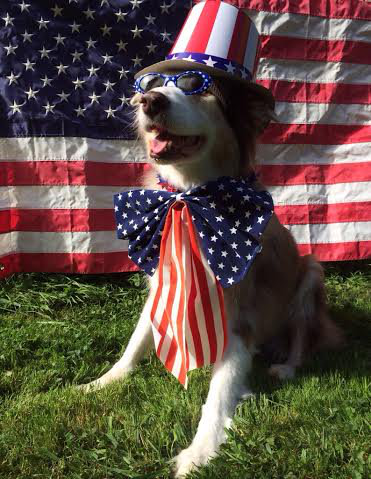

In [52]:
# show pictures
# 这行代码不报错需要魔法上网
# OK，这张图虽然是狗，但是1776明显是美国独立日啊~drop了drop了，惹不起惹不起~
url1 = "https://pbs.twimg.com/media/CmgBZ7kWcAAlzFD.jpg"
img1 = Image.open(requests.get(url1, stream=True).raw)
img1


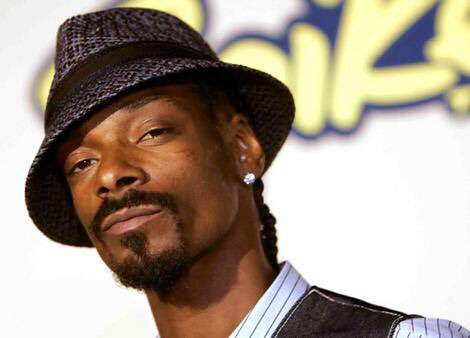

In [53]:
# show pictures
# 额这什么鬼~🤣
# 这行代码不报错需要魔法上网
url2 = "https://pbs.twimg.com/media/CU9P717W4AAOlKx.jpg"
img2 = Image.open(requests.get(url2, stream=True).raw)
img2


##### 6. `timestamp`列数据类型错误

In [54]:
dogrates_lite.head(1)

,tweet_id,timestamp,text,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,retweeted_status_id
0,892420643555336193,2017-08-01 16:23:56 +0000,This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,13,10,Phineas,None,None,None,None,NaN


In [55]:
dogrates_lite.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2075 entries, 0 to 2355
Data columns (total 11 columns):
tweet_id               2075 non-null int64
timestamp              2075 non-null object
text                   2075 non-null object
rating_numerator       2075 non-null int64
rating_denominator     2075 non-null int64
name                   2075 non-null object
doggo                  2075 non-null object
floofer                2075 non-null object
pupper                 2075 non-null object
puppo                  2075 non-null object
retweeted_status_id    81 non-null float64
dtypes: float64(1), int64(3), object(7)
memory usage: 274.5+ KB


##### 7. 数据集中包含大量转发的推特，造成了数据的重复

与此同时，观察可知，标定是否为转发推特的字段就是`retweeted_status_id`。当这一字段不为空时，对应的推特为转发。

In [56]:
# retweeted_status_id不为空的转发推特。text列都以“RT @”开头
retweeted_id_notnull.head(2)

,tweet_id,timestamp,text,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,retweeted_status_id
19,888202515573088257,2017-07-21 01:02:36 +0000,RT @dog_rates: This is Canela. She attempted some fancy porch pics. They were unsuccessful. 13/10 someone help her https://t.co/cLyzpcUcMX,13,10,Canela,None,None,None,None,8.874740e+17
36,885311592912609280,2017-07-13 01:35:06 +0000,RT @dog_rates: This is Lilly. She just parallel barked. Kindly requests a reward now. 13/10 would pet so well https://t.co/SATN4If5H5,13,10,Lilly,None,None,None,None,8.305833e+17


In [57]:
# 原创的推特条目
dogrates_lite[dogrates_lite['retweeted_status_id'].isnull()].head(2)

,tweet_id,timestamp,text,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,retweeted_status_id
0,892420643555336193,2017-08-01 16:23:56 +0000,This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,13,10,Phineas,None,None,None,None,NaN
1,892177421306343426,2017-08-01 00:17:27 +0000,"This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",13,10,Tilly,None,None,None,None,NaN


转发的推特有没有可能包含了主数据没有的信息呢？比如转发量？有可能，因此我们还进行如下测试：
- 找到一对转发信息和主信息；
- 分别检查对应的tweet_id在`breeds_lite`和`retweets_lite`数据集的对应数据。

In [58]:
# 获取一条转发的信息和一条主信息
# 就以上面出现的，35行的推特为例
# 至于为什么选35而不选19嘛~我才不告诉你19行对应的转发数据在retweet_lite数据集里不存在呢~
RT_info_test = dogrates_lite[dogrates_lite['text'].str.contains('This is Lilly. She just parallel barked. Kindly requests a reward now.', regex=False)]
RT_info_test

,tweet_id,timestamp,text,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,retweeted_status_id
36,885311592912609280,2017-07-13 01:35:06 +0000,RT @dog_rates: This is Lilly. She just parallel barked. Kindly requests a reward now. 13/10 would pet so well https://t.co/SATN4If5H5,13,10,Lilly,None,None,None,None,8.305833e+17
356,830583320585068544,2017-02-12 01:04:29 +0000,This is Lilly. She just parallel barked. Kindly requests a reward now. 13/10 would pet so well https://t.co/SATN4If5H5,13,10,Lilly,None,None,None,None,NaN


In [59]:
# 找出对应的id对应的breeds_lite数据集信息
ISIN(breeds_lite, RT_info_test, 'tweet_id')

,tweet_id,jpg_url,p1,p1_dog,p2_dog,p3_dog
1791,830583320585068544,https://pbs.twimg.com/media/C4bTH6nWMAAX_bJ.jpg,Labrador_retriever,True,False,True
2041,885311592912609280,https://pbs.twimg.com/media/C4bTH6nWMAAX_bJ.jpg,Labrador_retriever,True,False,True


In [60]:
# 找出对应的id对应的retweet_lite数据集信息
retweets_lite[(retweets_lite['id'].isin(RT_info_test['tweet_id']))]

,id,favorite_count,retweet_count
35,885311592912609280,0,19188
353,830583320585068544,73157,19188


我们发现，转发的推特对应的tweet_id，在`breeds_lite`数据集中与主信息完全一致；在`retweets_lite`数据集中，不仅转发推特`favorite_count`为0，主信息还完全继承了所有转发信息的`retweet_count`。  
  
因此，我们得出结论，所有转发的推特信息都可以直接清除，而无需担心去除可能会造成信息的缺失。

##### 2.2.1.3 准确性

`dogrates_lite`数据集

##### 1. 以下列只有一只狗，但被程序识别成了两个分类

In [61]:
# 计算分类数量的方法参考了以下链接：
# https://blog.csdn.net/u010606346/article/details/84778363
df1 = dogrates_lite.copy()
df1.replace(to_replace='None', value=np.nan, inplace=True, method=None)
# dgr2 = dogrates_lite.copy()
df1['stage_count'] = df1[['doggo', 'floofer',
                          'pupper', 'puppo']].notnull().sum(axis=1)
_2stages = df1[df1['stage_count'] > 1].sort_values(
    by='stage_count', ascending=False)


In [62]:
# 观察发现，所有有两条狗且分类不同的狗狗，都包含有both这个单词，但是有的大写有的小写
_2dogs_1tweet = _2stages[(_2stages['text'].str.contains(
    'both')) | (_2stages['text'].str.contains('Both'))]


In [63]:
# _2stages数据集中剩下的数据，就是需要手工清理的，一只狗两个分类的数据（well，起码没有证据证明它们不是一只狗）
_1dog_2stage = ISIN(_2stages, _2dogs_1tweet, 'tweet_id', mismatch=True)
_1dog_2stage


,tweet_id,timestamp,text,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,retweeted_status_id,stage_count
191,855851453814013952,2017-04-22 18:31:02 +0000,Here's a puppo participating in the #ScienceMarch. Cleverly disguising her own doggo agenda. 13/10 would keep the planet habitable for https://t.co/cMhq16isel,13,10,NaN,doggo,NaN,NaN,puppo,NaN,2
200,854010172552949760,2017-04-17 16:34:26 +0000,"At first I thought this was a shy doggo, but it's actually a Rare Canadian Floofer Owl. Amateurs would confuse the two. 11/10 only send dogs https://t.co/TXdT3tmuYk",11,10,NaN,doggo,floofer,NaN,NaN,NaN,2
460,817777686764523521,2017-01-07 16:59:28 +0000,"This is Dido. She's playing the lead role in ""Pupper Stops to Catch Snow Before Resuming Shadow Box with Dried Apple."" 13/10 (IG: didodoggo) https://t.co/m7isZrOBX7",13,10,Dido,doggo,NaN,pupper,NaN,NaN,2
575,801115127852503040,2016-11-22 17:28:25 +0000,This is Bones. He's being haunted by another doggo of roughly the same size. 12/10 deep breaths pupper everything's fine https://t.co/55Dqe0SJNj,12,10,Bones,doggo,NaN,pupper,NaN,NaN,2
705,785639753186217984,2016-10-11 00:34:48 +0000,This is Pinot. He's a sophisticated doggo. You can tell by the hat. Also pointier than your average pupper. Still 10/10 would pet cautiously https://t.co/f2wmLZTPHd,10,10,Pinot,doggo,NaN,pupper,NaN,NaN,2
956,751583847268179968,2016-07-09 01:08:47 +0000,Please stop sending it pictures that don't even have a doggo or pupper in them. Churlish af. 5/10 neat couch tho https://t.co/u2c9c7qSg8,5,10,NaN,doggo,NaN,pupper,NaN,NaN,2


##### 2.2.1.4 连续性

`dogrates_lite`数据集

##### 1. 以下列,一条推文对应两个狗狗的分类
  
这个部分中，一列中确实包含了两只狗狗的信息；这是因为两只狗同框且分数一致，但两种狗狗的分类不同导致的；

In [64]:
# observe
_2dogs_1tweet


,tweet_id,timestamp,text,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,retweeted_status_id,stage_count
531,808106460588765185,2016-12-12 00:29:28 +0000,Here we have Burke (pupper) and Dexter (doggo). Pupper wants to be exactly like doggo. Both 12/10 would pet at same time https://t.co/ANBpEYHaho,12,10,NaN,doggo,NaN,pupper,NaN,NaN,2
565,802265048156610565,2016-11-25 21:37:47 +0000,"Like doggo, like pupper version 2. Both 11/10 https://t.co/9IxWAXFqze",11,10,NaN,doggo,NaN,pupper,NaN,NaN,2
778,775898661951791106,2016-09-14 03:27:11 +0000,"RT @dog_rates: Like father (doggo), like son (pupper). Both 12/10 https://t.co/pG2inLaOda",12,10,NaN,doggo,NaN,pupper,NaN,7.331095e+17,2
822,770093767776997377,2016-08-29 03:00:36 +0000,RT @dog_rates: This is just downright precious af. 12/10 for both pupper and doggo https://t.co/o5J479bZUC,12,10,just,doggo,NaN,pupper,NaN,7.410673e+17,2
889,759793422261743616,2016-07-31 16:50:42 +0000,"Meet Maggie &amp; Lila. Maggie is the doggo, Lila is the pupper. They are sisters. Both 12/10 would pet at the same time https://t.co/MYwR4DQKll",12,10,Maggie,doggo,NaN,pupper,NaN,NaN,2
1063,741067306818797568,2016-06-10 00:39:48 +0000,This is just downright precious af. 12/10 for both pupper and doggo https://t.co/o5J479bZUC,12,10,just,doggo,NaN,pupper,NaN,NaN,2
1113,733109485275860992,2016-05-19 01:38:16 +0000,"Like father (doggo), like son (pupper). Both 12/10 https://t.co/pG2inLaOda",12,10,NaN,doggo,NaN,pupper,NaN,NaN,2


其实`dogrates_lite`数据集里，还有很多条推特信息给多只狗狗同时打了分，下面的代码块将展示这个部分。
  
但是，与上述代码不同，其基本遵照了多只狗狗相同分数，且都属于同一生长阶段。确实有可能影响最后的分析。但考虑到影响主要体现在狗狗的名字和生长阶段，因此我们不做特殊处理。

In [65]:
# 含有多只狗狗的推特条目示例
df2 = dogrates_lite[dogrates_lite['text'].str.contains('&amp;')]
df2.head()


,tweet_id,timestamp,text,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,retweeted_status_id
262,842765311967449089,2017-03-17 15:51:22 +0000,Meet Indie. She's not a fan of baths but she's definitely a fan of hide &amp; seek. 12/10 click the link to help Indie\n\nhttps://t.co/fvGkIuAlFK https://t.co/kiCFtmJd7l,12,10,Indie,None,None,None,None,NaN
320,834458053273591808,2017-02-22 17:41:18 +0000,"Meet Chester (bottom) &amp; Harold (top). They are different dogs not only in appearance, but in personality as well. Both 12/10 symbiotic af https://t.co/8ZOZS2FSJe",12,10,Chester,None,None,None,None,NaN
461,817536400337801217,2017-01-07 01:00:41 +0000,"Say hello to Eugene &amp; Patti Melt. No matter how dysfunctional they get, they will never top their owners. Both 12/10 would pet at same time https://t.co/jQUdvtdYMu",12,10,Eugene,None,None,None,None,NaN
516,810984652412424192,2016-12-19 23:06:23 +0000,Meet Sam. She smiles 24/7 &amp; secretly aspires to be a reindeer. \nKeep Sam smiling by clicking and sharing this link:\nhttps://t.co/98tB8y7y7t https://t.co/LouL5vdvxx,24,7,Sam,None,None,None,None,NaN
799,772826264096874500,2016-09-05 15:58:34 +0000,Meet Roosevelt. He's preparing for takeoff. Make sure tray tables are in their full pupright &amp; licked position\n11/10 https://t.co/7CQkn3gHOQ,11,10,Roosevelt,None,None,None,None,NaN


`retweets_lite`数据集

##### 2. 名为`id`，代表其他数据集中`tewwt_id`列数据的列，应更名为`tweet_id`

In [66]:
retweets_lite.head(1)


,id,favorite_count,retweet_count
0,892420643555336193,39492,8842


##### 2.2.1.5 其他

接2.2.1.2。

在上述章节中，我们讨论了分子信息被错误提取，导致分母和分子信息被错误提取的问题。当时，我们发现，这一问题是由于推文中存在两个含有“/”符号和周围数字组成的组合，而上一个处理这一数据的人没有留意到这一点。因此，她/他的程序返回了第一个正则表达式匹配到的数值，而很不幸的，在这些推文中，正确的分数往往都是第二组数字。  

在整理出了包含上述错误信息的数据集后，我们提出了进一步的疑问：有没有可能数据集中还有其他推文，也包含两个数字，但因为两个数字都是正确的分数，导致我们没能筛查到呢？如果这种情况真的存在，那也就意味着在我们的分析当中，有一部分狗狗的分数没有被体现。这显然不怎么公平。为了更好的探索这一数据集，也为了保证这一探索的严谨性，我们进行如下探索：

- 我们将通过正则表达式，匹配所有含有两组数字的推文；
- 在提取这些推文的index标签之后，我们与2.2.1.2中得出的teeets_multiple_number数据集进行交叉对比，并筛选出不在teeets_multiple_number中的条目；
- 我们将把上述条目保存为tweets_multiple_number_case2数据集。

In [67]:
# 匹配推文中含有两个数字
pattern_score_multinumbers0 = r'([\d]+\/\d+)\D+([\d]+\/[\d]+)'

multiple_number1 = dogrates_lite['text'].str.findall(
    pattern_score_multinumbers0)

# 取两数据集差集
index_multiple_number_case2 = list(set(multiple_number1[multiple_number1.str.len(
) != 0].index.tolist()) ^ set(tweets_multiple_number.index.tolist()))

# 不包含tweets_multiple_number数据集内容，但又被正则表达式匹配出的，其他含有两组数字的数据
tweets_multiple_number_case2 = dogrates_lite.loc[index_multiple_number_case2]
tweets_multiple_number_case2


,tweet_id,timestamp,text,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,retweeted_status_id
2177,669037058363662336,2015-11-24 06:17:19 +0000,"Here we have Pancho and Peaches. Pancho is a Condoleezza Gryffindor, and Peaches is just an asshole. 10/10 &amp; 7/10 https://t.co/Lh1BsJrWPp",10,10,None,None,None,None,None,NaN
1538,689835978131935233,2016-01-20 15:44:48 +0000,Meet Fynn &amp; Taco. Fynn is an all-powerful leaf lord and Taco is in the wrong place at the wrong time. 11/10 &amp; 10/10 https://t.co/MuqHPvtL8c,11,10,Fynn,None,None,None,None,NaN
1795,677314812125323265,2015-12-17 02:30:09 +0000,"Meet Tassy &amp; Bee. Tassy is pretty chill, but Bee is convinced the Ruffles are haunted. 10/10 &amp; 11/10 respectively https://t.co/fgORpmTN9C",10,10,Tassy,None,None,None,None,NaN
2306,666835007768551424,2015-11-18 04:27:09 +0000,These are Peruvian Feldspars. Their names are Cupit and Prencer. Both resemble Rand Paul. Sick outfits 10/10 &amp; 10/10 https://t.co/ZnEMHBsAs1,10,10,None,None,None,None,None,NaN
2113,670434127938719744,2015-11-28 02:48:46 +0000,Meet Hank and Sully. Hank is very proud of the pumpkin they found and Sully doesn't give a shit. 11/10 and 8/10 https://t.co/cwoP1ftbrj,11,10,Hank,None,None,None,None,NaN
...,...,...,...,...,...,...,...,...,...,...,...
1970,673295268553605120,2015-12-06 00:17:55 +0000,Meet Eve. She's a raging alcoholic 8/10 (would b 11/10 but pupper alcoholism is a tragic issue that I can't condone) https://t.co/U36HYQIijg,8,10,Eve,None,None,pupper,None,NaN
1459,695064344191721472,2016-02-04 02:00:27 +0000,"This may be the greatest video I've ever been sent. 4/10 for Charles the puppy, 13/10 overall. (Vid by @stevenxx_) https://t.co/uaJmNgXR2P",4,10,None,None,None,None,None,NaN
1525,690400367696297985,2016-01-22 05:07:29 +0000,This is Eriq. His friend just reminded him of last year's super bowl. Not cool friend\n10/10 for Eriq\n6/10 for friend https://t.co/PlEXTofdpf,10,10,Eriq,None,None,None,None,NaN
1465,694352839993344000,2016-02-02 02:53:12 +0000,Meet Oliviér. He takes killer selfies. Has a dog of his own. It leaps at random &amp; can't bark for shit. 10/10 &amp; 5/10 https://t.co/6NgsQJuSBJ,10,10,Oliviér,None,None,None,None,NaN


唔看来问题不算少。就此，我们提出最后一个数据质量问题：

##### 1. 以下行，存在多只狗狗分别打分的情况，导致有的狗狗分数没有体现在最终的分数中

In [68]:
tweets_multiple_number_case2


,tweet_id,timestamp,text,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,retweeted_status_id
2177,669037058363662336,2015-11-24 06:17:19 +0000,"Here we have Pancho and Peaches. Pancho is a Condoleezza Gryffindor, and Peaches is just an asshole. 10/10 &amp; 7/10 https://t.co/Lh1BsJrWPp",10,10,None,None,None,None,None,NaN
1538,689835978131935233,2016-01-20 15:44:48 +0000,Meet Fynn &amp; Taco. Fynn is an all-powerful leaf lord and Taco is in the wrong place at the wrong time. 11/10 &amp; 10/10 https://t.co/MuqHPvtL8c,11,10,Fynn,None,None,None,None,NaN
1795,677314812125323265,2015-12-17 02:30:09 +0000,"Meet Tassy &amp; Bee. Tassy is pretty chill, but Bee is convinced the Ruffles are haunted. 10/10 &amp; 11/10 respectively https://t.co/fgORpmTN9C",10,10,Tassy,None,None,None,None,NaN
2306,666835007768551424,2015-11-18 04:27:09 +0000,These are Peruvian Feldspars. Their names are Cupit and Prencer. Both resemble Rand Paul. Sick outfits 10/10 &amp; 10/10 https://t.co/ZnEMHBsAs1,10,10,None,None,None,None,None,NaN
2113,670434127938719744,2015-11-28 02:48:46 +0000,Meet Hank and Sully. Hank is very proud of the pumpkin they found and Sully doesn't give a shit. 11/10 and 8/10 https://t.co/cwoP1ftbrj,11,10,Hank,None,None,None,None,NaN
...,...,...,...,...,...,...,...,...,...,...,...
1970,673295268553605120,2015-12-06 00:17:55 +0000,Meet Eve. She's a raging alcoholic 8/10 (would b 11/10 but pupper alcoholism is a tragic issue that I can't condone) https://t.co/U36HYQIijg,8,10,Eve,None,None,pupper,None,NaN
1459,695064344191721472,2016-02-04 02:00:27 +0000,"This may be the greatest video I've ever been sent. 4/10 for Charles the puppy, 13/10 overall. (Vid by @stevenxx_) https://t.co/uaJmNgXR2P",4,10,None,None,None,None,None,NaN
1525,690400367696297985,2016-01-22 05:07:29 +0000,This is Eriq. His friend just reminded him of last year's super bowl. Not cool friend\n10/10 for Eriq\n6/10 for friend https://t.co/PlEXTofdpf,10,10,Eriq,None,None,None,None,NaN
1465,694352839993344000,2016-02-02 02:53:12 +0000,Meet Oliviér. He takes killer selfies. Has a dog of his own. It leaps at random &amp; can't bark for shit. 10/10 &amp; 5/10 https://t.co/6NgsQJuSBJ,10,10,Oliviér,None,None,None,None,NaN


#### 2.2.2 整洁度问题

传统上，整洁度的标准依照R语言大神Hadley Wickham在其划时代的论文[Tidy Data](http://vita.had.co.nz/papers/tidy-data.pdf)中指出的那样，主要由三个标准组成：
 
 - 每个变量构成一列
 - 每个结果构成一行
 - 每个观察类别构成一张表
 
使用这样的方式整理数据，使得后续的程序编写和分析都轻松愉快。依照这样的标准，我们发现了如下问题：

`dogrates_lite`数据集

##### 1. 标明狗狗“doggo, floofer, pupper, puppo”的列，应该作为一列

In [69]:
dogrates_lite.head(1)


,tweet_id,timestamp,text,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,retweeted_status_id
0,892420643555336193,2017-08-01 16:23:56 +0000,This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,13,10,Phineas,None,None,None,None,NaN


综合

##### 1. 本报告使用的三个数据集应当合并
- 包含转发和点赞信息的`retweet_lite`数据集，毫无疑问，应该与`dogrates_lite`数据集合并。这两个数据集观察的对象都是一条条的推特； 
- 根据图像预测狗狗品种的数据集`breeds_lite`与`dogrates_lite`数据集本质上观察对象一致。图像终究是为推文服务，也是推特的一部分。

#### 2.2.3 其他

我们注意到，推文中大量使用了第三人称代词，且两种性别都有。下面展示了数据集的前两行，其中就包括了两种性别的狗狗。

推文依赖的第三人称代词表示性别，也就意味着从推文中推断出狗狗的性别是有可能的，而这一属性的加入可能能为我们带来新的思路。尽管进行绝育的狗狗可能不会有明显的性别差异（加入绝大多数推文中的狗狗都已经绝育），不同性别的狗狗同样可能有行为上的差异。

我们将尝试提取每条推文中对应狗狗的性别信息。探索我们可能会发现什么。

In [70]:
dogrates_lite.head(2)

,tweet_id,timestamp,text,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,retweeted_status_id
0,892420643555336193,2017-08-01 16:23:56 +0000,This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,13,10,Phineas,None,None,None,None,NaN
1,892177421306343426,2017-08-01 00:17:27 +0000,"This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",13,10,Tilly,None,None,None,None,NaN


#### 2.2.4 小结

截至目前，我们已经发现了如下问题：

> 质量
1. `dogrates_lite`数据集中，`name`列有大量空值，和错误的情况；
2. `dogrates_lite`数据集中，部分数据错误的提取了其他包含“/”的文本作为分数，这些数据被保存在了`tweets_mulpitple_number`数据集中;
3. `dogrates_lite`数据集中，有一行数据虽然包含数字，但是一条筹款的推文，并不包含评分；这条数据被保存在了`tweets_fund_raise`数据集中；
4. `dogrates_lite`数据集中，部分数据存在多只狗狗统一打（总）分的情况，导致这些条目的分子和分母显著较高；这些数据储存在`tweets_multiple_dogs`中；
5. `dogrates_lite`数据集中，部分数据存在推文主题真的是狗狗的情况下，有分子提取错误的情况；主要体现在这些分数为了某些纪念日等，使用了特殊的小数分数；这些数据储存在`tweets_wrong_numerator_dog`中；
6. `dogrates_lite`数据集中，部分数据在主题可能不是狗的情况下，有分子提取错误的情况；这些数据储存在了`tweets_wrong numerator_NOT_dog`数据集中；
7. `dogrates_lite`数据集中，`timestamp`列数据类型错误；
8. `dogrates_lite`数据集中，有部分数据属于转发的推特，与原始数据重复；
8. `dogrates_lite`数据集中，部分数据里只有一只狗，却因为text列中包含两个狗狗分类的信息，而拥有两个分类；这些数据被储存在了`_1dog_2stage`数据集中；
9. `dogrates_lite`数据集中，部分数据，一条推特对两只处于不同生长阶段的打了同样的分数，因此拥有两个分类；这些数据被储存在了`_2dogs_1tweet`数据集中；
10. `retweets_lite`数据集中，`id`列应更名为`tweets_id`，与`dogrates_lite`和`breeds_lite`保持一致；
11. `dogrates_lite`数据集中，有部分数据包含两组正确的分数，但只提取了一组；这些数据被保存在了`tweets_multiple_number_case2`数据集中（`tweets_multiple_number`中的数据不在此列）。

> 整洁度
1. `dogrates_lite`数据集中，`doggo``floofer``pupper``puppo`四列是一个变量的观察结果，应该被储存在一列中；
2. 包含转发和点赞信息的`retweets_lite`数据集和`dogrates_lite`数据集应当合并，因其观察的而对象是相同的。

> 其他
1. 提取推文中狗狗的性别因素

## 3 数据的清洗、整理及初步探索
------

In [71]:
# 准备数据集
dogrates_clean = dogrates_lite.copy()
breeds_clean = breeds_lite.copy()
retweets_clean = retweets_lite.copy()


要对已经发现的数据问题进行清洗和整理，我们首先需要备份我们已有的数据集（见上）。我们统一为干净的数据集名称加上`_clean`的尾缀。  
  
因为数据集的问题委实不少，我们确定如下清理顺序：
- 首先，将需要剔除的数据全部剔除；
- 其次，将缺失的name数据补齐，顺便修复其错误；
- 再次，我们将集中处理再分类列中的问题；
- 再次，我们将集中处理分数中的各种问题；
- 再次，我们会处理其他质量问题；
- 最后，我们将处理整洁度问题。

因为数据集情况比较复杂，我们决定，在此项报告中，所有清洗出的数据都必须遵照一条tweet_id对应一行的原则。原因如下：
- 数据集中有大量的缺失情况；
- 数据集的文本包含的信息，前后不一定对应；这种对应包括了数据的颗粒度和完整度；
- 除tweet_id之外，没有一个唯一辨识符贯穿整个数据集；
- 上述所有情况综合起来，意味着使用`.melt`函数后，我们将面临大量的重复数据，且我们没有很好的办法筛选出准确的数据。

这一原则也同样意味着：
- 如果一条推文中有多只狗狗的名字，我们需要将两个名字合并，作为一个值；
- 如果图片中出现了两只不同分类的狗狗，他们的分类也必须合并，作为一个值；
- 如果图片中出现了多个分数，我们需要计算平均分。


### 3.1 质量问题

#### 1. 该删的删

##### 去除筹款推文

In [72]:
# observe
tweets_fund_raise


,tweet_id,timestamp,text,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,retweeted_status_id
516,810984652412424192,2016-12-19 23:06:23 +0000,Meet Sam. She smiles 24/7 &amp; secretly aspires to be a reindeer. \nKeep Sam smiling by clicking and sharing this link:\nhttps://t.co/98tB8y7y7t https://t.co/LouL5vdvxx,24,7,Sam,None,None,None,None,NaN


`define`: 使用drop方法， 删除行标签为516的行

In [73]:
# code
dogrates_clean.drop([516], axis=0, inplace=True)


In [74]:
# test
dogrates_clean[dogrates_clean.index == 516]


,tweet_id,timestamp,text,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,retweeted_status_id


Test OK!

##### 去除主题不是狗，且分数异常的干扰数据

In [75]:
# observe
tweets_wrong_numerator_NOT_dog


,tweet_id,timestamp,text,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,retweeted_status_id
979,749981277374128128,2016-07-04 15:00:45 +0000,This is Atticus. He's quite simply America af. 1776/10 https://t.co/GRXwMxLBkh,1776,10,Atticus,None,None,None,None,NaN
2074,670842764863651840,2015-11-29 05:52:33 +0000,After so many requests... here you go.\n\nGood dogg. 420/10 https://t.co/yfAAo1gdeY,420,10,None,None,None,None,None,NaN


In [76]:
# code
dogrates_clean.drop([979, 2074], axis=0, inplace=True)


In [77]:
# test
ISIN(dogrates_clean, tweets_wrong_numerator_NOT_dog, 'tweet_id')


,tweet_id,timestamp,text,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,retweeted_status_id


Test OK!

##### 删除与主数据重复的转发推特数据

`define`: 正如我们在2.2.1.2章节第7小节中叙述的那样，直接清除转发推特数据不会造成任何影响；
  
鉴于我们之前已经根据retweeted_status_id这一字段筛选出了转发的推特数据，并确认了这一字段时一条推特是否为转发推特判断的充分必要条件，我们可以根据这一数据集清除转发推特数据，并进行测试。

In [78]:
# code
dogrates_clean = ISIN(dogrates_clean, retweeted_id_notnull,
                      'tweet_id', mismatch=True)
dogrates_clean.drop(columns='retweeted_status_id', inplace=True)


In [79]:
# test
pattern_RT = r'(^RT\s\@\w+:\s)'
tweets_RT = dogrates_clean['text'].str.findall(pattern_RT)
tweets_RT[tweets_RT.str.len() != 0]


Series([], Name: text, dtype: object)

In [80]:
dogrates_clean.head(2)


,tweet_id,timestamp,text,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,2017-08-01 16:23:56 +0000,This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,13,10,Phineas,None,None,None,None
1,892177421306343426,2017-08-01 00:17:27 +0000,"This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",13,10,Tilly,None,None,None,None


Test OK! 成功去掉了转发的推特数据！😎

#### 2. 该补的补

#####  修复`name`列有大量空值和错误的情况

`define`: 这个部分中，我们将重新提取名字信息，并想办法好看的合并多个名字。细节如下：

- 我们将通过正则表达式重新提取名字信息；有两只狗狗的情况下，我们会把多的名字保存在新的`name2`列之中;重新提取的名字信息将保存在`dog_names_reworked`数据集中；
- 随后，我们将根据`name2`列中的值是否为空，判断图片中的狗狗是否只有一只；这一值会被保存在`singe_dog`列中；
- 随后，我们将按照既定原则生成一个综合的name列来替换原`dogrates_clean`数据集中的同名列；这其中包括：
    - 处理`name2`中的`NaN`值，以为后续合并做准备；
    - 合并`name1`和`name2`列；
    - 当`single_dog`列为`False`时，`name1`和`name2`将被" & "链接；
    - 其他情况下，`name`列都将与`name1`列的值保持一致。
- 最后，我们将调整`dog_names_reworked`和`dogrates_clean`两个数据集，并将两个数据集合并。

观察推文中的名字：
> 推文中出现狗狗名字的推文规律一览：
> - These are Peruvian Feldspars. Their names are Cupit and Prencer. Both resemble Rand Paul. Sick outfits 10/10 &amp; 10/10 https://t.co/ZnEMHBsAs1;  
> - This is Ben &amp; Carson. It's impossible for them to tilt their heads in the same direction. Cheeky wink by Ben. 11/10s https://t.co/465sIBdvzU;  
> - This is Pipsy. He is a fluffball. Enjoys traveling the sea &amp; getting tangled in leash. 12/10 I would kill for Pipsy https://t.co/h9R0EwKd9X;  
> - These two dogs are Bo &amp; Smittens. Smittens is trying out a new deodorant and wanted Bo to smell it. 10/10 true pals https://t.co/4pw1QQ6udh;  
> - Say hello to Bobb. Bobb is a Golden High Fescue &amp; a proud father of 8. Bobb sleeps while the little pups play. 11/10 https://t.co/OmxouCZ8IY;  
> - Meet Jaycob. He got scared of the vacuum. Hide &amp; seek champ. Almost better than Kony. Solid shampoo selection. 10/10 https://t.co/952hUV6RiK;  
> - Meet Jeb &amp; Bush. Jeb is somehow stuck in that fence and Bush won't stop whispering sweet nothings in his ear. 9/10s https://t.co/NRNExUy9Hm;  
> - Here we have Pancho and Peaches. Pancho is a Condoleezza Gryffindor, and Peaches is just an asshole. 10/10 &amp; 7/10 https://t.co/Lh1BsJrWPp;  

我们提取狗狗名字时应当利用的规律总结如下：  
> 所有的名字出现之时，都跟随着如下句式(名字的位置用name/names代替）：
> - This is `name(s)`/These are `names`;
> - These two dogs are `names`;
> - Say hello to `name`;
> - Meet name/Meet `names`;
> - Here we have `names`;

In [81]:
# code
# 重新提取名字；考虑到有不少两只狗的情况，提取到的第二个名字单独保存为一列；
pattern_multiple_names = r'(?:Say hello to|This is|These two dogs are|Meet|Here we have|Their names are)\s(?P<name1>[A-Z][a-z]*)\s?(?:and|&amp;)?\s?(?P<name2>[A-Z][a-z]*)?(?:\s[A-Z][a-z]*\.)?'
dog_names_reworked = dogrates_clean['text'].str.extract(pattern_multiple_names)

# 新增一列SingleDog，用于确定推文中是否只有一只狗。若为True，则只有一只狗；若False，则可能有多只
dog_names_reworked['single_dog'] = dog_names_reworked['name2'].isna()

# 为了简洁性，准备合并name1和name2列
# 合并之前，需要清理name2列中的NaN数据
dog_names_reworked['name2'].fillna(value='', inplace=True)

# 为了更好的体验，我们加入一列作为两个名字之间的连接符；将最终的结果输出为name列后，去掉不相干的列
# https://stackoverflow.com/questions/19913659/pandas-conditional-creation-of-a-series-dataframe-column
# 这个地方应该有更好的办法
dog_names_reworked['connector'] = np.where(
    dog_names_reworked['single_dog'] == False, " & ", "")
dog_names_reworked['name'] = dog_names_reworked['name1'] + \
    dog_names_reworked['connector'] + dog_names_reworked['name2']
dog_names_reworked.drop(columns=['name1', 'name2', 'connector'], inplace=True)

# drop掉dogrates_clean数据集原有的name列，然后将两数据集合并
dogrates_clean.drop(columns='name', inplace=True)
dogrates_clean = dogrates_clean.join(dog_names_reworked)


In [82]:
# test-1
dog_names_reworked.loc[[1, 461, 1366]]


,single_dog,name
1,True,Tilly
461,False,Eugene & Patti
1366,False,Rambo & Kiwi


In [83]:
# test-2
dogrates_clean.loc[[1, 461, 1366]]


,tweet_id,timestamp,text,rating_numerator,rating_denominator,doggo,floofer,pupper,puppo,single_dog,name
1,892177421306343426,2017-08-01 00:17:27 +0000,"This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",13,10,None,None,None,None,True,Tilly
461,817536400337801217,2017-01-07 01:00:41 +0000,"Say hello to Eugene &amp; Patti Melt. No matter how dysfunctional they get, they will never top their owners. Both 12/10 would pet at same time https://t.co/jQUdvtdYMu",12,10,None,None,None,None,False,Eugene & Patti
1366,702671118226825216,2016-02-25 01:47:04 +0000,Meet Rambo &amp; Kiwi. Rambo's the pup with the sharp toes &amp; rad mohawk. One stays woke while one sleeps. 10/10 for both https://t.co/MpH1Fe9LhZ,10,10,None,None,None,None,False,Rambo & Kiwi


In [84]:
# test-3
dogrates_clean['name'].value_counts()


Charlie    11
Cooper     10
Oliver     10
Lucy        9
Tucker      9
           ..
Berb        1
Pluto       1
Patch       1
Tessa       1
Willem      1
Name: name, Length: 938, dtype: int64

Test OK!😎 没有什么乱七八糟的名字了！两只在一起的狗狗也真的在一起了！

#### 3. 该改的改（分类）

##### 修复一狗两类的问题

In [85]:
# observe
_1dog_2stage


,tweet_id,timestamp,text,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,retweeted_status_id,stage_count
191,855851453814013952,2017-04-22 18:31:02 +0000,Here's a puppo participating in the #ScienceMarch. Cleverly disguising her own doggo agenda. 13/10 would keep the planet habitable for https://t.co/cMhq16isel,13,10,NaN,doggo,NaN,NaN,puppo,NaN,2
200,854010172552949760,2017-04-17 16:34:26 +0000,"At first I thought this was a shy doggo, but it's actually a Rare Canadian Floofer Owl. Amateurs would confuse the two. 11/10 only send dogs https://t.co/TXdT3tmuYk",11,10,NaN,doggo,floofer,NaN,NaN,NaN,2
460,817777686764523521,2017-01-07 16:59:28 +0000,"This is Dido. She's playing the lead role in ""Pupper Stops to Catch Snow Before Resuming Shadow Box with Dried Apple."" 13/10 (IG: didodoggo) https://t.co/m7isZrOBX7",13,10,Dido,doggo,NaN,pupper,NaN,NaN,2
575,801115127852503040,2016-11-22 17:28:25 +0000,This is Bones. He's being haunted by another doggo of roughly the same size. 12/10 deep breaths pupper everything's fine https://t.co/55Dqe0SJNj,12,10,Bones,doggo,NaN,pupper,NaN,NaN,2
705,785639753186217984,2016-10-11 00:34:48 +0000,This is Pinot. He's a sophisticated doggo. You can tell by the hat. Also pointier than your average pupper. Still 10/10 would pet cautiously https://t.co/f2wmLZTPHd,10,10,Pinot,doggo,NaN,pupper,NaN,NaN,2
956,751583847268179968,2016-07-09 01:08:47 +0000,Please stop sending it pictures that don't even have a doggo or pupper in them. Churlish af. 5/10 neat couch tho https://t.co/u2c9c7qSg8,5,10,NaN,doggo,NaN,pupper,NaN,NaN,2


在这个错误中，推主自己在推文中列举了几个容易混淆的狗狗类型，导致这些狗狗实际上拥有多个分类。

好吧~没什么特别好的办法，手工改一下🤢。手工更改的方法参考了[这篇文章（output 42）](https://blog.csdn.net/u010606346/article/details/84778363)。  
  
问题主要集中在`doggo`和`pupper`两列：
- 第191， 200， 575， 956行的推文提到的狗狗，不是doggo;
- 第460，705，956行的推文提到的狗狗，不是pupper。

In [86]:
# code-1
dic_doggo = {191: np.nan, 200: np.nan, 575: np.nan, 956: np.nan}

for (key, value) in dic_doggo.items():
    dogrates_clean.loc[key, 'doggo'] = value


In [87]:
# code-2
dic_pupper = {460: np.nan, 705: np.nan, 956: np.nan}

for (key, value) in dic_pupper.items():
    dogrates_clean.loc[key, 'pupper'] = value


In [88]:
# test
dogrates_clean.loc[_1dog_2stage.index.tolist()]


,tweet_id,timestamp,text,rating_numerator,rating_denominator,doggo,floofer,pupper,puppo,single_dog,name
191,855851453814013952,2017-04-22 18:31:02 +0000,Here's a puppo participating in the #ScienceMarch. Cleverly disguising her own doggo agenda. 13/10 would keep the planet habitable for https://t.co/cMhq16isel,13,10,NaN,None,None,puppo,True,NaN
200,854010172552949760,2017-04-17 16:34:26 +0000,"At first I thought this was a shy doggo, but it's actually a Rare Canadian Floofer Owl. Amateurs would confuse the two. 11/10 only send dogs https://t.co/TXdT3tmuYk",11,10,NaN,floofer,None,None,True,NaN
460,817777686764523521,2017-01-07 16:59:28 +0000,"This is Dido. She's playing the lead role in ""Pupper Stops to Catch Snow Before Resuming Shadow Box with Dried Apple."" 13/10 (IG: didodoggo) https://t.co/m7isZrOBX7",13,10,doggo,None,NaN,None,True,Dido
575,801115127852503040,2016-11-22 17:28:25 +0000,This is Bones. He's being haunted by another doggo of roughly the same size. 12/10 deep breaths pupper everything's fine https://t.co/55Dqe0SJNj,12,10,NaN,None,pupper,None,True,Bones
705,785639753186217984,2016-10-11 00:34:48 +0000,This is Pinot. He's a sophisticated doggo. You can tell by the hat. Also pointier than your average pupper. Still 10/10 would pet cautiously https://t.co/f2wmLZTPHd,10,10,doggo,None,NaN,None,True,Pinot
956,751583847268179968,2016-07-09 01:08:47 +0000,Please stop sending it pictures that don't even have a doggo or pupper in them. Churlish af. 5/10 neat couch tho https://t.co/u2c9c7qSg8,5,10,NaN,None,NaN,None,True,NaN


Test OK!😎 没有什么奇怪的一狗两态了！

##### 修复一条推特对两只处于不同生长阶段的打了同样的分数，因此拥有两个分类的问题

In [89]:
# observe
_2dogs_1tweet


,tweet_id,timestamp,text,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,retweeted_status_id,stage_count
531,808106460588765185,2016-12-12 00:29:28 +0000,Here we have Burke (pupper) and Dexter (doggo). Pupper wants to be exactly like doggo. Both 12/10 would pet at same time https://t.co/ANBpEYHaho,12,10,NaN,doggo,NaN,pupper,NaN,NaN,2
565,802265048156610565,2016-11-25 21:37:47 +0000,"Like doggo, like pupper version 2. Both 11/10 https://t.co/9IxWAXFqze",11,10,NaN,doggo,NaN,pupper,NaN,NaN,2
778,775898661951791106,2016-09-14 03:27:11 +0000,"RT @dog_rates: Like father (doggo), like son (pupper). Both 12/10 https://t.co/pG2inLaOda",12,10,NaN,doggo,NaN,pupper,NaN,7.331095e+17,2
822,770093767776997377,2016-08-29 03:00:36 +0000,RT @dog_rates: This is just downright precious af. 12/10 for both pupper and doggo https://t.co/o5J479bZUC,12,10,just,doggo,NaN,pupper,NaN,7.410673e+17,2
889,759793422261743616,2016-07-31 16:50:42 +0000,"Meet Maggie &amp; Lila. Maggie is the doggo, Lila is the pupper. They are sisters. Both 12/10 would pet at the same time https://t.co/MYwR4DQKll",12,10,Maggie,doggo,NaN,pupper,NaN,NaN,2
1063,741067306818797568,2016-06-10 00:39:48 +0000,This is just downright precious af. 12/10 for both pupper and doggo https://t.co/o5J479bZUC,12,10,just,doggo,NaN,pupper,NaN,NaN,2
1113,733109485275860992,2016-05-19 01:38:16 +0000,"Like father (doggo), like son (pupper). Both 12/10 https://t.co/pG2inLaOda",12,10,NaN,doggo,NaN,pupper,NaN,NaN,2


看来全部都是大狗(Doggo)带小狗(Pupper)啊!  ^0^  
  
`define`: 这个部分中的，根据既定原则，我们将想办法合并有多个生长状态分类的推特。细节如下：
- 首先将四个生长分类列的`None`替换为`Nan`。尽管`_2dogs_1tweet`中的分类空值都已被转换为`NaN`，但在`dogrates_clean`数据集中我们还没有进行相应的转化；
- 随后，我们对每条推特的生长状态进行计数；
- 随后，我们对不同的列进行合并；如果有不同的分类，不同的分类之间使用" & "进行连接；
- 随后，我们将去掉我们不再需要的列，并进行向相关测试；
- 最后，我们会清理我们的操作产生的''值，将他们重新替换为`Not Specified`，以更好的认知这一分类的影响。

In [90]:
# code
# 首先将'None'处理为NaN，方便计数
dogrates_clean.replace(to_replace='None', value=np.nan,
                       inplace=True, method=None)

# 计算狗狗的分类数量
dogrates_clean['stage_count'] = dogrates_clean[['doggo', 'floofer',
                                                'pupper', 'puppo']].notnull().sum(axis=1)

# 为了更好的体验，我们加入一个临时列作为两个名字之间的连接符；将最终的结果输出为name列后，去掉不相干的列
# https://stackoverflow.com/questions/19913659/pandas-conditional-creation-of-a-series-dataframe-column
# 这个地方应该有更好的办法
dogrates_clean['connector'] = np.where(
    dogrates_clean['stage_count'] >= 2, " & ", "")

# 再把空值处理掉，为合并列做准备
stages = ['doggo', 'floofer', 'pupper', 'puppo']
for x in stages:
    dogrates_clean[x].fillna(value='', inplace=True)

# 处理文字贴合的部分
dogrates_clean['stage(s)'] = dogrates_clean['doggo'] + dogrates_clean['floofer'] + \
    dogrates_clean['connector'] + \
    dogrates_clean['pupper'] + dogrates_clean['puppo']

# 去掉不（再）需要的列
dogrates_clean.drop(columns=['doggo', 'floofer',
                             'pupper', 'puppo', 'connector'], inplace=True)

# 再把NaN改回来  U_U
dogrates_clean['stage(s)'].replace('', 'Not Specified', inplace=True)


In [91]:
# test-1
ISIN(dogrates_clean, _2dogs_1tweet, 'tweet_id')


,tweet_id,timestamp,text,rating_numerator,rating_denominator,single_dog,name,stage_count,stage(s)
531,808106460588765185,2016-12-12 00:29:28 +0000,Here we have Burke (pupper) and Dexter (doggo). Pupper wants to be exactly like doggo. Both 12/10 would pet at same time https://t.co/ANBpEYHaho,12,10,True,Burke,2,doggo & pupper
565,802265048156610565,2016-11-25 21:37:47 +0000,"Like doggo, like pupper version 2. Both 11/10 https://t.co/9IxWAXFqze",11,10,True,NaN,2,doggo & pupper
889,759793422261743616,2016-07-31 16:50:42 +0000,"Meet Maggie &amp; Lila. Maggie is the doggo, Lila is the pupper. They are sisters. Both 12/10 would pet at the same time https://t.co/MYwR4DQKll",12,10,False,Maggie & Lila,2,doggo & pupper
1063,741067306818797568,2016-06-10 00:39:48 +0000,This is just downright precious af. 12/10 for both pupper and doggo https://t.co/o5J479bZUC,12,10,True,NaN,2,doggo & pupper
1113,733109485275860992,2016-05-19 01:38:16 +0000,"Like father (doggo), like son (pupper). Both 12/10 https://t.co/pG2inLaOda",12,10,True,NaN,2,doggo & pupper


In [92]:
# test-2
dogrates_clean['stage(s)'].value_counts()


Not Specified     1686
pupper             204
doggo               65
puppo               23
floofer              8
doggo & pupper       5
Name: stage(s), dtype: int64

In [93]:
# test-3
dogrates_clean.head()


,tweet_id,timestamp,text,rating_numerator,rating_denominator,single_dog,name,stage_count,stage(s)
0,892420643555336193,2017-08-01 16:23:56 +0000,This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,13,10,True,Phineas,0,Not Specified
1,892177421306343426,2017-08-01 00:17:27 +0000,"This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",13,10,True,Tilly,0,Not Specified
2,891815181378084864,2017-07-31 00:18:03 +0000,This is Archie. He is a rare Norwegian Pouncing Corgo. Lives in the tall grass. You never know when one may strike. 12/10 https://t.co/wUnZnhtVJB,12,10,True,Archie,0,Not Specified
3,891689557279858688,2017-07-30 15:58:51 +0000,This is Darla. She commenced a snooze mid meal. 13/10 happens to the best of us https://t.co/tD36da7qLQ,13,10,True,Darla,0,Not Specified
4,891327558926688256,2017-07-29 16:00:24 +0000,"This is Franklin. He would like you to stop calling him ""cute."" He is a very fierce shark and should be respected as such. 12/10 #BarkWeek https://t.co/AtUZn91f7f",12,10,True,Franklin,0,Not Specified


Test OK!😎 大狗狗和小狗狗从此幸福快乐的生活在了一起！

#### 4. 该改的改（分数）

##### 修复两个斜杠（”/“）导致的分数错误

In [94]:
# observe
tweets_multiple_number


,tweet_id,timestamp,text,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,retweeted_status_id
1068,740373189193256964,2016-06-08 02:41:38 +0000,"After so many requests, this is Bretagne. She was the last surviving 9/11 search dog, and our second ever 14/10. RIP https://t.co/XAVDNDaVgQ",9,11,None,None,None,None,None,NaN
1165,722974582966214656,2016-04-21 02:25:47 +0000,Happy 4/20 from the squad! 13/10 for all https://t.co/eV1diwds8a,4,20,None,None,None,None,None,NaN
1202,716439118184652801,2016-04-03 01:36:11 +0000,This is Bluebert. He just saw that both #FinalFur match ups are split 50/50. Amazed af. 11/10 https://t.co/Kky1DPG4iq,50,50,Bluebert,None,None,None,None,NaN
1662,682962037429899265,2016-01-01 16:30:13 +0000,This is Darrel. He just robbed a 7/11 and is in a high speed police chase. Was just spotted by the helicopter 10/10 https://t.co/7EsP8LmSp5,7,11,Darrel,None,None,None,None,NaN
2335,666287406224695296,2015-11-16 16:11:11 +0000,This is an Albanian 3 1/2 legged Episcopalian. Loves well-polished hardwood flooring. Penis on the collar. 9/10 https://t.co/d9NcXFKwLv,1,2,an,None,None,None,None,NaN


`define`:
我们观察到，这些行的分数之所以被错误的提取，是因为：
- 通过正则表达式匹配，会返回第一个匹配的结果；
- `text`列中包含了两个含有“/”，两边包含数字的组合
- 在这些列中，正确的分数是第二个数字组合


为了解决这一问题，我们需要进行如下操作：
- 针对这一情况，针对`dogrates_clean`数据集的`text`列，使用正则表达式重新提取分数；
    - 只匹配包含有两个含有/，两边各有数字的text的值；只提取第二组数字，分别保存至rating_numerator和rating_denominator列（与原数据集保持一致）
    - 重新提取的分数会被储存在一个dataframe中，我们将其命名为`correct_scores`数据集；
- 我们将筛选出我们需要的行；因上述操作针对所有行进行，会导致有大量的空值，和已经正确的数据集被提取出错误的信息；
- 使用dataframe的update方法，将筛选过的额数据集update到dogrates_clean`数据集`中。

In [95]:
# code
# 针对上述行重新提取分数
pattern_score_multinumbers = r'(?:[\d]+\/\d+)\D+(?P<rating_numerator>[\d]+)\/(?P<rating_denominator>[\d]+)'
correct_scores = dogrates_clean['text'].str.extract(
    pattern_score_multinumbers, expand=True)

# 只保留需要更改的行，构成新的数据集
correct_scores_sliced = correct_scores.loc[ix_wrong_rates]

# 通过update将量数据集合并；两个数据集将自动根据index和column对齐
dogrates_clean.update(correct_scores_sliced)


In [96]:
# test
dogrates_clean.loc[ix_wrong_rates]


,tweet_id,timestamp,text,rating_numerator,rating_denominator,single_dog,name,stage_count,stage(s)
1068,740373189193256964,2016-06-08 02:41:38 +0000,"After so many requests, this is Bretagne. She was the last surviving 9/11 search dog, and our second ever 14/10. RIP https://t.co/XAVDNDaVgQ",14,10,True,NaN,0,Not Specified
1165,722974582966214656,2016-04-21 02:25:47 +0000,Happy 4/20 from the squad! 13/10 for all https://t.co/eV1diwds8a,13,10,True,NaN,0,Not Specified
1202,716439118184652801,2016-04-03 01:36:11 +0000,This is Bluebert. He just saw that both #FinalFur match ups are split 50/50. Amazed af. 11/10 https://t.co/Kky1DPG4iq,11,10,True,Bluebert,0,Not Specified
1662,682962037429899265,2016-01-01 16:30:13 +0000,This is Darrel. He just robbed a 7/11 and is in a high speed police chase. Was just spotted by the helicopter 10/10 https://t.co/7EsP8LmSp5,10,10,True,Darrel,0,Not Specified
2335,666287406224695296,2015-11-16 16:11:11 +0000,This is an Albanian 3 1/2 legged Episcopalian. Loves well-polished hardwood flooring. Penis on the collar. 9/10 https://t.co/d9NcXFKwLv,9,10,True,NaN,0,Not Specified


Test OK!😎 没有什么因为两个斜杠（“/”）导致的错误的分数了！

##### 修复小数点导致的分数错误

In [97]:
# observe
tweets_wrong_numerator_dog


,tweet_id,timestamp,text,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,retweeted_status_id
45,883482846933004288,2017-07-08 00:28:19 +0000,"This is Bella. She hopes her smile made you smile. If not, she is also offering you her favorite monkey. 13.5/10 https://t.co/qjrljjt948",5,10,Bella,None,None,None,None,NaN
695,786709082849828864,2016-10-13 23:23:56 +0000,"This is Logan, the Chow who lived. He solemnly swears he's up to lots of good. H*ckin magical af 9.75/10 https://t.co/yBO5wuqaPS",75,10,Logan,None,None,None,None,NaN
763,778027034220126208,2016-09-20 00:24:34 +0000,This is Sophie. She's a Jubilant Bush Pupper. Super h*ckin rare. Appears at random just to smile at the locals. 11.27/10 would smile back https://t.co/QFaUiIHxHq,27,10,Sophie,None,None,pupper,None,NaN
1712,680494726643068929,2015-12-25 21:06:00 +0000,Here we have uncovered an entire battalion of holiday puppers. Average of 11.26/10 https://t.co/eNm2S6p9BD,26,10,None,None,None,None,None,NaN


In [98]:
# code
# 针对上述行重新提取分数
pattern_score_decimal = r'(?:(?P<rating_numerator>\d+\.\d+)\/(?:\d+))'
correct_scores_decimal = dogrates_clean['text'].str.extract(
    pattern_score_decimal, expand=True)

# 通过保存错误分数的数据集获取用于切片的索引标签
slicing_index_decimal = tweets_wrong_numerator_dog.index.tolist()

# 只保留需要更改的行，构成新的数据集
correct_scores_decimal_sliced = correct_scores_decimal.loc[slicing_index_decimal]

# 通过update将量数据集合并；两个数据集将自动根据index和column对齐
dogrates_clean.update(correct_scores_decimal_sliced)


In [99]:
# test-1
dogrates_clean.loc[slicing_index_decimal]


,tweet_id,timestamp,text,rating_numerator,rating_denominator,single_dog,name,stage_count,stage(s)
45,883482846933004288,2017-07-08 00:28:19 +0000,"This is Bella. She hopes her smile made you smile. If not, she is also offering you her favorite monkey. 13.5/10 https://t.co/qjrljjt948",13.5,10,True,Bella,0,Not Specified
695,786709082849828864,2016-10-13 23:23:56 +0000,"This is Logan, the Chow who lived. He solemnly swears he's up to lots of good. H*ckin magical af 9.75/10 https://t.co/yBO5wuqaPS",9.75,10,True,Logan,0,Not Specified
763,778027034220126208,2016-09-20 00:24:34 +0000,This is Sophie. She's a Jubilant Bush Pupper. Super h*ckin rare. Appears at random just to smile at the locals. 11.27/10 would smile back https://t.co/QFaUiIHxHq,11.27,10,True,Sophie,1,pupper
1712,680494726643068929,2015-12-25 21:06:00 +0000,Here we have uncovered an entire battalion of holiday puppers. Average of 11.26/10 https://t.co/eNm2S6p9BD,11.26,10,True,NaN,0,Not Specified


In [100]:
# test-2
pattern_score_decimal1 = r'((?P<rating_numerator>\d+\.\d+)\/(\d+))'
test5 = dogrates_clean['text'].str.findall(pattern_score_decimal1)
test5[test5.str.len() != 0]


45        [(13.5/10, 13.5, 10)]
695       [(9.75/10, 9.75, 10)]
763     [(11.27/10, 11.27, 10)]
1712    [(11.26/10, 11.26, 10)]
Name: text, dtype: object

Test OK!两个test的结果也符合😎。没有什么错误的分数了！

##### 修复推文包含两组正确的分数，但只提取了一组的问题

In [101]:
# observe
tweets_multiple_number_case2.head()


,tweet_id,timestamp,text,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,retweeted_status_id
2177,669037058363662336,2015-11-24 06:17:19 +0000,"Here we have Pancho and Peaches. Pancho is a Condoleezza Gryffindor, and Peaches is just an asshole. 10/10 &amp; 7/10 https://t.co/Lh1BsJrWPp",10,10,None,None,None,None,None,NaN
1538,689835978131935233,2016-01-20 15:44:48 +0000,Meet Fynn &amp; Taco. Fynn is an all-powerful leaf lord and Taco is in the wrong place at the wrong time. 11/10 &amp; 10/10 https://t.co/MuqHPvtL8c,11,10,Fynn,None,None,None,None,NaN
1795,677314812125323265,2015-12-17 02:30:09 +0000,"Meet Tassy &amp; Bee. Tassy is pretty chill, but Bee is convinced the Ruffles are haunted. 10/10 &amp; 11/10 respectively https://t.co/fgORpmTN9C",10,10,Tassy,None,None,None,None,NaN
2306,666835007768551424,2015-11-18 04:27:09 +0000,These are Peruvian Feldspars. Their names are Cupit and Prencer. Both resemble Rand Paul. Sick outfits 10/10 &amp; 10/10 https://t.co/ZnEMHBsAs1,10,10,None,None,None,None,None,NaN
2113,670434127938719744,2015-11-28 02:48:46 +0000,Meet Hank and Sully. Hank is very proud of the pumpkin they found and Sully doesn't give a shit. 11/10 and 8/10 https://t.co/cwoP1ftbrj,11,10,Hank,None,None,None,None,NaN


`define`:
我们观察到，这些行的分数之所以没有被提取完全，是因为：
- 通过正则表达式匹配，会返回第一个匹配的结果；
- `text`列中包含了两个含有“/”，两边包含数字的组合；
- 一般情况下，一条推文确实只会对应一个分数。


为了解决这一问题，我们需要进行如下操作：
- 针对这一情况，针对`dogrates_clean`数据集的`text`列，使用正则表达式重新提取分数；
    - 只匹配包含有两个含有/，两边各有数字的text的值；只提取第二组数字，分别保存至rating_numerator2和rating_denominator2列
    - 重新提取的分数会被储存在一个dataframe中，我们将其命名为`missing_2nd_score`数据集；
- 我们将使用join方法将两个数据集合并；

In [102]:
# code-1: Find
# 正则匹配规律
pattern_score_multinumbers1 = r'(?:[\d]+\/\d+)\D+(?P<rating_numerator2>[\d]+)\/(?P<rating_denominator2>[\d]+)'

# 利用正则表达式提取文本信息
missing_2nd_score = dogrates_clean['text'].str.extract(
    pattern_score_multinumbers1)

# 将两个数据集合并
dogrates_clean = dogrates_clean.join(missing_2nd_score)


In [103]:
# test-1
ISIN(dogrates_clean, tweets_multiple_number_case2, 'tweet_id')


,tweet_id,timestamp,text,rating_numerator,rating_denominator,single_dog,name,stage_count,stage(s),rating_numerator2,rating_denominator2
766,777684233540206592,2016-09-19 01:42:24 +0000,"""Yep... just as I suspected. You're not flossing."" 12/10 and 11/10 for the pup not flossing https://t.co/SuXcI9B7pQ",12,10,True,NaN,0,Not Specified,11,10
1007,747600769478692864,2016-06-28 01:21:27 +0000,This is Bookstore and Seaweed. Bookstore is tired and Seaweed is an asshole. 10/10 and 7/10 respectively https://t.co/eUGjGjjFVJ,10,10,False,Bookstore & Seaweed,0,Not Specified,7,10
1222,714258258790387713,2016-03-28 01:10:13 +0000,Meet Travis and Flurp. Travis is pretty chill but Flurp can't lie down properly. 10/10 &amp; 8/10\nget it together Flurp https://t.co/Akzl5ynMmE,10,10,False,Travis & Flurp,0,Not Specified,8,10
1359,703356393781329922,2016-02-26 23:10:06 +0000,This is Socks. That water pup w the super legs just splashed him. Socks did not appreciate that. 9/10 and 2/10 https://t.co/8rc5I22bBf,9,10,True,Socks,0,Not Specified,2,10
1459,695064344191721472,2016-02-04 02:00:27 +0000,"This may be the greatest video I've ever been sent. 4/10 for Charles the puppy, 13/10 overall. (Vid by @stevenxx_) https://t.co/uaJmNgXR2P",4,10,True,NaN,0,Not Specified,13,10
...,...,...,...,...,...,...,...,...,...,...,...
2177,669037058363662336,2015-11-24 06:17:19 +0000,"Here we have Pancho and Peaches. Pancho is a Condoleezza Gryffindor, and Peaches is just an asshole. 10/10 &amp; 7/10 https://t.co/Lh1BsJrWPp",10,10,False,Pancho & Peaches,0,Not Specified,7,10
2216,668537837512433665,2015-11-22 21:13:35 +0000,This is Spark. He's nervous. Other dog hasn't moved in a while. Won't come when called. Doesn't fetch well 8/10&amp;1/10 https://t.co/stEodX9Aba,8,10,True,Spark,0,Not Specified,1,10
2263,667544320556335104,2015-11-20 03:25:43 +0000,"This is Kial. Kial is either wearing a cape, which would be rad, or flashing us, which would be rude. 10/10 or 4/10 https://t.co/8zcwIoiuqR",10,10,True,Kial,0,Not Specified,4,10
2272,667491009379606528,2015-11-19 23:53:52 +0000,Two dogs in this one. Both are rare Jujitsu Pythagoreans. One slightly whiter than other. Long legs. 7/10 and 8/10 https://t.co/ITxxcc4v9y,7,10,True,NaN,0,Not Specified,8,10


In [104]:
# test-2
# pattern_score_multinumbers2 = r'([\d]+\/[\d]+)\D+([\d]+\/[\d]+)'

test_tweet_multiple_scores = dogrates_clean['text'].str.findall(pattern_score_multinumbers1)
test_tweet_multiple_scores[test_tweet_multiple_scores.str.len() != 0]


766     [(11, 10)]
1007     [(7, 10)]
1068    [(14, 10)]
1165    [(13, 10)]
1202    [(11, 10)]
           ...    
2216     [(1, 10)]
2263     [(4, 10)]
2272     [(8, 10)]
2306    [(10, 10)]
2335     [(9, 10)]
Name: text, Length: 27, dtype: object

上述的测试中，出现了索引标签为2335的行，在我们清理的过程中没有出现；二者使用的正则表达式是一致的。谨慎起见，我们看一下：

In [105]:
dogrates_clean.loc[[2335]]


,tweet_id,timestamp,text,rating_numerator,rating_denominator,single_dog,name,stage_count,stage(s),rating_numerator2,rating_denominator2
2335,666287406224695296,2015-11-16 16:11:11 +0000,This is an Albanian 3 1/2 legged Episcopalian. Loves well-polished hardwood flooring. Penis on the collar. 9/10 https://t.co/d9NcXFKwLv,9,10,True,NaN,0,Not Specified,9,10


我们的算法单独提取了第二个数据，因此之前修复过的，应该也不影响。分数正确，看来2335行也没有问题。

又是一个愉快的Test OK!无论有几个分，我们的数据集都能完美的体现了！ :D

##### 修复推文存在多只狗狗统一打（总）分的情况，导致部分条目的分子和分母显著较高的问题

In [106]:
# observe
tweets_multiple_dogs


,tweet_id,timestamp,text,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,retweeted_status_id
433,820690176645140481,2017-01-15 17:52:40 +0000,The floofs have been released I repeat the floofs have been released. 84/70 https://t.co/NIYC820tmd,84,70,None,None,None,None,None,NaN
516,810984652412424192,2016-12-19 23:06:23 +0000,Meet Sam. She smiles 24/7 &amp; secretly aspires to be a reindeer. \nKeep Sam smiling by clicking and sharing this link:\nhttps://t.co/98tB8y7y7t https://t.co/LouL5vdvxx,24,7,Sam,None,None,None,None,NaN
902,758467244762497024,2016-07-28 01:00:57 +0000,Why does this never happen at my front door... 165/150 https://t.co/HmwrdfEfUE,165,150,None,None,None,None,None,NaN
1120,731156023742988288,2016-05-13 16:15:54 +0000,Say hello to this unbelievably well behaved squad of doggos. 204/170 would try to pet all at once https://t.co/yGQI3He3xv,204,170,this,None,None,None,None,NaN
1228,713900603437621249,2016-03-27 01:29:02 +0000,Happy Saturday here's 9 puppers on a bench. 99/90 good work everybody https://t.co/mpvaVxKmc1,99,90,None,None,None,None,None,NaN
...,...,...,...,...,...,...,...,...,...,...,...
1433,697463031882764288,2016-02-10 16:51:59 +0000,Happy Wednesday here's a bucket of pups. 44/40 would pet all at once https://t.co/HppvrYuamZ,44,40,None,None,None,None,None,NaN
1634,684225744407494656,2016-01-05 04:11:44 +0000,"Two sneaky puppers were not initially seen, moving the rating to 143/130. Please forgive us. Thank you https://t.co/kRK51Y5ac3",143,130,None,None,None,None,None,NaN
1635,684222868335505415,2016-01-05 04:00:18 +0000,Someone help the girl is being mugged. Several are distracting her while two steal her shoes. Clever puppers 121/110 https://t.co/1zfnTJLt55,121,110,None,None,None,None,None,NaN
1779,677716515794329600,2015-12-18 05:06:23 +0000,IT'S PUPPERGEDDON. Total of 144/120 ...I think https://t.co/ZanVtAtvIq,144,120,None,None,None,None,None,NaN


`define`： 我们将统一分数的标准：以10分治为基础，每条推文对应的分数都将是推文中包含的所有分数的均分。  
  
这样的操作处于以下两点考虑：
- 解决上文提到的数据与数据集整体颗粒度不统一的问题（均分 vs 总分）；
- 使得上一小节中清理的有多只狗狗的分数也能与其他推文在同一标准下比较。
  
细节如下：
- 首先，我们将转换数据类型，确保我们需要的数据都能运用在我们的计算当中；
- 随后，我们将`NaN`值填为0，使其不影响我们的计算；
- 随后，进行我们的计算；
- 最后，去掉我们不再需要的列。

In [107]:
# code
# 为数据加和进行数据类型转换，否则他们都是字符串
numbers = ['rating_denominator2', 'rating_numerator2',
           'rating_denominator', 'rating_numerator']

for x in numbers:
    dogrates_clean[x].fillna(value=0, inplace=True)
    dogrates_clean[x] = dogrates_clean[x].astype(float)

# 计算平均分
dogrates_clean['average'] = ((dogrates_clean['rating_numerator'] + dogrates_clean['rating_numerator2']) /
                                   (dogrates_clean['rating_denominator'] + dogrates_clean['rating_denominator2'])) * 10

# 去掉不（再）需要的列
dogrates_clean.drop(columns=['rating_numerator', 'rating_denominator',
                             'rating_numerator2', 'rating_denominator2'], inplace=True)


In [108]:
# test-1
ISIN(dogrates_clean, tweets_multiple_dogs, 'tweet_id')


,tweet_id,timestamp,text,single_dog,name,stage_count,stage(s),average
433,820690176645140481,2017-01-15 17:52:40 +0000,The floofs have been released I repeat the floofs have been released. 84/70 https://t.co/NIYC820tmd,True,NaN,0,Not Specified,12.0
902,758467244762497024,2016-07-28 01:00:57 +0000,Why does this never happen at my front door... 165/150 https://t.co/HmwrdfEfUE,True,NaN,0,Not Specified,11.0
1120,731156023742988288,2016-05-13 16:15:54 +0000,Say hello to this unbelievably well behaved squad of doggos. 204/170 would try to pet all at once https://t.co/yGQI3He3xv,True,NaN,0,Not Specified,12.0
1228,713900603437621249,2016-03-27 01:29:02 +0000,Happy Saturday here's 9 puppers on a bench. 99/90 good work everybody https://t.co/mpvaVxKmc1,True,NaN,0,Not Specified,11.0
1254,710658690886586372,2016-03-18 02:46:49 +0000,Here's a brigade of puppers. All look very prepared for whatever happens next. 80/80 https://t.co/0eb7R1Om12,True,NaN,0,Not Specified,10.0
...,...,...,...,...,...,...,...,...
1433,697463031882764288,2016-02-10 16:51:59 +0000,Happy Wednesday here's a bucket of pups. 44/40 would pet all at once https://t.co/HppvrYuamZ,True,NaN,0,Not Specified,11.0
1634,684225744407494656,2016-01-05 04:11:44 +0000,"Two sneaky puppers were not initially seen, moving the rating to 143/130. Please forgive us. Thank you https://t.co/kRK51Y5ac3",True,NaN,0,Not Specified,11.0
1635,684222868335505415,2016-01-05 04:00:18 +0000,Someone help the girl is being mugged. Several are distracting her while two steal her shoes. Clever puppers 121/110 https://t.co/1zfnTJLt55,True,NaN,0,Not Specified,11.0
1779,677716515794329600,2015-12-18 05:06:23 +0000,IT'S PUPPERGEDDON. Total of 144/120 ...I think https://t.co/ZanVtAtvIq,True,NaN,0,Not Specified,12.0


本小节处理的问题看起来没有什么问题；我们再看看其他处理数据小节的结果是否受到影响。

In [109]:
# test
ISIN(dogrates_clean, tweets_multiple_number_case2, 'tweet_id').head()


,tweet_id,timestamp,text,single_dog,name,stage_count,stage(s),average
766,777684233540206592,2016-09-19 01:42:24 +0000,"""Yep... just as I suspected. You're not flossing."" 12/10 and 11/10 for the pup not flossing https://t.co/SuXcI9B7pQ",True,NaN,0,Not Specified,11.5
1007,747600769478692864,2016-06-28 01:21:27 +0000,This is Bookstore and Seaweed. Bookstore is tired and Seaweed is an asshole. 10/10 and 7/10 respectively https://t.co/eUGjGjjFVJ,False,Bookstore & Seaweed,0,Not Specified,8.5
1222,714258258790387713,2016-03-28 01:10:13 +0000,Meet Travis and Flurp. Travis is pretty chill but Flurp can't lie down properly. 10/10 &amp; 8/10\nget it together Flurp https://t.co/Akzl5ynMmE,False,Travis & Flurp,0,Not Specified,9.0
1359,703356393781329922,2016-02-26 23:10:06 +0000,This is Socks. That water pup w the super legs just splashed him. Socks did not appreciate that. 9/10 and 2/10 https://t.co/8rc5I22bBf,True,Socks,0,Not Specified,5.5
1459,695064344191721472,2016-02-04 02:00:27 +0000,"This may be the greatest video I've ever been sent. 4/10 for Charles the puppy, 13/10 overall. (Vid by @stevenxx_) https://t.co/uaJmNgXR2P",True,NaN,0,Not Specified,8.5


上一小节的处理看起来也没有什么问题。

那我们只好愉快的得出Test OK的结论啦！😁

#### 5. 该改的改（其他）

##### 修复`timestamp`列数据类型问题

`define`: 使用pandas的`to_datetime`方法将`timestamp`列转变成datatime数据

In [110]:
# code
dogrates_clean['timestamp'] = pd.to_datetime(dogrates_clean['timestamp'])


In [111]:
# test-1
dogrates_clean.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 1991 entries, 0 to 2355
Data columns (total 8 columns):
tweet_id       1991 non-null int64
timestamp      1991 non-null datetime64[ns]
text           1991 non-null object
single_dog     1991 non-null bool
name           1349 non-null object
stage_count    1991 non-null int64
stage(s)       1991 non-null object
average        1991 non-null float64
dtypes: bool(1), datetime64[ns](1), float64(1), int64(2), object(3)
memory usage: 206.4+ KB


In [112]:
# test-2
dogrates_clean.head(1)

,tweet_id,timestamp,text,single_dog,name,stage_count,stage(s),average
0,892420643555336193,2017-08-01 16:23:56,This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,True,Phineas,0,Not Specified,13.0


Test OK! 😎

##### 修改`retweets_lite`数据集`id`列为`tweet_id`，与`dogrates_lite`和`breeds_lite`保持一致。

`define` 使用rename方法更改数据集列名称，并检验

In [113]:
# code
retweets_clean.rename(columns={'id': 'tweet_id'}, inplace=True)


In [114]:
# test
retweets_clean.columns


Index(['tweet_id', 'favorite_count', 'retweet_count'], dtype='object')

#### 修改`breeds_clean`数据集中的名称

`define`： 将`breeds_clean`数据集中所有包含'p1'的列名称全部改为`breed`

In [115]:
# code
breeds_clean.rename(columns={'p1': 'breed'}, inplace=True)


In [116]:
# test-1
breeds_clean.head(2)


,tweet_id,jpg_url,breed,p1_dog,p2_dog,p3_dog
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,Welsh_springer_spaniel,True,True,True
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,redbone,True,True,True


In [117]:
# test-2
breeds_clean.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075 entries, 0 to 2074
Data columns (total 6 columns):
tweet_id    2075 non-null int64
jpg_url     2075 non-null object
breed       2075 non-null object
p1_dog      2075 non-null bool
p2_dog      2075 non-null bool
p3_dog      2075 non-null bool
dtypes: bool(3), int64(1), object(2)
memory usage: 54.8+ KB


### 3.2 整洁度问题

##### `doggo`, `floofer`, `pupper`, `puppo`四列是一个变量的观察结果，应该被储存在一列中；

In [118]:
# observe
dogrates_clean.columns


Index(['tweet_id', 'timestamp', 'text', 'single_dog', 'name', 'stage_count',
       'stage(s)', 'average'],
      dtype='object')

已解决👌

##### 包含转发和点赞信息的`retweets_lite`数据集和`dogrates_lite`数据集应当合并，因其观察的而对象是相同的。

In [119]:
# code
dogrates_clean = dogrates_clean.merge(retweets_clean, on='tweet_id')


In [120]:
# test-1
dogrates_clean.head()


,tweet_id,timestamp,text,single_dog,name,stage_count,stage(s),average,favorite_count,retweet_count
0,892420643555336193,2017-08-01 16:23:56,This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,True,Phineas,0,Not Specified,13.0,39492,8842
1,892177421306343426,2017-08-01 00:17:27,"This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",True,Tilly,0,Not Specified,13.0,33786,6480
2,891815181378084864,2017-07-31 00:18:03,This is Archie. He is a rare Norwegian Pouncing Corgo. Lives in the tall grass. You never know when one may strike. 12/10 https://t.co/wUnZnhtVJB,True,Archie,0,Not Specified,12.0,25445,4301
3,891689557279858688,2017-07-30 15:58:51,This is Darla. She commenced a snooze mid meal. 13/10 happens to the best of us https://t.co/tD36da7qLQ,True,Darla,0,Not Specified,13.0,42863,8925
4,891327558926688256,2017-07-29 16:00:24,"This is Franklin. He would like you to stop calling him ""cute."" He is a very fierce shark and should be respected as such. 12/10 #BarkWeek https://t.co/AtUZn91f7f",True,Franklin,0,Not Specified,12.0,41016,9721


In [121]:
# test-2
dogrates_clean.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 1991 entries, 0 to 1990
Data columns (total 10 columns):
tweet_id          1991 non-null int64
timestamp         1991 non-null datetime64[ns]
text              1991 non-null object
single_dog        1991 non-null bool
name              1349 non-null object
stage_count       1991 non-null int64
stage(s)          1991 non-null object
average           1991 non-null float64
favorite_count    1991 non-null int64
retweet_count     1991 non-null int64
dtypes: bool(1), datetime64[ns](1), float64(1), int64(4), object(3)
memory usage: 157.5+ KB


##### 包含狗狗品种信息的`breeds_lite`数据集和`dogrates_lite`数据集应当合并，因其观察的而对象是相同的。

In [122]:
# code
dogrates_clean = dogrates_clean.merge(breeds_clean, on='tweet_id')


In [123]:
# test-1
dogrates_clean.head()


,tweet_id,timestamp,text,single_dog,name,stage_count,stage(s),average,favorite_count,retweet_count,jpg_url,breed,p1_dog,p2_dog,p3_dog
0,892420643555336193,2017-08-01 16:23:56,This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,True,Phineas,0,Not Specified,13.0,39492,8842,https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg,orange,False,False,False
1,892177421306343426,2017-08-01 00:17:27,"This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",True,Tilly,0,Not Specified,13.0,33786,6480,https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg,Chihuahua,True,True,True
2,891815181378084864,2017-07-31 00:18:03,This is Archie. He is a rare Norwegian Pouncing Corgo. Lives in the tall grass. You never know when one may strike. 12/10 https://t.co/wUnZnhtVJB,True,Archie,0,Not Specified,12.0,25445,4301,https://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg,Chihuahua,True,True,True
3,891689557279858688,2017-07-30 15:58:51,This is Darla. She commenced a snooze mid meal. 13/10 happens to the best of us https://t.co/tD36da7qLQ,True,Darla,0,Not Specified,13.0,42863,8925,https://pbs.twimg.com/media/DF_q7IAWsAEuuN8.jpg,paper_towel,False,True,False
4,891327558926688256,2017-07-29 16:00:24,"This is Franklin. He would like you to stop calling him ""cute."" He is a very fierce shark and should be respected as such. 12/10 #BarkWeek https://t.co/AtUZn91f7f",True,Franklin,0,Not Specified,12.0,41016,9721,https://pbs.twimg.com/media/DF6hr6BUMAAzZgT.jpg,basset,True,True,True


In [124]:
# test-2
dogrates_clean.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 1991 entries, 0 to 1990
Data columns (total 15 columns):
tweet_id          1991 non-null int64
timestamp         1991 non-null datetime64[ns]
text              1991 non-null object
single_dog        1991 non-null bool
name              1349 non-null object
stage_count       1991 non-null int64
stage(s)          1991 non-null object
average           1991 non-null float64
favorite_count    1991 non-null int64
retweet_count     1991 non-null int64
jpg_url           1991 non-null object
breed             1991 non-null object
p1_dog            1991 non-null bool
p2_dog            1991 non-null bool
p3_dog            1991 non-null bool
dtypes: bool(4), datetime64[ns](1), float64(1), int64(4), object(5)
memory usage: 194.4+ KB


### 3.3 其他

#### 从`text`列中提取性别信息

`define`：
提取性别信息有多种方法。[Anouar ZBAIDA](https://github.com/anoru/Wrangling-Data-WeRateDogs/blob/master/wrangle_act.ipynb)和[Merzu K Belete](https://github.com/Raey2014/WeRateDogs-Udacity-Nanodegree-Project/blob/master/wrangle_act.ipynb)在他们的项目里使用的方法是历遍所有的行，查看是否含有他指定的人称代词列表内的单词，并通过函数赋值。但是，他们都没有使用正则，且他们忽视了大小写这一重要因素，导致他们的性别数据不准。在详细（又忐忑）的对比了输出之后，我们发现他们的算法忽视了许多在句首的He和His，导致公狗狗的统计数据显著缺失。为了避免这种人为错误，我们需要使用正则表达式来尽可能精准的匹配每条推文。

具体来说，我们将进行如下操作：
- 分别使用正则表达式筛选出公狗狗和母狗狗的性别信息，生成两个Series；这两个Seires中，我们不需要知道匹配了什么内容（尽管码的时候还是需要知道的），只需要知道是否有匹配；
- 将上述两个Series合并为一个数据集，整理；优化两个值都为True和都为False的极端情况；
- 将上述数据集使用melt方法缩减为一列；
- 与主数据集合并；
- 检查并清洗两个性别信息都为True的异常情况

##### code-1：生成性别信息并将其合并到主数据集dogrates_clean中

In [125]:
# 通过男性人称代词确定公狗狗，得到一列包含布尔值的Series；将其重命名为Male
pattern_male = r"(?:\W)([h|H](?:e(?:\s|'s)|im(?:self)?|is))"
male_status = dogrates_clean['text'].str.contains(pattern_male)

# 将其重命名为Female，否则与下面的female_status合并后，得到的dataframe两列都叫text；melt之后就更难看了；
male_status = male_status.rename('Male')
# To下面的警告：知道，谢谢~


C:\Users\willl\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: UserWarning:

This pattern has match groups. To actually get the groups, use str.extract.



In [126]:
# 通过女性人称代词确定母狗狗，得到一列包含布尔值的Series；
pattern_female = r"(?:\W)([s|S]he(?:\s|'s)|[H|h]er(?:\s|self))"
female_status = dogrates_clean['text'].str.contains(pattern_female)

# 将其重命名为Female，否则与上面的male_status合并后，得到的dataframe两列都叫text；melt之后就更难看了；
female_status = female_status.rename('Female')
# To下面的警告：知道，谢谢~


C:\Users\willl\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: UserWarning:

This pattern has match groups. To actually get the groups, use str.extract.



In [127]:
# 合并两个series成dataframe，命名为dog_gender_bool
dog_gender_bool = pd.concat([male_status, female_status], axis=1)
dog_gender_bool.head(5)


,Male,Female
0,True,False
1,False,True
2,True,False
3,False,True
4,True,False


显然，数据集里不是只有Male和Female两种：
- 有大量的推文没有说明，会被标注为`Unkown`；
- 理论上，也存在也可能有推文同时符合我们提出的人称代词匹配规律，需要我们进一步调查的情况；这些行会被标记为`Tnvestigate`。

为此，我们依旧参照3.1.2中对名字数量的判断生成对应值的办法，列出对应条件生成对应的值。方法依旧使用`np.where`，依旧是参考的[这篇文章](https://stackoverflow.com/questions/19913659/pandas-conditional-creation-of-a-series-dataframe-column)。这一部分整理完全之后，每一行数据都有了对应的值，使得后续使用`melt`生成最终的`gender`列成为可能。

In [128]:
# 新建列Investigate：当Male和Female都为真时，值为真；数据集生成后需要进一步调差
dog_gender_bool['Investigate'] = np.where((dog_gender_bool['Male'] == True) & (dog_gender_bool['Female'] == True), True, False)

# 新建列Unknwon：当Male和Female都为假时，值为真
dog_gender_bool['Unknown'] = np.where((dog_gender_bool['Male'] == False) & (dog_gender_bool['Female'] == False), True, False)

# 还有特别重要的一步！把标定为Investigate的行，Male和Female都改为False，不然，这些列会重复三次！
dog_gender_bool['Male'].where(cond=(dog_gender_bool['Investigate'] != True), other=False, inplace=True)
dog_gender_bool['Female'].where(cond=(dog_gender_bool['Investigate'] != True), other=False, inplace=True)

# 为方便下一步执行melt和之后的一系列合并操作，重设dog_gender_bool数据集的索引
dog_gender_bool = dog_gender_bool.reset_index()

# 打印几行有代表性的出来看一眼；四列中只能由一个为真
# 想知道这四个数怎么来的？Debug的时候发现的
dog_gender_bool.loc[[0, 1, 1084, 1990]]


,index,Male,Female,Investigate,Unknown
0,0,True,False,False,False
1,1,False,True,False,False
1084,1084,False,False,True,False
1990,1990,False,False,False,True


In [129]:
# 使用melt方法，将四列性别信息转化为一列
dog_gender = dog_gender_bool.melt(id_vars=['index'], value_vars=[
                                  'Male', 'Female', 'Unknown', 'Investigate'], var_name='gender')

# 使用melt方法之后，同一行会变成四行，并分别对应dog_gender_bool中，表明性别的四列的值
dog_gender[dog_gender['index'] == 0]


,index,gender,value
0,0,Male,True
1991,0,Female,False
3982,0,Unknown,False
5973,0,Investigate,False


In [130]:
# 使用melt方法之后，同一行会变成四行；
# 而在我们前期准备充分，每一行都有对应的gender信息；因此我们只需保留value列为True的行就好
dog_gender = dog_gender[dog_gender['value'] == True]

# 整理一下，去掉value列，按照index排个序，再把提取出来的index列重设为数据集的索引，方便后续合并数据集
dog_gender = dog_gender.sort_values('index').drop(columns='value')
dog_gender.set_index('index', drop=True, inplace=True)

# 检查值的分布情况
dog_gender['gender'].value_counts()


Male           1014
Unknown         636
Female          336
Investigate       5
Name: gender, dtype: int64

In [131]:
# 将性别信息合并到主数据及dogrates_clean中
dogrates_clean = dogrates_clean.join(dog_gender)


看起来性别信息都正确的匹配了。

##### code-2：调查性别信息异常的狗狗，并清洗这部分数据

我们看到，有5个被标记为需要调查的性别信息。我们接下来看一下需要调查的，既是`male`又是`female`的狗狗们。

In [132]:
# code-2_observe
gender_investigate = dogrates_clean[dogrates_clean['gender'] == 'Investigate']
gender_investigate


,tweet_id,timestamp,text,single_dog,name,stage_count,stage(s),average,favorite_count,retweet_count,jpg_url,breed,p1_dog,p2_dog,p3_dog,gender
268,829501995190984704,2017-02-09 01:27:41,This is Leo. He was a skater pup. She said see ya later pup. He wasn't good enough for her. 12/10 you're good enough for me Leo https://t.co/Xw9JbJHTul,True,Leo,0,Not Specified,12.0,34779,12146,https://pbs.twimg.com/media/C4L7p19W8AA3Fs_.jpg,French_bulldog,True,True,True,Investigate
272,829011960981237760,2017-02-07 17:00:28,This is Dexter. He was reunited with his mom yesterday after she was stuck in Iran during the travel Bannon. 13/10 welcome home https://t.co/U50RlRw4is,True,Dexter,0,Not Specified,13.0,58067,18527,https://pbs.twimg.com/media/C4E99ygWcAAQpPs.jpg,boxer,True,True,False,Investigate
565,775729183532220416,2016-09-13 16:13:44,This girl straight up rejected a guy because he doesn't like dogs. She is my hero and I give her 13/10 https://t.co/J39lT3b0rH,True,NaN,0,Not Specified,13.0,14298,5262,https://pbs.twimg.com/media/CsPxk85XEAAeMQj.jpg,web_site,False,False,False,Investigate
1084,700518061187723268,2016-02-19 03:11:35,This is Vincent. He's the man your girl is with when she's not with you. 10/10 https://t.co/JQGMP7kzjD,True,Vincent,0,Not Specified,10.0,2881,910,https://pbs.twimg.com/media/Cbi9dI_UYAAgkyC.jpg,American_Staffordshire_terrier,True,True,True,Investigate
1706,671154572044468225,2015-11-30 02:31:34,Meet Holly. She's trying to teach small human-like pup about blocks but he's not paying attention smh. 11/10 &amp; 8/10 https://t.co/RcksaUrGNu,True,Holly,0,Not Specified,9.5,764,238,https://pbs.twimg.com/media/CVBrhXoWIAAox_C.jpg,Labrador_retriever,True,True,True,Investigate


这些推文出现识别错误的原因在于有人类男性/女性乱入。565行甚至就是人类。没什么特别好的办法，手动修改一下

In [133]:
# code-2_code
# 565行后续处理品类时统一处理

# 修改错误的性别信息
dict_gender = {268: 'Male', 272: 'Male', 1084: 'Male', 1706: 'Female', 565: 'Female'}

for (key, value) in dict_gender.items():
    dogrates_clean.loc[key, 'gender'] = value


In [134]:
# code-2_test
ISIN(dogrates_clean, gender_investigate, 'tweet_id')


,tweet_id,timestamp,text,single_dog,name,stage_count,stage(s),average,favorite_count,retweet_count,jpg_url,breed,p1_dog,p2_dog,p3_dog,gender
268,829501995190984704,2017-02-09 01:27:41,This is Leo. He was a skater pup. She said see ya later pup. He wasn't good enough for her. 12/10 you're good enough for me Leo https://t.co/Xw9JbJHTul,True,Leo,0,Not Specified,12.0,34779,12146,https://pbs.twimg.com/media/C4L7p19W8AA3Fs_.jpg,French_bulldog,True,True,True,Male
272,829011960981237760,2017-02-07 17:00:28,This is Dexter. He was reunited with his mom yesterday after she was stuck in Iran during the travel Bannon. 13/10 welcome home https://t.co/U50RlRw4is,True,Dexter,0,Not Specified,13.0,58067,18527,https://pbs.twimg.com/media/C4E99ygWcAAQpPs.jpg,boxer,True,True,False,Male
565,775729183532220416,2016-09-13 16:13:44,This girl straight up rejected a guy because he doesn't like dogs. She is my hero and I give her 13/10 https://t.co/J39lT3b0rH,True,NaN,0,Not Specified,13.0,14298,5262,https://pbs.twimg.com/media/CsPxk85XEAAeMQj.jpg,web_site,False,False,False,Female
1084,700518061187723268,2016-02-19 03:11:35,This is Vincent. He's the man your girl is with when she's not with you. 10/10 https://t.co/JQGMP7kzjD,True,Vincent,0,Not Specified,10.0,2881,910,https://pbs.twimg.com/media/Cbi9dI_UYAAgkyC.jpg,American_Staffordshire_terrier,True,True,True,Male
1706,671154572044468225,2015-11-30 02:31:34,Meet Holly. She's trying to teach small human-like pup about blocks but he's not paying attention smh. 11/10 &amp; 8/10 https://t.co/RcksaUrGNu,True,Holly,0,Not Specified,9.5,764,238,https://pbs.twimg.com/media/CVBrhXoWIAAox_C.jpg,Labrador_retriever,True,True,True,Female


In [135]:
# test-1
dogrates_clean.sample(5)


,tweet_id,timestamp,text,single_dog,name,stage_count,stage(s),average,favorite_count,retweet_count,jpg_url,breed,p1_dog,p2_dog,p3_dog,gender
1048,704480331685040129,2016-03-01 01:36:14,Meet Lucia. She's a Cumulonimbus Floofmallow. Only has two legs tho (unfortunate). 11/10 would definitely still pet https://t.co/qv6qlEUCEe,True,Lucia,0,Not Specified,11.0,3707,1193,https://pbs.twimg.com/media/CcbRIAgXIAQaKHQ.jpg,Samoyed,True,True,False,Female
1774,670073503555706880,2015-11-27 02:55:47,Meet Winston. He wants to be a power drill. Very focused. 10/10 I believe in you Winston https://t.co/exGrzT9O88,True,Winston,0,Not Specified,10.0,1667,866,https://pbs.twimg.com/media/CUyUSuWXIAAZKYF.jpg,malamute,True,True,True,Male
773,744234799360020481,2016-06-18 18:26:18,Here's a doggo realizing you can stand in a pool. 13/10 enlightened af (vid by Tina Conrad) https://t.co/7wE9LTEXC4,True,NaN,1,doggo,13.0,130533,79116,https://pbs.twimg.com/ext_tw_video_thumb/744234667679821824/pu/img/1GaWmtJtdqzZV7jy.jpg,Labrador_retriever,True,False,True,Unknown
1656,672231046314901505,2015-12-03 01:49:05,Exotic underwater dog here. Very shy. Wont return tennis balls I toss him. Never been petted. 5/10 I bet he's soft https://t.co/WH7Nzc5IBA,True,NaN,0,Not Specified,5.0,1943,1084,https://pbs.twimg.com/media/CVQ-kfWWoAAXV15.jpg,killer_whale,False,False,False,Male
1776,670061506722140161,2015-11-27 02:08:07,"This is Liam. He has a particular set of skills. He will look for you, he will find you, and he will kill you. 11/10 https://t.co/uQMFKv1vjn",True,Liam,0,Not Specified,11.0,819,372,https://pbs.twimg.com/media/CUyJYk1WoAMPROb.jpg,Italian_greyhound,True,True,True,Male


#### 计算转赞比`RT/Like`

In [136]:
# code
dogrates_clean['RT/Like'] = dogrates_clean['retweet_count'] / \
    dogrates_clean['favorite_count']


In [137]:
# test
dogrates_clean.head(1)


,tweet_id,timestamp,text,single_dog,name,stage_count,stage(s),average,favorite_count,retweet_count,jpg_url,breed,p1_dog,p2_dog,p3_dog,gender,RT/Like
0,892420643555336193,2017-08-01 16:23:56,This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,True,Phineas,0,Not Specified,13.0,39492,8842,https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg,orange,False,False,False,Male,0.223893


#### 生成推文点赞量&转赞比里程碑推文数据集

`define`：哪些推文，什么时候，在点赞量和转发率上创下新高呢？把握这些关键节点，显然可以帮助我们梳理出推特帐号发展历程中的重要推特

In [138]:
df333 = dogrates_clean.sort_values(by='timestamp')

df333['cummax_like'] = df333['favorite_count'].cummax()
df333['cummax_RT/Like'] = df333['RT/Like'].cummax()
df333.head(1)


,tweet_id,timestamp,text,single_dog,name,stage_count,stage(s),average,favorite_count,retweet_count,jpg_url,breed,p1_dog,p2_dog,p3_dog,gender,RT/Like,cummax_like,cummax_RT/Like
1990,666020888022790149,2015-11-15 22:32:08,Here we have a Japanese Irish Setter. Lost eye in Vietnam (?). Big fan of relaxing on stair. 8/10 would pet https://t.co/BLDqew2Ijj,True,NaN,0,Not Specified,8.0,2528,530,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,Welsh_springer_spaniel,True,True,True,Unknown,0.209652,2528,0.209652


In [139]:
dogrates_milestones_favorite = df333.drop_duplicates(
    subset=['cummax_like'], keep='first')
dogrates_milestones_RTRate = df333.drop_duplicates(
    subset=['cummax_RT/Like'], keep='first')


In [140]:
dogrates_milestones_favorite

,tweet_id,timestamp,text,single_dog,name,stage_count,stage(s),average,favorite_count,retweet_count,jpg_url,breed,p1_dog,p2_dog,p3_dog,gender,RT/Like,cummax_like,cummax_RT/Like
1990,666020888022790149,2015-11-15 22:32:08,Here we have a Japanese Irish Setter. Lost eye in Vietnam (?). Big fan of relaxing on stair. 8/10 would pet https://t.co/BLDqew2Ijj,True,NaN,0,Not Specified,8.0,2528,530,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,Welsh_springer_spaniel,True,True,True,Unknown,0.209652,2528,0.209652
1973,666104133288665088,2015-11-16 04:02:55,Not familiar with this breed. No tail (weird). Only 2 legs. Doesn't bark. Surprisingly quick. Shits eggs. 1/10 https://t.co/Asgdc6kuLX,True,NaN,0,Not Specified,1.0,14703,6835,https://pbs.twimg.com/media/CT56LSZWoAAlJj2.jpg,hen,False,False,False,Unknown,0.464871,14703,0.701600
1929,667152164079423490,2015-11-19 01:27:25,This is Pipsy. He is a fluffball. Enjoys traveling the sea &amp; getting tangled in leash. 12/10 I would kill for Pipsy https://t.co/h9R0EwKd9X,True,Pipsy,0,Not Specified,12.0,49523,18176,https://pbs.twimg.com/media/CUIzWk_UwAAfUNq.jpg,toy_poodle,True,True,True,Male,0.367021,49523,0.737418
1480,676219687039057920,2015-12-14 01:58:31,This is Kenneth. He's stuck in a bubble. 10/10 hang in there Kenneth https://t.co/uQt37xlYMJ,True,Kenneth,0,Not Specified,10.0,66833,31810,https://pbs.twimg.com/media/CWJqN9iWwAAg86R.jpg,bubble,False,False,True,Male,0.475962,66833,0.758242
808,739238157791694849,2016-06-04 23:31:25,Here's a doggo blowing bubbles. It's downright legendary. 13/10 would watch on repeat forever (vid by Kent Duryee) https://t.co/YcXgHfp1EC,True,NaN,1,doggo,13.0,74885,52101,https://pbs.twimg.com/ext_tw_video_thumb/739238016737267712/pu/img/-tLpyiuIzD5zR1et.jpg,Eskimo_dog,True,True,True,Unknown,0.695747,74885,0.758242
773,744234799360020481,2016-06-18 18:26:18,Here's a doggo realizing you can stand in a pool. 13/10 enlightened af (vid by Tina Conrad) https://t.co/7wE9LTEXC4,True,NaN,1,doggo,13.0,130533,79116,https://pbs.twimg.com/ext_tw_video_thumb/744234667679821824/pu/img/1GaWmtJtdqzZV7jy.jpg,Labrador_retriever,True,False,True,Unknown,0.606100,130533,0.758242
309,822872901745569793,2017-01-21 18:26:02,Here's a super supportive puppo participating in the Toronto #WomensMarch today. 13/10 https://t.co/nTz3FtorBc,True,NaN,1,puppo,13.0,132318,47958,https://pbs.twimg.com/media/C2tugXLXgAArJO4.jpg,Lakeland_terrier,True,True,True,Unknown,0.362445,132318,0.758242


In [141]:
dogrates_milestones_RTRate


,tweet_id,timestamp,text,single_dog,name,stage_count,stage(s),average,favorite_count,retweet_count,jpg_url,breed,p1_dog,p2_dog,p3_dog,gender,RT/Like,cummax_like,cummax_RT/Like
1990,666020888022790149,2015-11-15 22:32:08,Here we have a Japanese Irish Setter. Lost eye in Vietnam (?). Big fan of relaxing on stair. 8/10 would pet https://t.co/BLDqew2Ijj,True,NaN,0,Not Specified,8.0,2528,530,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,Welsh_springer_spaniel,True,True,True,Unknown,0.209652,2528,0.209652
1989,666029285002620928,2015-11-15 23:05:30,This is a western brown Mitsubishi terrier. Upset about leaf. Actually 2 dogs here. 7/10 would walk the shit out of https://t.co/r7mOb2m0UI,True,NaN,0,Not Specified,7.0,132,48,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,redbone,True,True,True,Unknown,0.363636,2528,0.363636
1988,666033412701032449,2015-11-15 23:21:54,Here is a very happy pup. Big fan of well-maintained decks. Just look at that tongue. 9/10 would cuddle af https://t.co/y671yMhoiR,True,NaN,0,Not Specified,9.0,128,47,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,German_shepherd,True,True,True,Unknown,0.367188,2528,0.367188
1987,666044226329800704,2015-11-16 00:04:52,This is a purebred Piers Morgan. Loves to Netflix and chill. Always looks like he forgot to unplug the iron. 6/10 https://t.co/DWnyCjf2mx,True,NaN,0,Not Specified,6.0,309,147,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,Rhodesian_ridgeback,True,True,True,Male,0.475728,2528,0.475728
1984,666051853826850816,2015-11-16 00:35:11,This is an odd dog. Hard on the outside but loving on the inside. Petting still fun. Doesn't play catch well. 2/10 https://t.co/v5A4vzSDdc,True,NaN,0,Not Specified,2.0,1250,877,https://pbs.twimg.com/media/CT5KoJ1WoAAJash.jpg,box_turtle,False,False,False,Unknown,0.701600,2528,0.701600
1969,666293911632134144,2015-11-16 16:37:02,This is a funny dog. Weird toes. Won't come down. Loves branch. Refuses to eat his food. Hard to cuddle with. 3/10 https://t.co/IIXis0zta0,True,NaN,0,Not Specified,3.0,519,365,https://pbs.twimg.com/media/CT8mx7KW4AEQu8N.jpg,three-toed_sloth,False,False,False,Male,0.703276,14703,0.703276
1965,666362758909284353,2015-11-16 21:10:36,Unique dog here. Very small. Lives in container of Frosted Flakes (?). Short legs. Must be rare 6/10 would still pet https://t.co/XMD9CwjEnM,True,NaN,0,Not Specified,6.0,801,590,https://pbs.twimg.com/media/CT9lXGsUcAAyUFt.jpg,guinea_pig,False,False,False,Unknown,0.736579,14703,0.736579
1961,666411507551481857,2015-11-17 00:24:19,This is quite the dog. Gets really excited when not in water. Not very soft tho. Bad at fetch. Can't do tricks. 2/10 https://t.co/aMCTNWO94t,True,NaN,0,Not Specified,2.0,457,337,https://pbs.twimg.com/media/CT-RugiWIAELEaq.jpg,coho,False,False,False,Unknown,0.737418,14703,0.737418
1924,667176164155375616,2015-11-19 03:02:47,These are strange dogs. All have toupees. Long neck for dogs. In a shed of sorts? Work in groups? 4/10 still petable https://t.co/PZxSarAfSN,True,NaN,0,Not Specified,4.0,637,483,https://pbs.twimg.com/media/CUJJLtWWsAE-go5.jpg,soft-coated_wheaten_terrier,True,True,True,Unknown,0.758242,49523,0.758242
302,824325613288833024,2017-01-25 18:38:36,Retweet the h*ck out of this 13/10 pupper #BellLetsTalk https://t.co/wBmc7OaGvS,True,NaN,1,pupper,13.0,12961,11791,https://pbs.twimg.com/media/C3CXxaoWQAAiLuC.jpg,Pembroke,True,True,True,Unknown,0.909729,132318,0.909729


OK! 我们现在知道了几个点赞量和转赞比的里程碑。嗯，其中好像没有大火的，关于Brant的两条。

#### 将评分分组

In [142]:
# observe
dogrates_clean['average'].describe()


count    1991.000000
mean       10.550116
std         2.178957
min         0.000000
25%        10.000000
50%        11.000000
75%        12.000000
max        14.000000
Name: average, dtype: float64

`define`：有没有可能，低评分和高评分，实际上是几种不同特征的表现呢？我们将把分数分为4组，探讨极低，低，一般和高分分组之间，在内容和受欢迎程度上的区别。

考虑到分数的最小值为0，最大值为14，而至少75%以上的分数，我们不按照分数分布的占比来区分。我们定义如下绝对的分数区间（前闭后开），作为分组依据：

|分数段|类别（中）|类别（英）|
|---|---|---|
|0-3.5|极低|Very Low|
|3.5-7|低|Low|
|7-10|中|Medium|
|10-14|高|High|


In [143]:
# code
average_cat_labels = ['very_low', 'low', 'medium', 'high']

dogrates_clean['average_cate'] = pd.cut(dogrates_clean['average'],
                                        bins=[-1, 3.5, 7, 10, 15],
                                        right=True, labels=average_cat_labels)


In [144]:
# test
dogrates_clean['average_cate'].value_counts()


high        1157
medium       669
low          131
very_low      34
Name: average_cate, dtype: int64

OK! 评分分组完成！

#### 对推文是否为狗进行分类

`define`：仔细观察数据集后（嗯，也就大迭代8次，翻了100多条推文把，很快的😏），我们发现，机器学习图像的结果，可以将推文大体可以分为三类：
- 若三次机器学习预测结果全部为True，那么推文主体一定就是狗；
- 若三次机器学习的结果全部为False，那么推文主题很可能真的不是狗（不过也有例外，不过我们在乎）；
- 若三次中至少有一次结果为True，则往往意味着图片内容比较多比较杂乱。

这三者之间显然代表了完全不同的特性：
- 完全是狗的图片，推文内容才有可能是完完全全关于狗的；
- 完全不是狗狗的图片，推文内容就很有可能属于恶搞；
- 有多个结果混合的图片，则往往意味着狗狗和什么别的东西在一起。

这三种内容都是推特账号的有机组成部分，因此我们绝不会删除它们。但是，上述分析所蕴含的意义是，这三种推文内容的受众群体和受喜爱程度可能并不一致，因此非常值得进一步探索。

为了更好的帮助大家理解我们在说什么，我们举三个例子😋。

In [145]:
# 为了更方便的展示数据集中的图片，我们定义如下函数
def show_tweet_pic(column=None, method='max', tweet_id=None):
    '''
    我们定义show_tweet_pic函数，用于在数据集合并后更好的展示图片（仅支持合并后的主数据集）；
    函数接收三个变量：列名column，方法method(max , min, tweet_id三选一，默认max)，和tweet_id；
    当方法选择为min或max时，列名必填；函数展示指定列最大或最小值的图片和推文内容；
    当方法选择为tweet_id时，tweet_id必填；函数展示指定tweet_id的图片和推文内容；
    永远不要输错，不然后果自负 ^_~
    '''
    
    if method == 'max':
        row = dogrates_clean.loc[[dogrates_clean[column].idxmax()]]
    elif method == 'min':
        row = dogrates_clean.loc[[dogrates_clean[column].idxmin()]] 
    elif method == 'tweet_id':
        row = dogrates_clean[dogrates_clean['tweet_id'] == int(tweet_id)]
    else:
        print('Invalid input has triggered safty protocols. This computer self detonate within 5 seconds... ^_+')
        
    url = row['jpg_url'].to_string(index=False)
    img = Image.open(requests.get(url, stream=True).raw)
    display(img)
    display(row['text'])


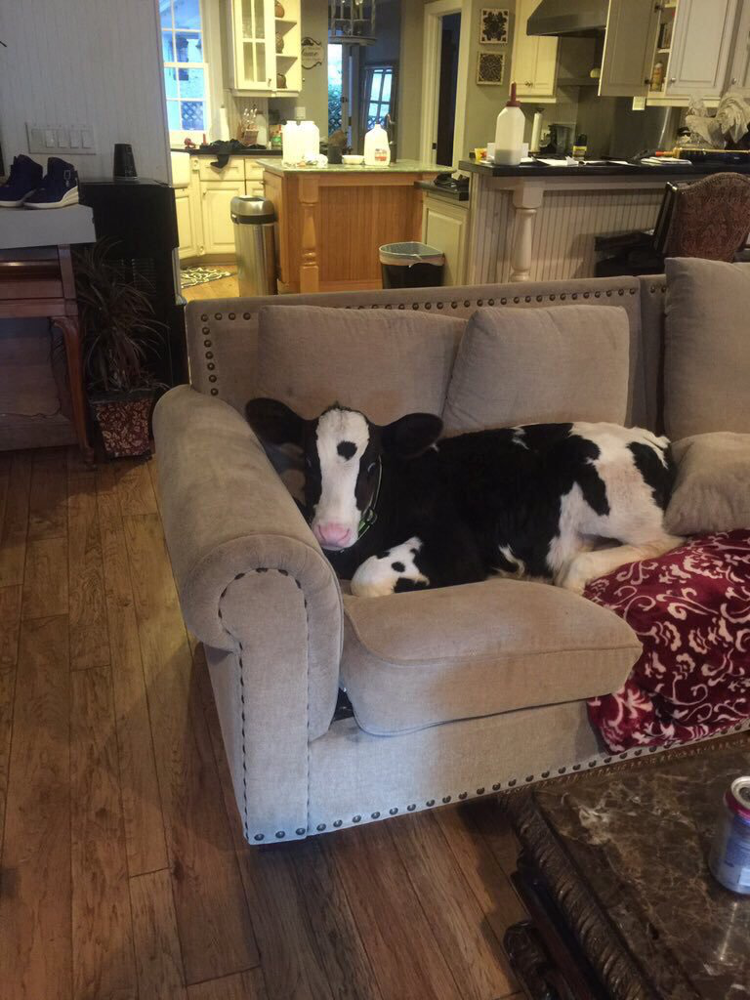

1951    Cool dog. Enjoys couch. Low monotone bark. Very nice kicks. Pisses milk (must be rare). Can't go down stairs. 4/10 https://t.co/vXMKrJC81s
Name: text, dtype: object

In [146]:
# example1: Definitely Dog
show_tweet_pic(method='tweet_id', tweet_id = 666649482315059201)

In [147]:
example_definitelydog = dogrates_clean.query(
    "tweet_id == '666649482315059201'")

example_definitelydog[['tweet_id', 'timestamp', 'average',
                       'text', 'breed', 'p1_dog', 'p2_dog', 'p3_dog', 'RT/Like']]


,tweet_id,timestamp,average,text,breed,p1_dog,p2_dog,p3_dog,RT/Like
1951,666649482315059201,2015-11-17 16:09:56,4.0,Cool dog. Enjoys couch. Low monotone bark. Very nice kicks. Pisses milk (must be rare). Can't go down stairs. 4/10 https://t.co/vXMKrJC81s,Border_collie,True,True,True,0.659412


好一个definitely dog! 🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄🙄

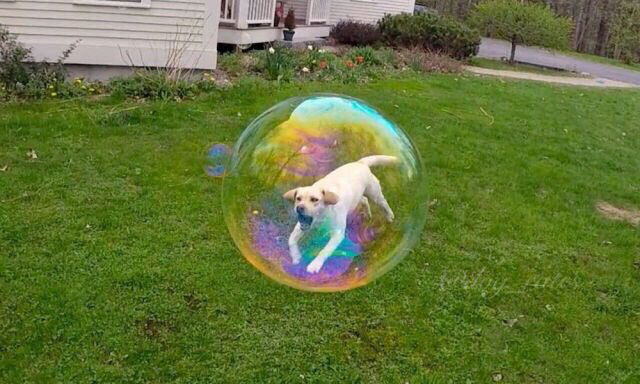

1480    This is Kenneth. He's stuck in a bubble. 10/10 hang in there Kenneth https://t.co/uQt37xlYMJ
Name: text, dtype: object

In [148]:
# example 2: Possibly Dog
show_tweet_pic(method='tweet_id', tweet_id = 676219687039057920)

In [149]:
example_possiblydog = dogrates_clean.query("tweet_id == '676219687039057920'")

example_possiblydog[['tweet_id', 'timestamp', 'average',
                     'text', 'breed', 'p1_dog', 'p2_dog', 'p3_dog', 'RT/Like']]


,tweet_id,timestamp,average,text,breed,p1_dog,p2_dog,p3_dog,RT/Like
1480,676219687039057920,2015-12-14 01:58:31,10.0,This is Kenneth. He's stuck in a bubble. 10/10 hang in there Kenneth https://t.co/uQt37xlYMJ,bubble,False,False,True,0.475962


你看我说的没错吧~狗狗和其他什么的在一起~

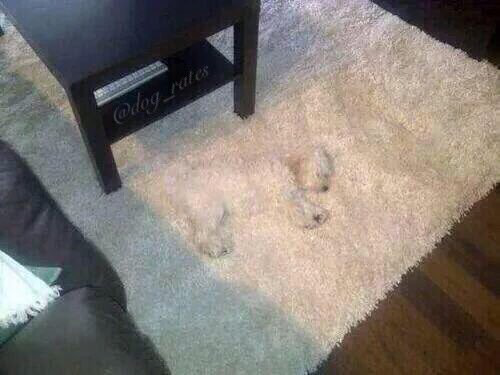

1517    What kind of person sends in a picture without a dog in it? 1/10 just because that's a nice table https://t.co/RDXCfk8hK0
Name: text, dtype: object

In [150]:
# example 3: Not Dog
show_tweet_pic(method='tweet_id', tweet_id = 675153376133427200)

In [151]:
example_notdog =dogrates_clean.query("tweet_id == '675153376133427200'")

example_notdog[['tweet_id', 'timestamp', 'average', 'text',
                'breed', 'p1_dog', 'p2_dog', 'p3_dog', 'RT/Like']]


,tweet_id,timestamp,average,text,breed,p1_dog,p2_dog,p3_dog,RT/Like
1517,675153376133427200,2015-12-11 03:21:23,1.0,What kind of person sends in a picture without a dog in it? 1/10 just because that's a nice table https://t.co/RDXCfk8hK0,paper_towel,False,False,False,0.451517


嗯，完美。这张图上确实只有桌子和白地毯，这次机器学习终于不犯傻了~

Anyway, you get the idea.😀

机器学习的判断结果虽然会出现一些极端情况，但的确，综合其预测的三个品种，我们发现其可以很好的区分推文内容，且这些内容之间可能有本质的区别。因此，我们根据机器学习模型预测的结果对其进行分组。

In [152]:
# code - count "True"s
dogrates_clean['p1_dog'] = dogrates_clean['p1_dog'].map({True: 1, False: 0})
dogrates_clean['p2_dog'] = dogrates_clean['p2_dog'].map({True: 1, False: 0})
dogrates_clean['p3_dog'] = dogrates_clean['p3_dog'].map({True: 1, False: 0})

dogrates_clean['isdog_index'] = dogrates_clean['p1_dog'] + dogrates_clean['p2_dog'] + dogrates_clean['p3_dog']


In [153]:
# test - count "True"s
dogrates_clean['isdog_index'].value_counts()


3    1202
2     326
0     306
1     157
Name: isdog_index, dtype: int64

In [154]:
# code categorize
is_dog_labels = ['not dog', 'possibly dog', 'definitly dog']

dogrates_clean['dog?'] = pd.cut(dogrates_clean['isdog_index'],
                                bins=[-1, 0, 2, 3],
                                right=True, labels=is_dog_labels)

dogrates_clean = dogrates_clean.drop(
    columns=['p1_dog', 'p2_dog', 'p3_dog', 'isdog_index'])


In [155]:
# test1
dogrates_clean['dog?'].value_counts()


definitly dog    1202
possibly dog      483
not dog           306
Name: dog?, dtype: int64

In [156]:
# test2
dogrates_clean.head(1)


,tweet_id,timestamp,text,single_dog,name,stage_count,stage(s),average,favorite_count,retweet_count,jpg_url,breed,gender,RT/Like,average_cate,dog?
0,892420643555336193,2017-08-01 16:23:56,This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,True,Phineas,0,Not Specified,13.0,39492,8842,https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg,orange,Male,0.223893,high,not dog


Test OK!我们高兴的宣布：本报告的数据清洗部分（终于）全部完成了！🤩

In [157]:
dogrates_clean.to_csv('twitter_archive_master.csv', na_rep='NaN', header=True)


# 4 WeRateDogs推特账号的数据素描
---

## 4.1 账号各项属性一览

In [158]:
dogrates_clean.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 1991 entries, 0 to 1990
Data columns (total 16 columns):
tweet_id          1991 non-null int64
timestamp         1991 non-null datetime64[ns]
text              1991 non-null object
single_dog        1991 non-null bool
name              1349 non-null object
stage_count       1991 non-null int64
stage(s)          1991 non-null object
average           1991 non-null float64
favorite_count    1991 non-null int64
retweet_count     1991 non-null int64
jpg_url           1991 non-null object
breed             1991 non-null object
gender            1991 non-null object
RT/Like           1991 non-null float64
average_cate      1991 non-null category
dog?              1991 non-null category
dtypes: bool(1), category(2), datetime64[ns](1), float64(2), int64(4), object(6)
memory usage: 303.9+ KB


## 4.2 数据集各项唯一值情况

In [159]:
dogrates_clean.nunique()


tweet_id        1991
timestamp       1991
text            1991
single_dog         2
name             938
                ... 
breed            373
gender             3
RT/Like         1983
average_cate       4
dog?               3
Length: 16, dtype: int64

In [160]:
dogrates_clean.describe()


,tweet_id,stage_count,average,favorite_count,retweet_count,RT/Like
count,1.991000e+03,1991.000000,1991.000000,1991.000000,1991.000000,1991.000000
mean,7.358386e+17,0.155701,10.550116,8917.909091,2767.200904,0.330292
std,6.749152e+16,0.369526,2.178957,12403.490206,4717.028361,0.107731
min,6.660209e+17,0.000000,0.000000,81.000000,15.000000,0.083164
25%,6.758494e+17,0.000000,10.000000,1966.500000,619.500000,0.253218
50%,7.084699e+17,0.000000,11.000000,4113.000000,1345.000000,0.313746
75%,7.877641e+17,0.000000,12.000000,11273.000000,3202.500000,0.391882
max,8.924206e+17,2.000000,14.000000,132318.000000,79116.000000,0.909729


## 4.3 各分类型数据细分占比一览

In [161]:
# 获取每个分类的计数情况：
def value_count(inputs, labels=None, explode=(0.1, 0.1), data=dogrates_clean):
    '''此函数用于快速创建饼状图，以查看某一列中值的分布情况；
    函数必须传入“列名inputs”变量，“标签labels”和“爆炸explode”可选；
        - “列名inputs”将自动作为图片标题的一部分，其首字母会自动大写；
        - 当“标签”传入时，会以逆时针方向为饼状图的切片插入用户自定义的标签；
        - 当“爆炸”传入时，可以时饼状图的各个部分分开；
    这一函数绝大多数情况下适用于分类变量，但在某些非分类变量可以用于分类的情况下也完全适用；
    以下新加入的两个功能是针对这一场景的优化；它们能很好的避免庞杂的数字混成一团，保持图片的整洁的同时给予充分的信息：
        1） 当标签未指定时，函数会自动为前95%的数据添加上标签；
        2） 自动生成的百分比也将仅针对前95%的数据'''

    def valid_pct(pct):
        '''此子函数用于忽略一切比例小于5%类别的百分比显示；
        参考：https://stackoverflow.com/questions/34035427/conditional-removal-of-labels-in-matplotlib-pie-chart'''
        return ("%.2f%%" % pct) if pct > 5 else ''

    def auto_labling(labels):
        '''此子函数的作用是，当labels未指明时，自动生成标签并忽略一切比例小于5%类别的标签显示；当labels指明时，不对labels做处理；
        参考：https://stackoverflow.com/questions/34035427/conditional-removal-of-labels-in-matplotlib-pie-chart'''
        if labels is not None:
            labels = labels
        else:
            labels_dict = dogrates_clean[str(inputs)].value_counts().to_dict()
            labels_auto = [i if n/dogrates_clean['average'].count()
                           > 0.05 else '' for (i, n) in labels_dict.items()]
            labels = labels_auto
        return labels

    plt.pie(list(data[inputs].value_counts()), labels=auto_labling(labels),
            explode=explode, radius=1.2, autopct=valid_pct, startangle=90)
    plt.axis('equal')  # 为了画出来不是莫名其妙的椭圆
    plt.suptitle("Distribution of Dogs on {}".format(str(inputs).capitalize(),
                                                         fontweight="bold"))
    return dogrates_clean[str(inputs)].value_counts()


#### 单只/多只狗狗推文数量占比

True     1928
False      63
Name: single_dog, dtype: int64

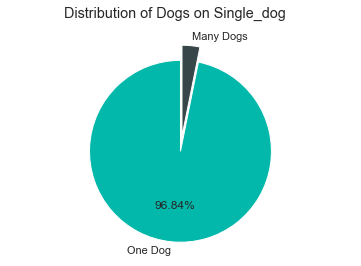

In [162]:
# 查看推文中是否有多只狗狗的占比
value_count('single_dog', ['One Dog', 'Many Dogs'])


#### 生长阶段分类占比

0    1686
1     300
2       5
Name: stage_count, dtype: int64

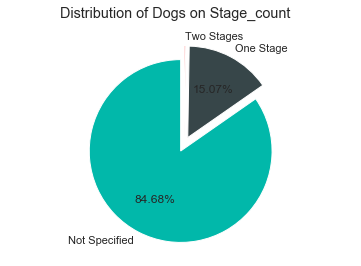

In [163]:
# 查看狗狗的分类数量占比
value_count('stage_count', ['Not Specified',
                            'One Stage', 'Two Stages'], explode=(0.1, 0.1, 0.1))


#### 狗狗生长阶段分类的详细分布（包括/不包括未指明的分类）

Not Specified     1686
pupper             204
doggo               65
puppo               23
floofer              8
doggo & pupper       5
Name: stage(s), dtype: int64

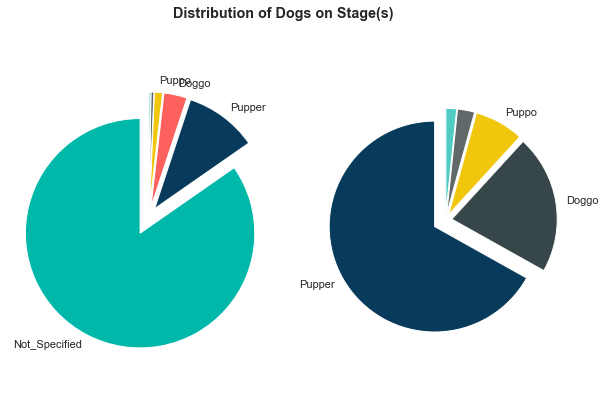

In [164]:
# 对数据进行预处理，去除未指明（Unspecified)的分类情况的数据
df_stage_pie_x = dogrates_clean.copy()
df_stage_pie_x['stage(s)'] = df_stage_pie_x['stage(s)'].replace('Not Specified', np.nan)

fig0, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 6.2), sharex=False)

# ax1 = value_count('stage(s)', explode=(0.1, 0.1, 0.1, 0.1, 0.1, 0.1))

# ax2 = value_count('stage(s)', labels=['Pupper', 'Doggo', 'Puppo', '', ''], explode=(0.1, 0.1, 0.1, 0.1, 0.1), data=df_stage_pie_x)

ax1.pie(list(dogrates_clean['stage(s)'].value_counts()),
        labels=['Not_Specified', 'Pupper', 'Doggo', 'Puppo', '', ''],
        explode=(0.2, 0.1, 0.1, 0.1, 0.1, 0.1),
        radius=1.2, startangle=90,
        colors=["#00B8AA", "#083B5B", "#FD615E", "#F1C70E", "#616869", "#51CCC3"])

ax2.pie(list(df_stage_pie_x['stage(s)'].value_counts()),
        labels=['Pupper', 'Doggo', 'Puppo', '', ''],
        explode=(0.06, 0.03, 0.03, 0.03, 0.03),
        radius=0.5, startangle=90,
        colors=["#083B5B", "#374649", "#F1C70E", "#616869", "#51CCC3"])

ax1.axis('equal')  # 为了画出来不是莫名其妙的椭圆
ax2.axis('equal')

plt.suptitle("Distribution of Dogs on Stage(s)", fontweight="bold")

dogrates_clean['stage(s)'].value_counts()


#### 评分等级的分布情况

high        1157
medium       669
low          131
very_low      34
Name: average_cate, dtype: int64

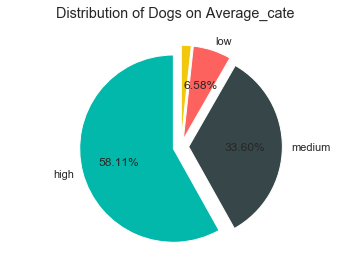

In [165]:
# 查看狗狗的分数占比
value_count('average_cate', explode=(0.1, 0.1, 0.1, 0.1))


#### 品种分布情况

In [166]:
# 创建按照点赞量，转发量，平均转赞比聚合的数据透视表
pivot_breeds_enhanced = pd.pivot_table(dogrates_clean,
                              values=['tweet_id', 'favorite_count', 'retweet_count', 'average', 'RT/Like'],
                             index=['breed'],
                             aggfunc={'favorite_count': [np.mean, np.var], # 单纯的比较总数不太公平，我们也得考虑每条推特的平均点赞量
                                     'retweet_count': np.mean, # 单纯的比较总数不太公平，我们也得考虑每条推特的平均转发量
                                      'RT/Like': [np.mean, np.var],
                                     'tweet_id': len})


In [167]:
# 筛选出绝对是狗的条目，忽略其他内容
filter_is_dog = dogrates_clean[dogrates_clean['dog?'] == 'definitly dog']['breed'].unique().tolist()
pivot_breeds_enhanced = pivot_breeds_enhanced.loc[filter_is_dog]

# 将pivot_breeds_enhanced数据集按照点赞量和转发量排序，备用
pivot_breeds_enhanced = pivot_breeds_enhanced.sort_values(by=[('favorite_count', 'mean'), ('retweet_count', 'mean')], ascending=False)

In [168]:
# 为绘制品种分布情况创建备用数据集，将其按照推文数量排序；只保留前20个
pivot_breeds = pivot_breeds_enhanced.copy()
pivot_breeds = pivot_breeds.sort_values(by=[('tweet_id', 'len')], ascending=False)
pivot_breeds = pivot_breeds.head(20)

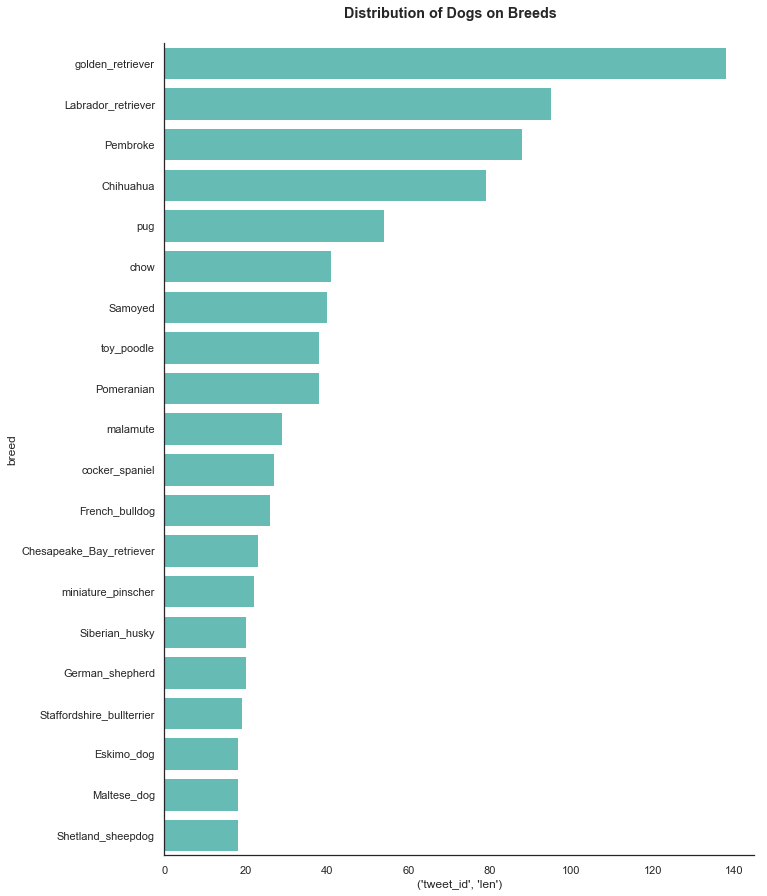

In [169]:
# 绘制品种数量分布的柱状图
fig435, ax4350 = plt.subplots(figsize=(9, 12))
fig435.tight_layout()

# 绘制图形，设定颜色
sns.barplot(x=pivot_breeds[('tweet_id', 'len')], y=pivot_breeds.index, ax=ax4350, color='#58C9C0')

# 设置大图标题
plt.suptitle('Distribution of Dogs on Breeds', fontweight='bold', y=1.02)

sns.despine()

唔，金毛和拉布拉多是最多的，毫不意外~😆

#### 狗狗性别分布情况

Male       1017
Unknown     636
Female      338
Name: gender, dtype: int64

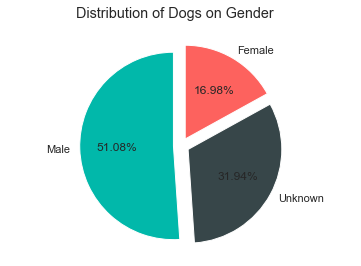

In [170]:
value_count('gender', explode=(0.1, 0.1, 0.1))

#### 推文主题是否为狗的分布情况

definitly dog    1202
possibly dog      483
not dog           306
Name: dog?, dtype: int64

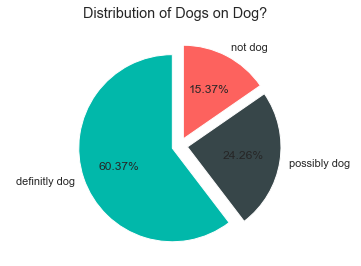

In [171]:
value_count('dog?', explode=(0.1, 0.1, 0.1))

## 4.4 对数值型变量的探索

### 4.4.1 对数值型变量的分布情况探索

#### 1. 点赞量与转发量的分布趋势（一般 & ln标准化），与二者之间的关系

C:\Users\willl\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



Text(0.5, 0.91, 'Distribution of Favorite & Retweet Counts')

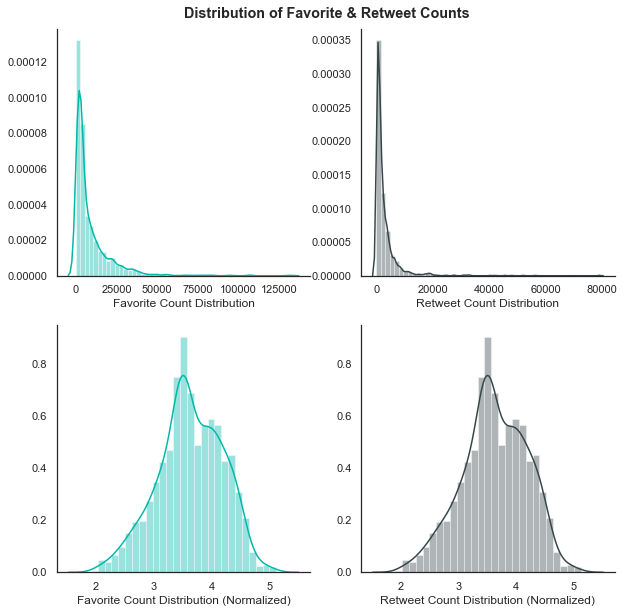

In [172]:
# 图形初始化
fig441, ax441 = plt.subplots(2, 2, figsize=(10, 10))

# 绘制一般分布情况
sns.distplot(dogrates_clean[('favorite_count')], ax=ax441[0, 0], color="#01B8AA", axlabel='Favorite Count Distribution')
sns.distplot(dogrates_clean[('retweet_count')], ax=ax441[0, 1], color="#374649", axlabel='Retweet Count Distribution')

# 取10的对数进行标准化，并绘制分布情况
sns.distplot(dogrates_clean[('favorite_count')].apply(np.log10), ax=ax441[1, 0], color="#01B8AA", axlabel='Favorite Count Distribution (Normalized)')
sns.distplot(dogrates_clean[('favorite_count')].apply(np.log10), ax=ax441[1, 1], color="#374649", axlabel='Retweet Count Distribution (Normalized)')

sns.despine()

# 设置大图标题
plt.suptitle('Distribution of Favorite & Retweet Counts', fontweight='bold', y=.91)

Text(0.5, 1.01, 'Favorite & Retweet Distribution (Normalized) & Relation ')

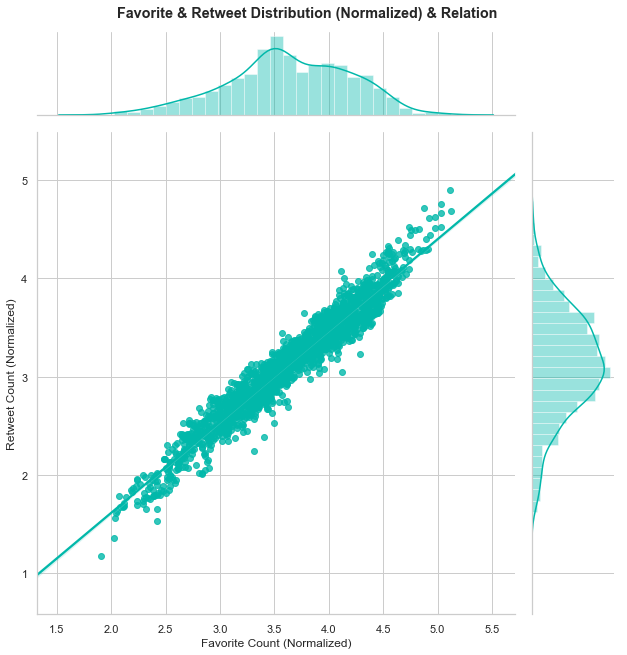

In [173]:
# 设置风格
sns.set(style='whitegrid')

# 绘制点赞量与转发量的关系图
ax442 = sns.jointplot(x=dogrates_clean['favorite_count'].apply(np.log10), y=dogrates_clean['retweet_count'].apply(np.log10),
                      kind='reg', color='#01B8AA', height=9)

# 设置轴标题
ax442.set_axis_labels("Favorite Count (Normalized)", "Retweet Count (Normalized)")

# 设置大图标题
plt.suptitle('Favorite & Retweet Distribution (Normalized) & Relation ',
             fontweight='bold', y=1.01)


观察：
- 从普通分布图来看，公众号所有推文的点赞量和转发量分布都明显左偏；主要集中在0-50000这一区间之内；
- 但当我们为点赞数和转发数都取10的对数进行标准化之后，则发现点赞量与转发量的对数还是不呈正态的分布：
    - 对转发量和点赞量取10的对数进行标准化，将点赞/转发划分为了百，千，万，十万等等级；
    - WeRateDogs的推文点赞量和转发量集中在千-万级，10万+的爆文和寥寥几百的冷门都很少。
- 转发量和点赞量之间有非常强烈的线性关系，这很好理解。但探索这一线性关系似乎没有实际意义。

#### 2. 转赞比的分布趋势 （一般 & log标准化）

Text(0.5, 0.93, 'Distribution of Retweet/Like(Favorite) Ratio')

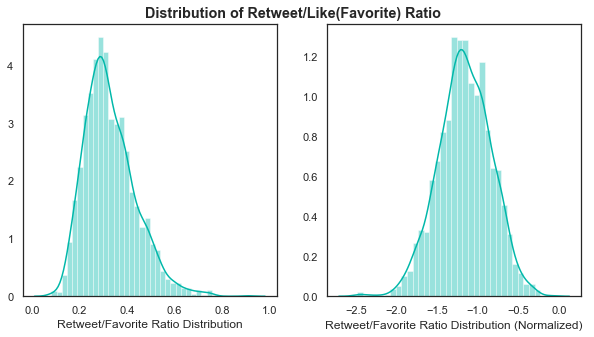

In [174]:
# 设置风格
sns.set(style='white')

# 图形初始化
fig442, (ax4421, ax4422) = plt.subplots(1, 2, figsize=(10, 5))

# 转赞比分布
sns.distplot(dogrates_clean['RT/Like'], color="#01B8AA",
             ax=ax4421, axlabel='Retweet/Favorite Ratio Distribution')

# 取自然常数e的对数
sns.distplot(dogrates_clean['RT/Like'].apply(np.log), color="#01B8AA",
             ax=ax4422, axlabel='Retweet/Favorite Ratio Distribution (Normalized)')

# 设置大图标题
plt.suptitle('Distribution of Retweet/Like(Favorite) Ratio',
             fontweight='bold', y=.93)


观察：
- 直接绘制的转赞比情况，其分布也右偏；
- 取自然常数e的对数之后，发现其分布不呈正态分布，存在部分较低的数值；

#### 3. 名字的频次分布

Text(0.5, 0.93, 'Popular Names')

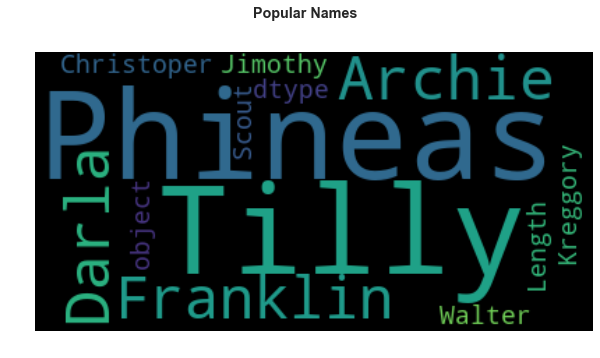

In [175]:
# 找不到好的图，好看的图画出来的字压根就看不清，就这样吧
# 参考：
# https://amueller.github.io/word_cloud/auto_examples/simple.html#sphx-glr-auto-examples-simple-py

plt.subplots(figsize=(10, 6))

# 设置词云内容
wc443 = WordCloud(stopwords=STOPWORDS.add('Name'),
                  collocations=False, background_color='black')
text_wc443 = str(dogrates_clean['name'].dropna())
wc443.generate(text_wc443)

# 显示词云
plt.imshow(wc443, interpolation="bilinear")
plt.axis('off')

# 设置大图标题
plt.suptitle('Popular Names', fontweight='bold', y=.93)


### 4.4.2 对一些有趣极值的探索

#### 1. 评分

##### 最高评分

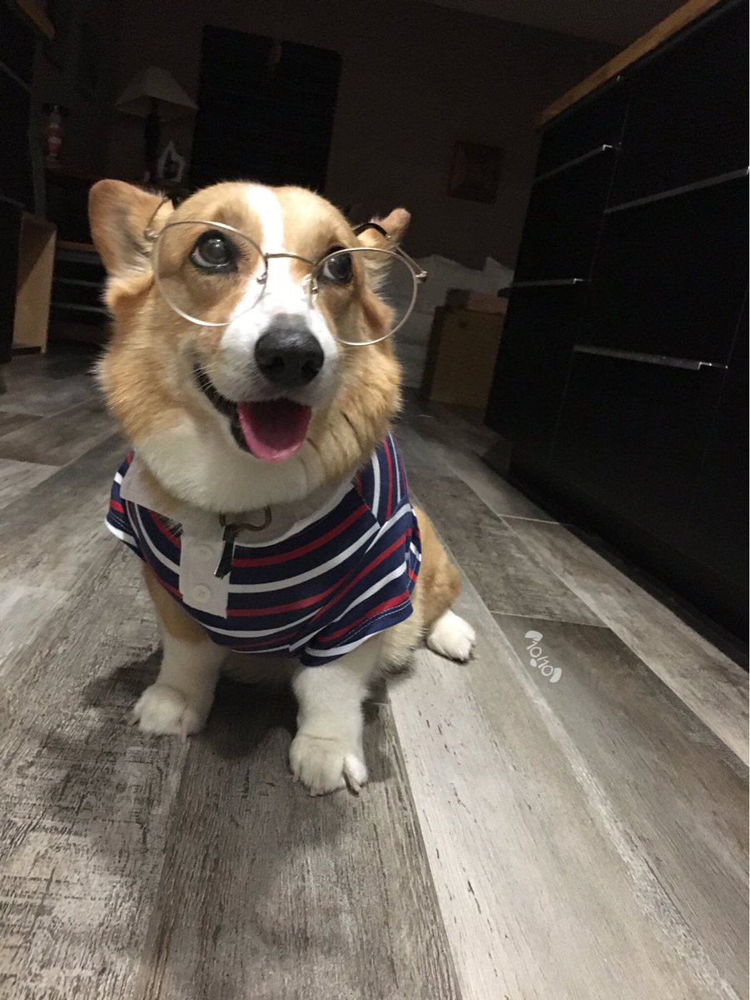

9    This is Cassie. She is a college pup. Studying international doggo communication and stick theory. 14/10 so elegant much sophisticate https://t.co/t1bfwz5S2A
Name: text, dtype: object

In [176]:
show_tweet_pic(column='average', method='max')

In [177]:
dogrates_clean.loc[[dogrates_clean['average'].idxmax()]]

,tweet_id,timestamp,text,single_dog,name,stage_count,stage(s),average,favorite_count,retweet_count,jpg_url,breed,gender,RT/Like,average_cate,dog?
9,890240255349198849,2017-07-26 15:59:51,This is Cassie. She is a college pup. Studying international doggo communication and stick theory. 14/10 so elegant much sophisticate https://t.co/t1bfwz5S2A,True,Cassie,1,doggo,14.0,32467,7684,https://pbs.twimg.com/media/DFrEyVuW0AAO3t9.jpg,Pembroke,Female,0.236671,high,definitly dog


##### 最低评分

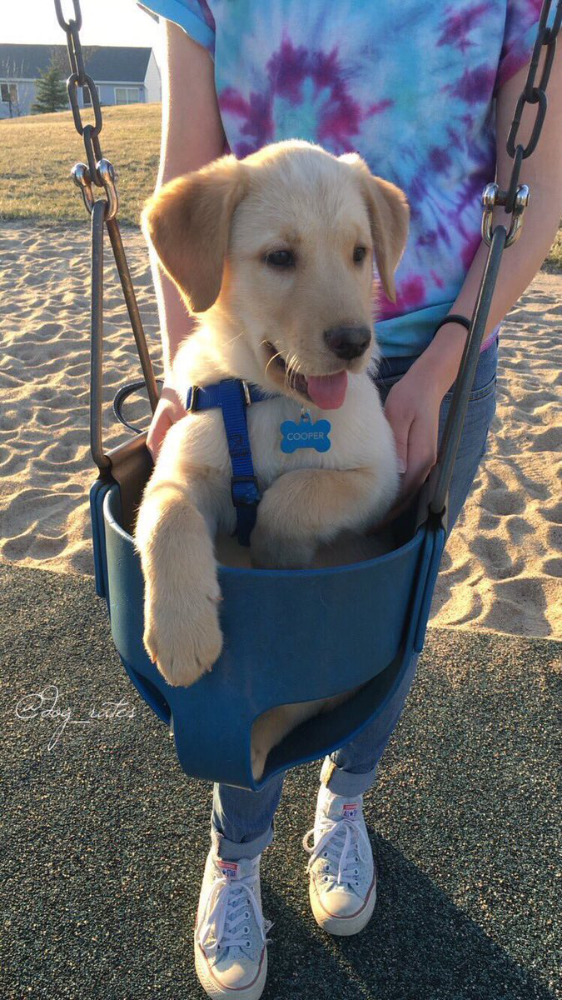

235    When you're so blinded by your systematic plagiarism that you forget what day it is. 0/10 https://t.co/YbEJPkg4Ag
Name: text, dtype: object

In [178]:
show_tweet_pic(column='average', method='min')

In [179]:
dogrates_clean.loc[[dogrates_clean['average'].idxmin()]]

,tweet_id,timestamp,text,single_dog,name,stage_count,stage(s),average,favorite_count,retweet_count,jpg_url,breed,gender,RT/Like,average_cate,dog?
235,835152434251116546,2017-02-24 15:40:31,When you're so blinded by your systematic plagiarism that you forget what day it is. 0/10 https://t.co/YbEJPkg4Ag,True,NaN,0,Not Specified,0.0,24478,3425,https://pbs.twimg.com/media/C5cOtWVWMAEjO5p.jpg,swing,Unknown,0.139922,very_low,possibly dog


#### 2. 点赞

##### 最多点赞

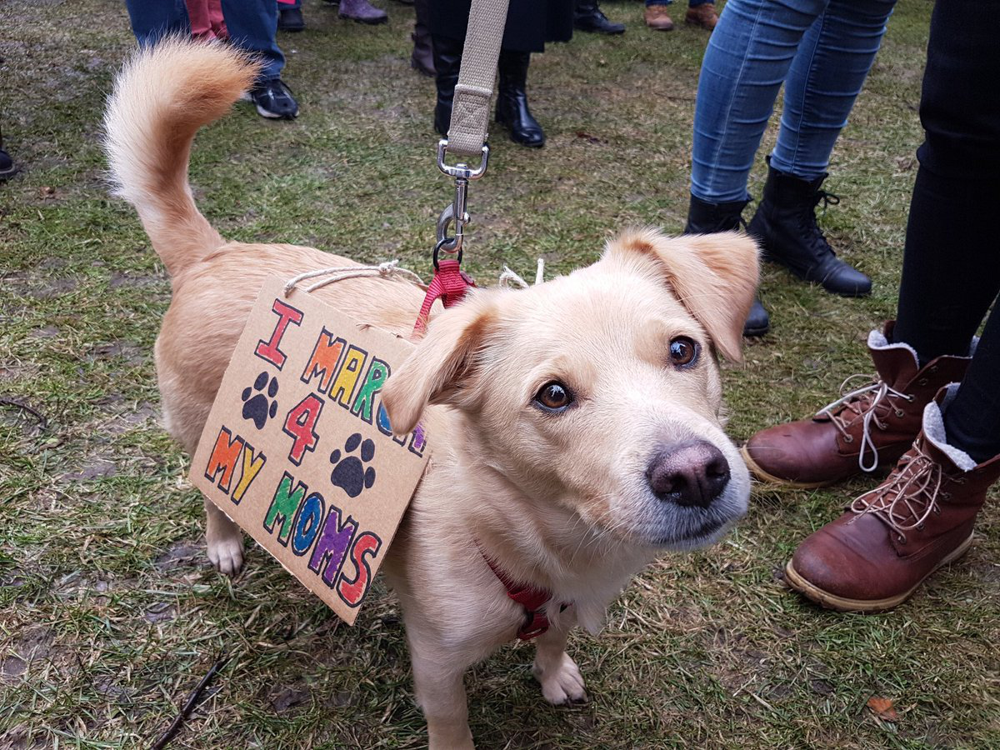

309    Here's a super supportive puppo participating in the Toronto  #WomensMarch today. 13/10 https://t.co/nTz3FtorBc
Name: text, dtype: object

In [180]:
show_tweet_pic(column='favorite_count', method='max')

In [181]:
dogrates_clean.loc[[dogrates_clean['favorite_count'].idxmax()]]

,tweet_id,timestamp,text,single_dog,name,stage_count,stage(s),average,favorite_count,retweet_count,jpg_url,breed,gender,RT/Like,average_cate,dog?
309,822872901745569793,2017-01-21 18:26:02,Here's a super supportive puppo participating in the Toronto #WomensMarch today. 13/10 https://t.co/nTz3FtorBc,True,NaN,1,puppo,13.0,132318,47958,https://pbs.twimg.com/media/C2tugXLXgAArJO4.jpg,Lakeland_terrier,Unknown,0.362445,high,definitly dog


##### 最少点赞

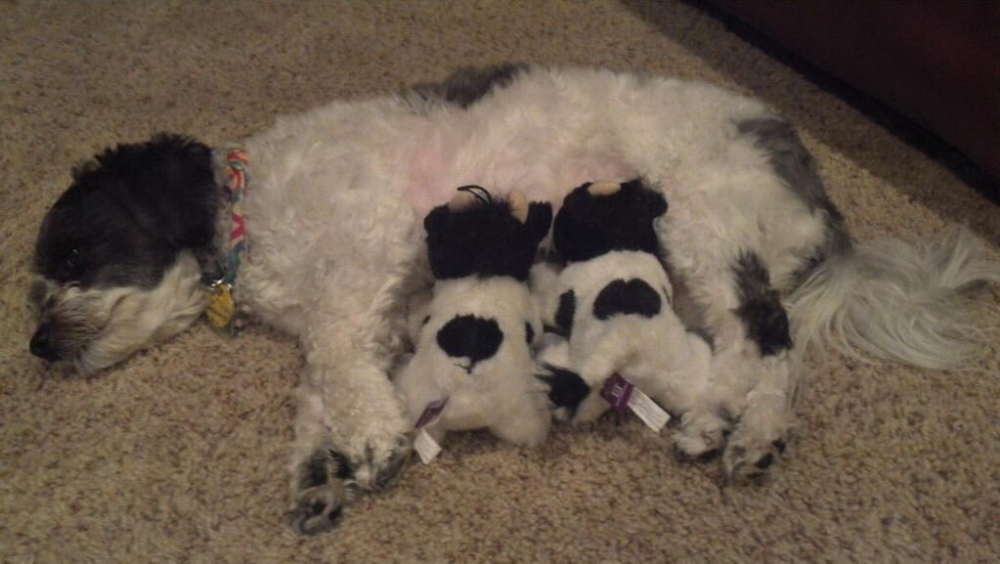

1974    Oh my. Here you are seeing an Adobe Setter giving birth to twins!!! The world is an amazing place. 11/10 https://t.co/11LvqN4WLq
Name: text, dtype: object

In [182]:
show_tweet_pic(column='favorite_count', method='min')

In [183]:
dogrates_clean.loc[[dogrates_clean['favorite_count'].idxmin()]]

,tweet_id,timestamp,text,single_dog,name,stage_count,stage(s),average,favorite_count,retweet_count,jpg_url,breed,gender,RT/Like,average_cate,dog?
1974,666102155909144576,2015-11-16 03:55:04,Oh my. Here you are seeing an Adobe Setter giving birth to twins!!! The world is an amazing place. 11/10 https://t.co/11LvqN4WLq,True,NaN,0,Not Specified,11.0,81,15,https://pbs.twimg.com/media/CT54YGiWUAEZnoK.jpg,English_setter,Unknown,0.185185,high,definitly dog


#### 3. 转赞比

##### 最高转赞比

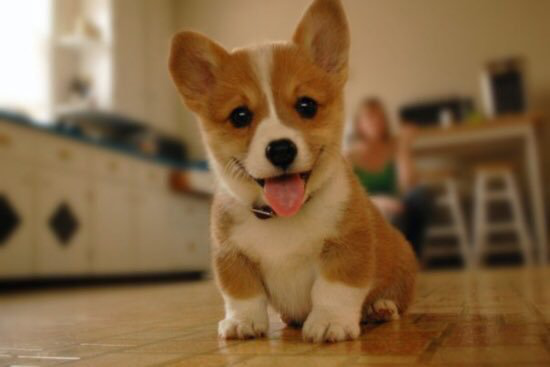

302    Retweet the h*ck out of this 13/10 pupper #BellLetsTalk https://t.co/wBmc7OaGvS
Name: text, dtype: object

In [184]:
show_tweet_pic(column='RT/Like', method='max')

In [185]:
dogrates_clean.loc[[dogrates_clean['RT/Like'].idxmax()]]

,tweet_id,timestamp,text,single_dog,name,stage_count,stage(s),average,favorite_count,retweet_count,jpg_url,breed,gender,RT/Like,average_cate,dog?
302,824325613288833024,2017-01-25 18:38:36,Retweet the h*ck out of this 13/10 pupper #BellLetsTalk https://t.co/wBmc7OaGvS,True,NaN,1,pupper,13.0,12961,11791,https://pbs.twimg.com/media/C3CXxaoWQAAiLuC.jpg,Pembroke,Unknown,0.909729,high,definitly dog


##### 最低转赞比

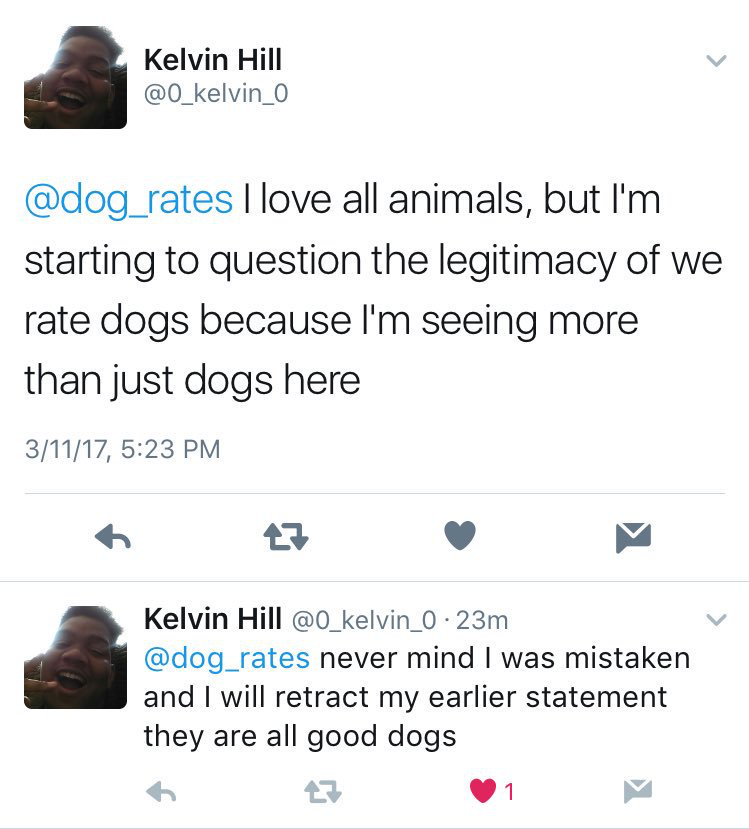

209    I didn't even have to intervene. Took him 4 minutes to realize his error. 10/10 for Kevin https://t.co/2gclc1MNr7
Name: text, dtype: object

In [186]:
show_tweet_pic(column='RT/Like', method='min')

In [187]:
dogrates_clean.loc[[dogrates_clean['RT/Like'].idxmin()]]

,tweet_id,timestamp,text,single_dog,name,stage_count,stage(s),average,favorite_count,retweet_count,jpg_url,breed,gender,RT/Like,average_cate,dog?
209,840696689258311684,2017-03-11 22:51:24,I didn't even have to intervene. Took him 4 minutes to realize his error. 10/10 for Kevin https://t.co/2gclc1MNr7,True,NaN,0,Not Specified,10.0,13323,1108,https://pbs.twimg.com/media/C6rBLenU0AAr8MN.jpg,web_site,Male,0.083164,medium,not dog


### 4.4.3 对数据集数据相关性的探索

Text(0.5, 0.93, 'Correlations between Variables')

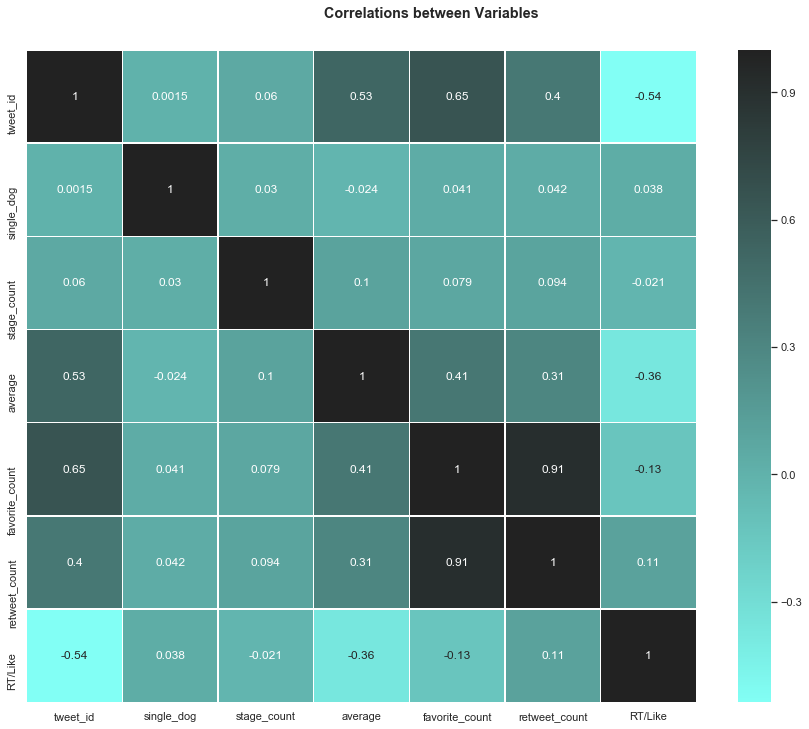

In [188]:
# 使用热力图绘制数据集各变量之间的相关性状况
fig4430, ax4430 = plt.subplots(figsize=(15, 12))
ax4430 = sns.heatmap(dogrates_clean.corr(), annot=True,
                     linewidths=.5, cmap=sequential_ui)

# 设置大图标题
plt.suptitle('Correlations between Variables', fontweight='bold', y=.93)


观察：
- 我们注意到点赞量和转发量高度正相关；这很好理解，一条很受欢迎的推特自然会有更多的人转发。转发量和点赞量的线性关系很容易得到，但没有任何意义。我们不在此讨论；
- 转赞比与不断增加的推特id数值（时间流逝）呈现较强的负相关关系；
- 评分与转赞比呈现负相关关系；
- 点赞量也与评分呈现负相关关系。

## 4.5 数值型变量随时间序列演变的探索

#### 发帖量随时间变化（逐月）的情况

In [189]:
# 创建临时数据集以准备按月聚合
df451 = dogrates_clean.copy()

# 创建月信息
# https://stackoverflow.com/questions/25146121/extracting-just-month-and-year-from-pandas-datetime-column-python
df451['YearMonth'] = df451['timestamp'].map(
    lambda x: 100*x.year + x.month)

# 按上述月信息对数据集进行透视，得出每月发帖量
pivot_tweets_per_month = df451.pivot_table(values=['average', 'tweet_id'],
                                           index=['YearMonth'],
                                           columns=None,
                                           aggfunc={'average': np.mean,
                                                    'tweet_id': len})

# 因月度信息需要使用，重设透视表索引
pivot_tweets_per_month = pivot_tweets_per_month.reset_index()

# 检查得到的都是数据集
pivot_tweets_per_month.head(2)


,YearMonth,average,tweet_id
0,201511,8.876271,295
1,201512,9.617875,367


Text(0.5, 0.93, 'Tweets per Month since Nov. 2015')

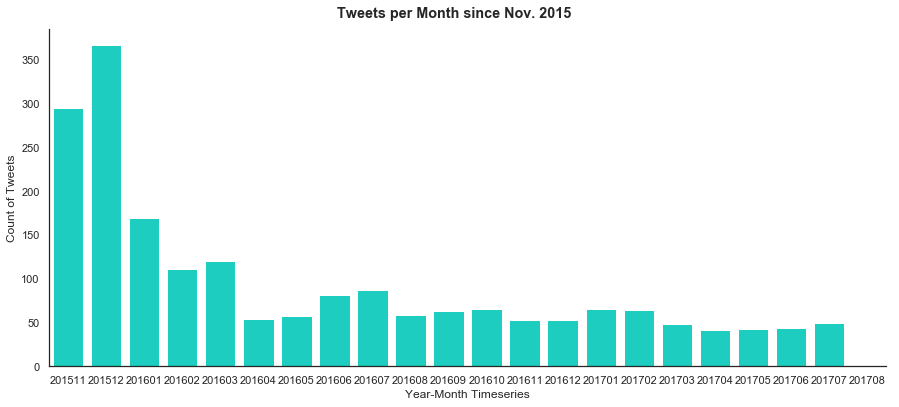

In [190]:
# 使用上述数据集，绘制发帖量的逐月变化情况
# 图形初始化
fig4510, ax4510 = plt.subplots(figsize=(15, 6.2))

# 绘制图形
sns.barplot(x='YearMonth', y='tweet_id',
            data=pivot_tweets_per_month, ax=ax4510, color='#00EAD8')

# 去掉不必要的边框
sns.despine()

# 设置轴标题
ax4510.set(ylabel='Count of Tweets', xlabel="Year-Month Timeseries")

# 设置大图标题
plt.suptitle('Tweets per Month since Nov. 2015', fontweight='bold', y=.93)


观察：
- 15年11-12月，Matt Nelson非常勤奋，11月发了295条推特，12月发了367条推特；
- 16年1-3月发推量逐渐减少
- 16年月开始至17年7月，稳定在每月40条以上；每月有小幅波动，但变化不大；

#### 分数随时间变化（逐月）的情况

##### 趋势1： 每月平均分数不断走高

Text(0.5, 0.93, 'Rating Average per Month since Nov. 2015')

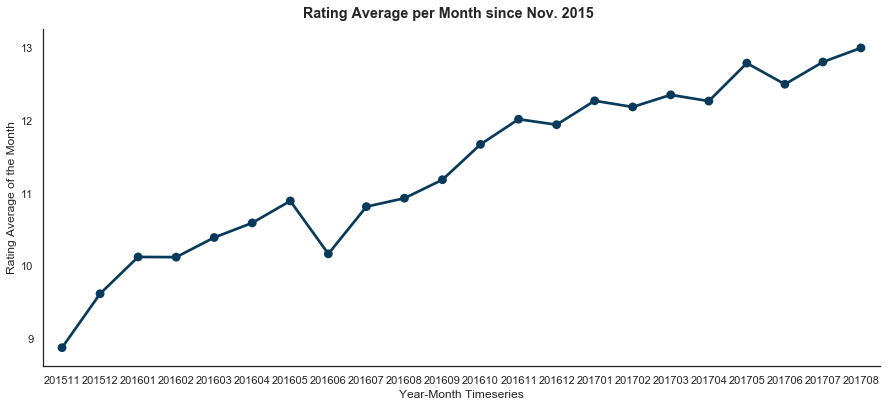

In [191]:
# 图形初始化
fig4521, ax4521 = plt.subplots(figsize=(15, 6.2))

# 绘制月平均分数变化图
sns.pointplot(x='YearMonth', y='average',
              data=pivot_tweets_per_month, color='#083B5B', ax=ax4521)

# 去除不必要的元素
sns.despine()

# 设置轴标题
ax4521.set(ylabel='Rating Average of the Month', xlabel="Year-Month Timeseries")

# 设置大图标题
plt.suptitle('Rating Average per Month since Nov. 2015',
             fontweight='bold', y=.93)


观察：
- 15年，推文平均分都在10分以下；
- 16年年初开始，均分开始不断升高，并越来越高；

这可能意味着，WeRateDogs打出突破天际的高分的特色并非一开始就形成的。

##### 趋势2：高分占比越来越高，低分占比越来越少

In [192]:
# 创建临时数据集以准备按月聚合

# 创建年信息
df451['Year'] = df451['timestamp'].map(
    lambda x: x.year)

# 按年聚合每个分数等级的推特计数
pivot_avg_cate_per_year = df451.pivot_table(values=['tweet_id'],
                                            index=['average_cate'],
                                            columns=['Year'],
                                            aggfunc={'tweet_id': len})

# 计算每年每个分数等级占该年推特总数的占比
pivot_avg_cate_pct = pivot_avg_cate_per_year.apply(lambda x: (x/x.sum()*100))

# 进一步处理数据集以便绘图
pivot_avg_cate_pct = pivot_avg_cate_pct.transpose()
pivot_avg_cate_pct.index = pivot_avg_cate_pct.index.droplevel()

# 检视数据集
pivot_avg_cate_pct


average_cate,very_low,low,medium,high
Year,,,,
2015,3.776435,13.444109,52.567976,30.211480
2016,0.823045,4.218107,32.716049,62.242798
2017,0.280112,0.280112,0.840336,98.599440


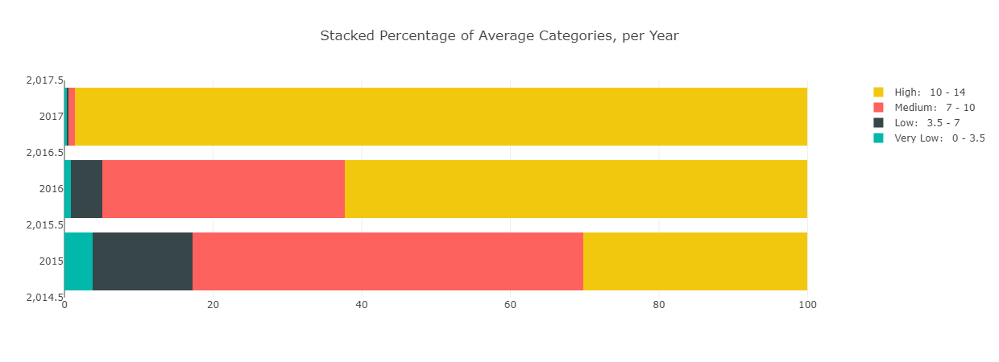

In [193]:
# 使用plotly绘制堆积柱状图
# 设定为绘图数据为横向柱状图
data4523 = [go.Bar(y=pivot_avg_cate_pct.index, x=pivot_avg_cate_pct['very_low'], orientation='h', name='Very Low： 0 - 3.5', marker=dict(color="#01B8AA")),
            go.Bar(y=pivot_avg_cate_pct.index,
                   x=pivot_avg_cate_pct['low'], orientation='h', name='Low： 3.5 - 7', marker=dict(color="#374649")),
            go.Bar(y=pivot_avg_cate_pct.index,
                   x=pivot_avg_cate_pct['medium'], orientation='h', name='Medium： 7 - 10', marker=dict(color="#FD625E")),
            go.Bar(y=pivot_avg_cate_pct.index, x=pivot_avg_cate_pct['high'], orientation='h', name='High： 10 - 14', marker=dict(color="#F2C80F"))]

# 设定layout为堆积柱状图
layout4523 = go.Layout(
    barmode='stack', title='Stacked Percentage of Average Categories, per Year', yaxis=dict(showticklabels=True))

# 初始化图像数据
fig4523 = go.Figure(data=data4523, layout=layout4523)

# 使用离线模式绘图
of.iplot(fig4523)


观察：
- 15年，3.78%的推文打出了0-3.5分的超低分，13.44%的图为低分，52.57%为中等分数，而10分以上的高分仅仅占30.21%；
- 16年，高分比例开始上升，中等分数32.71%，高分62.24%，而低分合计才3.19%；
- 17年，高分占比已经达到98.60%，低分组已经基本绝迹。

##### 趋势3： 分数区间不断收窄

Text(0.5, 0.93, 'Ratings Average Distribution, since Nov. 2015')

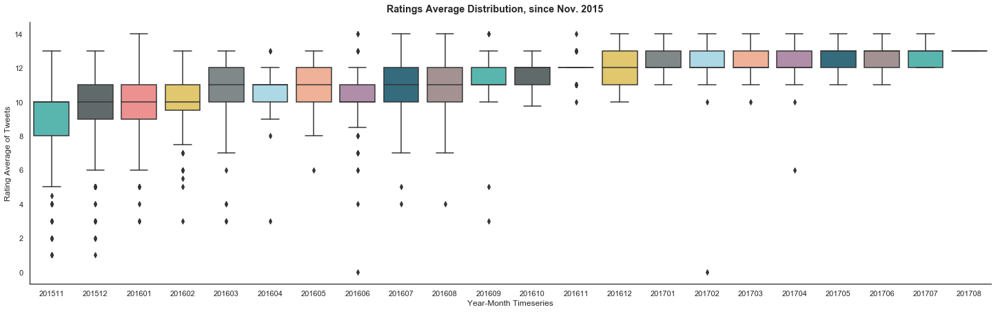

In [194]:
# 数据预处理
# 创建临时数据集，处理月度信息，准备绘制反映分数区间的箱型图
df4522 = dogrates_clean.copy()

# 整合年度与月度信息
# https://stackoverflow.com/questions/25146121/extracting-just-month-and-year-from-pandas-datetime-column-python
df4522['YearMonth'] = df4522['timestamp'].map(
    lambda x: 100*x.year + x.month)

# ---------------------------------------------------------

# 图形绘制
# 图形初始化
fig4522, ax4522 = plt.subplots(figsize=(25, 7))

# 绘制箱型图
ax4522 = sns.boxplot(
    x=df4522['YearMonth'], y=df4522['average'], palette=ui_palette_light)

# 去除不必要的元素
sns.despine()

# 设置轴标题
ax4522.set(ylabel='Rating Average of Tweets', xlabel="Year-Month Timeseries")

# 设置大图标题
plt.suptitle('Ratings Average Distribution, since Nov. 2015',
             fontweight='bold', y=.93)


#### 点赞/转发的（逐月）变化情况

##### 趋势1：点赞量增长由爆发放缓，转赞率一路下滑——WeRateDogs的整体受欢迎程度的变化趋势

In [195]:
# 创建临时数据集以便进一步处理
df4531 = dogrates_clean.copy()

# 提取日期信息，以将推特点赞和转赞率按日聚合
# https://stackoverflow.com/questions/9962822/pandas-pivot-table-on-date
df4531['dates_of_tweet'] = df4531['timestamp'].map(lambda x: x.date())

# 创建数据透视表，提取每日平均转赞比
pivot_LikeRT = df4531.pivot_table(values=['RT/Like'],
                                  index=['dates_of_tweet'],
                                  columns=None,
                                  aggfunc=np.median)
pivot_LikeRT = pivot_LikeRT.reset_index()


# 直接使用比值数据太割裂，这里使用5天的移动平均值来表明比例的长期变化
# https://stackoverflow.com/questions/40060842/moving-average-pandas
pivot_LikeRT['MA'] = pivot_LikeRT['RT/Like'].rolling(window=5).mean()

pivot_LikeRT.describe()


,RT/Like,MA
count,596.000000,592.000000
mean,0.290898,0.290849
std,0.073110,0.055673
min,0.096019,0.170645
25%,0.237392,0.249187
50%,0.287304,0.299280
75%,0.338067,0.328128
max,0.588926,0.444789


Text(0.5, 1, 'Scatter Plot for Favorites & Retweets for Tweets since Nov. 2015')

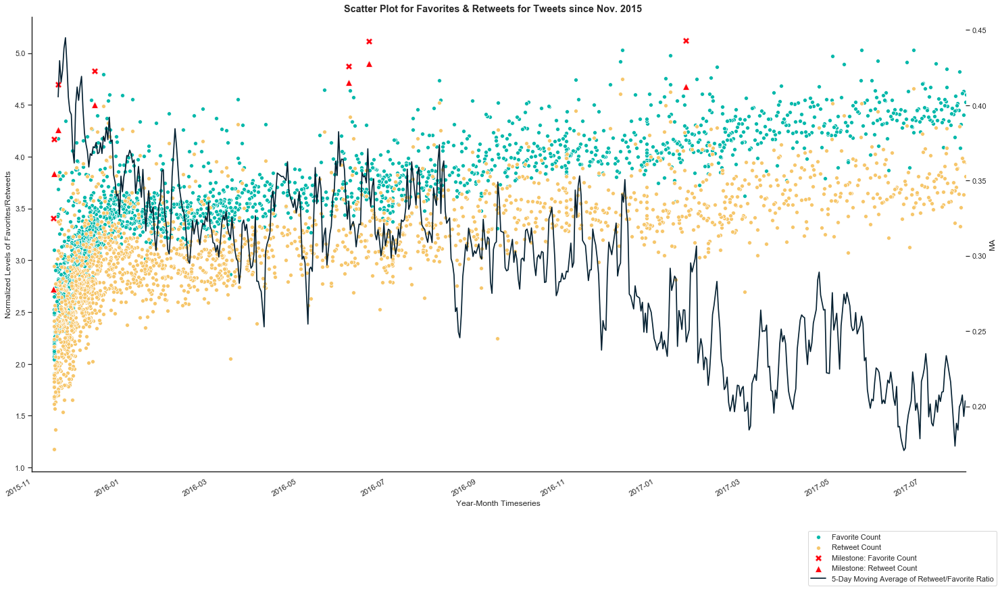

In [196]:
# 图形绘制初始化
fig4531, ax4531 = plt.subplots(1, 1, sharex=True, figsize=(20, 12))
plt.tight_layout()
ax4533 = ax4531.twinx()

# 绘制每条推特的点赞量和转发量的散点图，并标注里程碑
# 每条推特点赞量
sns.scatterplot(x=dogrates_clean['timestamp'], y=dogrates_clean['favorite_count'].apply(
    np.log10), data=dogrates_clean, ax=ax4531, color='#00B8AA')
# 每条推特转发量
sns.scatterplot(x=dogrates_clean['timestamp'], y=dogrates_clean['retweet_count'].apply(
    np.log10), data=dogrates_clean, ax=ax4531, color='#F6C66B')
# 点赞量里程碑
sns.scatterplot(x=dogrates_clean['timestamp'], y=dogrates_milestones_favorite['favorite_count'].apply(
    np.log10), data=dogrates_milestones_favorite, marker='X', s=100, ax=ax4531, color='#FF000D')
# 点赞量里程碑的转发量
sns.scatterplot(x=dogrates_clean['timestamp'], y=dogrates_milestones_favorite['retweet_count'].apply(
    np.log10), data=dogrates_milestones_favorite, marker='^', s=100, ax=ax4531, color='#FF000D')

# --------------------------------------------------------------------------------------------------

# 绘制转赞比的5日移动平均值
# 控制线条粗细
# https://stackoverflow.com/questions/45540886/reduce-line-width-of-seaborn-timeseries-plot
sns.lineplot(x='dates_of_tweet', y='MA', data=pivot_LikeRT,
             ax=ax4533, color='#042031', linewidth=1.7)

# 为X轴设定起止日期
# https://stackoverflow.com/questions/21423158/how-do-i-change-the-range-of-the-x-axis-with-datetimes-in-matplotlib
fig4531.autofmt_xdate()
ax4531.set_xlim([datetime.date(2015, 11, 1), datetime.date(2017, 8, 1)])

# 设置图例
# https://stackoverflow.com/questions/48743867/legend-not-showing-when-plotting-multiple-seaborn-plots
fig4531.legend(['Favorite Count', 'Retweet Count', 'Milestone: Favorite Count',
                'Milestone: Retweet Count', '5-Day Moving Average of Retweet/Favorite Ratio'], loc='lower right')

sns.despine()

# 设置轴标题
ax4531.set(ylabel='Normalized Levels of Favorites/Retweets', xlabel="Year-Month Timeseries")

# 设置大图标题
plt.suptitle('Scatter Plot for Favorites & Retweets for Tweets since Nov. 2015',
             fontweight='bold', y=1)


观察：
- 15年11-12月创始期，从点赞量上来看，帐号迎来了爆发式的增长；
- 16年开始，点赞量总体上由万级向上到十万级演变，转发量上整体由千级向上上万级演变；
- 转赞比的5日平均数剧烈震荡，但总体趋势式一路下滑的：由初创期的0.45一路下滑至最后的0.2左右；
- 里程碑的到来越来越缓慢：
    - 第一条里程碑为15年11月15日晚23：32分，电子那辆2528， 转发530，转赞比0.20962
    - 次日凌晨（15年11月16日4：00），点赞量突破1万大关（14703），转发量突破1千大关（6835），转赞比0.464871
    - 半年后（16年6月18日晚18点），点赞量突破10万大关，转赞比为0.606100；
    - 上述里程碑将其记录保持到了整个数据集结束。

##### 趋势2：16年4月账号跌入谷底——WeRateDogs月度受欢迎程度的变化趋势

In [197]:
df4532 = dogrates_clean.copy()

# https://stackoverflow.com/questions/25146121/extracting-just-month-and-year-from-pandas-datetime-column-python
df4532['YearMonth'] = df4532['timestamp'].map(
    lambda x: 100*x.year + x.month)


In [198]:
pivot_tweets_vs_LikeRT = df4532.pivot_table(values=['tweet_id', 'favorite_count', 'retweet_count', 'RT/Like'],
                                            index=['YearMonth'],
                                            columns=None,
                                            aggfunc={'tweet_id': len,
                                                     'favorite_count': [sum, np.mean],
                                                     'retweet_count': [sum, np.mean],
                                                     'RT/Like': np.mean})

pivot_tweets_vs_LikeRT = pivot_tweets_vs_LikeRT.reset_index()

pivot_tweets_vs_LikeRT['favorite_MoM'] = pivot_tweets_vs_LikeRT[(
    'favorite_count', 'sum')].pct_change()
pivot_tweets_vs_LikeRT['retweet_MoM'] = pivot_tweets_vs_LikeRT[(
    'retweet_count', 'sum')].pct_change()
pivot_tweets_vs_LikeRT['num_of_tweets_MoM'] = pivot_tweets_vs_LikeRT['tweet_id'].pct_change()

pivot_tweets_vs_LikeRT.head()


YearMonth   RT/Like favorite_count            retweet_count            \
                 mean           mean        sum          mean       sum   
0    201511  0.420314    1209.857627   356908.0    524.881356  154840.0   
1    201512  0.383499    3501.850136  1285179.0   1512.411444  555055.0   
2    201601  0.337510    4023.426036   679959.0   1517.934911  256531.0   
3    201602  0.332894    4244.261261   471113.0   1581.774775  175577.0   
4    201603  0.318968    4596.516667   551582.0   1630.500000  195660.0   

  tweet_id favorite_MoM retweet_MoM num_of_tweets_MoM  
       len                                             
0      295          NaN         NaN               NaN  
1      367     2.600869    2.584700          0.244068  
2      169    -0.470923   -0.537828         -0.539510  
3      111    -0.307145   -0.315572         -0.343195  
4      120     0.170806    0.114383          0.081081

Text(0.5, 0.93, 'Favorites, Retweets, Retweet/Like Ratios, and PCT Change per Month')

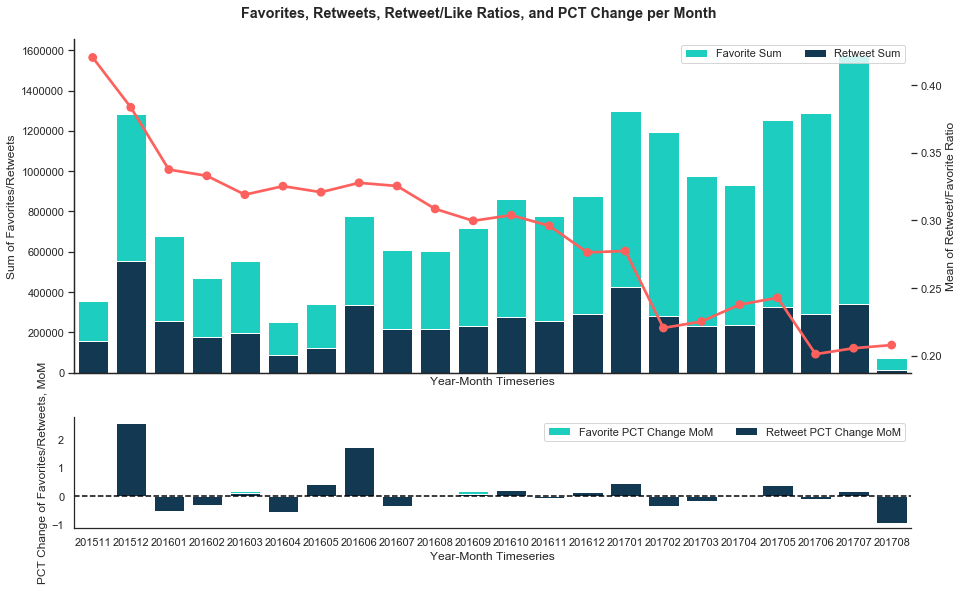

In [199]:
#
# 改变多图的显示比例
# https://stackoverflow.com/questions/10388462/matplotlib-different-size-subplots
# https://matplotlib.org/users/gridspec.html
fig4532, (ax45321, ax45323) = plt.subplots(2, 1, sharex=True,
                                           figsize=(15, 9), gridspec_kw={'height_ratios': [3, 1]})
ax45322 = ax45321.twinx()

sns.barplot(x='YearMonth', y=('favorite_count', 'sum'),
            data=pivot_tweets_vs_LikeRT, ax=ax45321, color='#00EAD8', label='Favorite Sum')
sns.barplot(x='YearMonth', y=('retweet_count', 'sum'),
            data=pivot_tweets_vs_LikeRT, ax=ax45321, color='#083B5B', label='Retweet Sum')
sns.pointplot(x='YearMonth', y=('RT/Like', 'mean'),
              data=pivot_tweets_vs_LikeRT, ax=ax45322, color='#FD615E', label='Favorite PCT Change MoM')

sns.barplot(x='YearMonth', y='favorite_MoM', data=pivot_tweets_vs_LikeRT, color='#00EAD8', ax=ax45323, label='Favorite PCT Change MoM')
sns.barplot(x='YearMonth', y='retweet_MoM', data=pivot_tweets_vs_LikeRT, color='#083B5B', ax=ax45323, label='Retweet PCT Change MoM')
# https://matplotlib.org/api/_as_gen/matplotlib.axes.Axes.hlines.html
ax45323.axhline(y=0, color='black', linestyle="dashed")

# ax4410.legend()

sns.despine()

# 设置轴标题
ax45321.set(ylabel='Sum of Favorites/Retweets', xlabel="Year-Month Timeseries")
ax45322.set(ylabel='Mean of Retweet/Favorite Ratio', xlabel="Year-Month Timeseries")
ax45323.set(ylabel='PCT Change of Favorites/Retweets, MoM', xlabel="Year-Month Timeseries")

# 设置图例
ax45321.legend(ncol=2, loc="upper right", frameon=True)
ax45323.legend(ncol=2, loc="upper right", frameon=True)

# 设置大图标题
plt.suptitle('Favorites, Retweets, Retweet/Like Ratios, and PCT Change per Month',
             fontweight='bold', y=.93)


观察：
- 15年12月，账号的点赞数量增长十分迅猛；
- 账号的受欢迎程度在16年春季情况不理想，且有持续下跌的趋势；
- 账号的受欢迎程度在16年4月之后进入上升趋势;
- 账号的月均转赞比，整体上保持了稳步下跌的趋势，不过17年3，4，5有所回升；
- 点赞量与转发量的月占比变化趋势几乎相符，不过16年6月的转发量变化比较大。

##### 趋势3：自推特账号创立伊始，推文的质量（即单条推特的受欢迎程度）就在不断提高，且速度越来越快

Text(0.5, 0.93, 'Favorites, Retweets & Retweet/Like Ratios per Month: Total vs. Average')

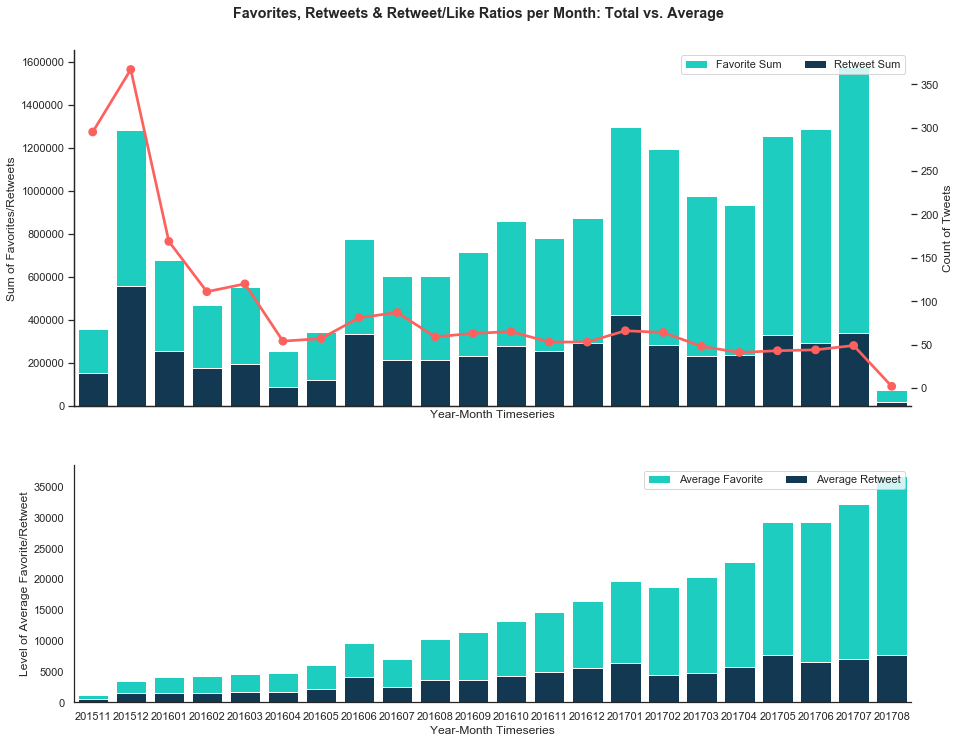

In [200]:
#
fig4533, (ax45331, ax45333) = plt.subplots(2, 1, sharex=True,
                                           figsize=(15, 12), gridspec_kw={'height_ratios': [3, 2]})
ax45332 = ax45331.twinx()

sns.barplot(x='YearMonth', y=('favorite_count', 'sum'),
            data=pivot_tweets_vs_LikeRT, ax=ax45331, color='#00EAD8', label='Favorite Sum')
sns.barplot(x='YearMonth', y=('retweet_count', 'sum'),
            data=pivot_tweets_vs_LikeRT, ax=ax45331, color='#083B5B', label='Retweet Sum')
sns.pointplot(x='YearMonth', y=('tweet_id', 'len'),
              data=pivot_tweets_vs_LikeRT, ax=ax45332, color='#FD615E')

sns.barplot(x='YearMonth', y=('favorite_count', 'mean'),
            data=pivot_tweets_vs_LikeRT, ax=ax45333, color='#00EAD8', label='Average Favorite')
sns.barplot(x='YearMonth', y=('retweet_count', 'mean'),
            data=pivot_tweets_vs_LikeRT, ax=ax45333, color='#083B5B', label='Average Retweet')

sns.despine()

# 设置轴标题
ax45331.set(ylabel='Sum of Favorites/Retweets', xlabel="Year-Month Timeseries")
ax45332.set(ylabel='Count of Tweets', xlabel="Year-Month Timeseries")
ax45333.set(ylabel='Level of Average Favorite/Retweet', xlabel="Year-Month Timeseries")

# 设置图例
ax45331.legend(ncol=2, loc="upper right", frameon=True)
ax45333.legend(ncol=2, loc="upper right", frameon=True)

# 设置大图标题
plt.suptitle('Favorites, Retweets & Retweet/Like Ratios per Month: Total vs. Average',
             fontweight='bold', y=.93)


观察：
- 15年11月-16年4月，推特账号月总点赞量易受当月发出的推特条目数量的影响；
- 16年5月起，在单月推特条数保持小范围波动的情况下，实现了推特点赞量的增长；
- 从单条推特收获的平均点赞量和转发量来看，推文的质量自创立以来不断提高，且有不断加速的趋势。

# 5. 数据的可视化与分析I：客观因素对推文受欢迎程度的影响
---

## 5.1 发推时间点对点赞量/转发量的影响

In [201]:
# 创建临时数据集
df510 = dogrates_clean.copy()

# 提取时间和年份信息
df510['Hour'] = df510['timestamp'].map(
    lambda x: x.hour)
df510['Year'] = df510['timestamp'].map(
    lambda x: x.year)


In [202]:
# 创建所有推文按发出时间点的据合，并计算该时间点的平均点赞量，转发量和转赞比
pivot_tweets_per_hour = df510.pivot_table(values=['favorite_count', 'retweet_count', 'RT/Like', 'tweet_id'],
                                           index=['Hour'],
                                           columns=None,
                                           aggfunc={'favorite_count': np.mean,
                                                    'retweet_count': np.mean,
                                                    'tweet_id': len,
                                                    'RT/Like': np.mean})

missing_hours = [7, 8, 9, 10, 11, 12]
for num in missing_hours:
    pivot_tweets_per_hour.loc[num] = 0

# 重设索引以利用小时
pivot_tweets_per_hour = pivot_tweets_per_hour.reset_index()

# 检视结果
pivot_tweets_per_hour


,Hour,RT/Like,favorite_count,retweet_count,tweet_id
0,0,0.311663,13732.383399,3845.656126,253
1,1,0.325048,8327.424460,2518.460432,278
2,2,0.353260,5046.833333,1885.380952,210
3,3,0.365554,4170.570588,1430.447059,170
4,4,0.367676,3452.489583,1260.479167,96
...,...,...,...,...,...
19,8,0.000000,0.000000,0.000000,0
20,9,0.000000,0.000000,0.000000,0
21,10,0.000000,0.000000,0.000000,0
22,11,0.000000,0.000000,0.000000,0


Text(0.5, 0.93, 'Average Favorites, Retweets & Retweet/Like Ratios, with Number of Tweets Sent per Hour')

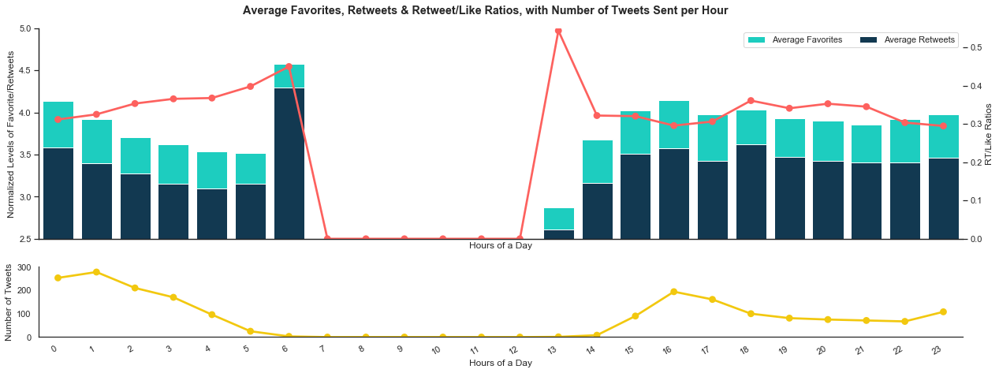

In [203]:
# 绘制发推时间点及时间点对应的平均点赞、转发和转赞比
fig510, (ax5100, ax5102) = plt.subplots(2, 1, sharex=True,
                                        figsize=(21, 8), gridspec_kw={'height_ratios': [3, 1]})
ax5101 = ax5100.twinx()

# 绘制点赞量&转发量，将二者取10的对数避免极值影响观察
sns.barplot(x=pivot_tweets_per_hour['Hour'], y=pivot_tweets_per_hour['favorite_count'].apply(np.log10),
            ax=ax5100, color='#00EAD8', label='Average Favorites')
sns.barplot(x=pivot_tweets_per_hour['Hour'], y=pivot_tweets_per_hour['retweet_count'].apply(np.log10),
            ax=ax5100, color='#083B5B', label='Average Retweets')

# 绘制转赞比
sns.pointplot(x='Hour', y='RT/Like', data=pivot_tweets_per_hour,
              ax=ax5101, color='#FD615E')

# 绘制各时间点推文数量
sns.pointplot(x='Hour', y='tweet_id', data=pivot_tweets_per_hour,
              ax=ax5102, color='#F2C80F')

# fig441.legend(['5-Day Moving Average of Like/Retweet Ratio'], loc='upper left')
fig510.autofmt_xdate()
ax5100.set_ylim(2.5, 5)
ax5101.set_ylim(0.0, 0.55)
ax5102.set_ylim(0, 300)
sns.despine()

# 设置轴标题
ax5100.set(ylabel='Normalized Levels of Favorite/Retweets', xlabel="Hours of a Day")
ax5101.set(ylabel='RT/Like Ratios', xlabel="Hours of a Day")
ax5102.set(ylabel='Number of Tweets', xlabel="Hours of a Day")

# 设置图例
ax5100.legend(ncol=2, loc="upper right", frameon=True)

# 设置大图标题
plt.suptitle('Average Favorites, Retweets & Retweet/Like Ratios, with Number of Tweets Sent per Hour',
             fontweight='bold', y=.93)


In [204]:
# 创建所有推文按发出年份和时间点的聚合，并计算该时间点的平均点赞量，转发量和转赞比
pivot_tweets_per_hour_per_year = df510.pivot_table(values=['favorite_count', 'retweet_count', 'RT/Like', 'tweet_id'],
                                                    index=['Year', 'Hour'],
                                                    columns=None,
                                                    aggfunc={'favorite_count': np.mean,
                                                             'retweet_count': np.mean,
                                                             'tweet_id': len,
                                                             'RT/Like': np.mean})

# 为每年的发推时间点数据建立单独的数据集，并补全缺失的小时
# 2015 -------------------------------------------------------------------
pivot_tweets_per_hour_2015 = pivot_tweets_per_hour_per_year.loc[2015]
pivot_tweets_per_hour_2015 = pivot_tweets_per_hour_2015.copy()  # 复制一下，不然有警告

for num in missing_hours:
    pivot_tweets_per_hour_2015.loc[num] = 0

# 2016 -------------------------------------------------------------------
pivot_tweets_per_hour_2016 = pivot_tweets_per_hour_per_year.loc[2016]
pivot_tweets_per_hour_2016 = pivot_tweets_per_hour_2016.copy()  # 复制一下，不然有警告

num2016 = [7, 8, 9, 10, 11, 12, 13]

for num in num2016:
    pivot_tweets_per_hour_2016.loc[num] = 0

# 2017 -------------------------------------------------------------------
pivot_tweets_per_hour_2017 = pivot_tweets_per_hour_per_year.loc[2017]
pivot_tweets_per_hour_2017 = pivot_tweets_per_hour_2017.copy()  # 复制一下，不然有警告

num2017 = [5, 6, 7, 8, 9, 10, 11, 12, 13]

for num in num2017:
    pivot_tweets_per_hour_2017.loc[num] = 0


Text(0.5, 0.93, 'Average Favorites, Retweets & Retweet/Like Ratios, with Number of Tweets Sent per Hour per Year')

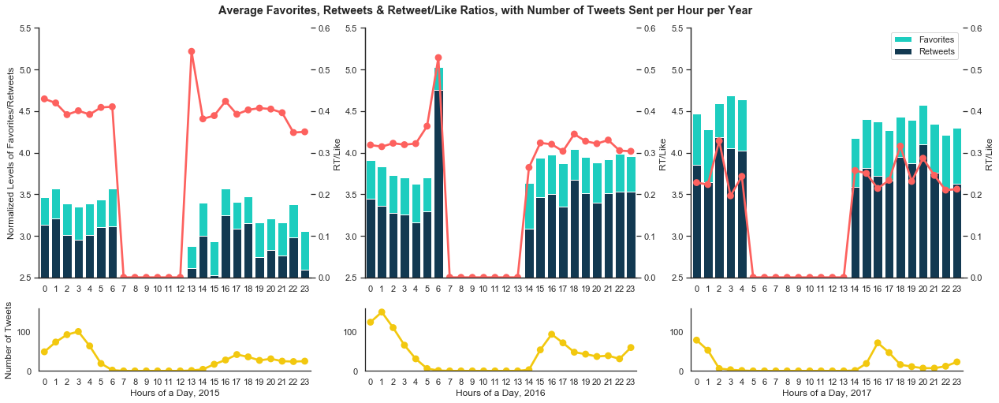

In [205]:
# 绘制发推时间点及时间点对应的平均点赞、转发和转赞比
fig511, ax5110 = plt.subplots(2, 3,
                              figsize=(21, 8), gridspec_kw={'height_ratios': [4, 1]})

# 2015 ------------------------------------------------------------------------------------------------------------------------------
# 绘制2015年点赞量&转发量，将二者取10的对数避免极值影响观察
sns.barplot(x=pivot_tweets_per_hour_2015.index, y=pivot_tweets_per_hour_2015['favorite_count'].apply(
    np.log10), ax=ax5110[0, 0], color='#00EAD8')
sns.barplot(x=pivot_tweets_per_hour_2015.index, y=pivot_tweets_per_hour_2015['retweet_count'].apply(
    np.log10), ax=ax5110[0, 0], color='#083B5B')

# 绘制转赞比
ax511a = ax5110[0, 0].twinx()
sns.pointplot(x=pivot_tweets_per_hour_2015.index, y=pivot_tweets_per_hour_2015['RT/Like'],
              ax=ax511a, color='#FD615E')

# 绘制各时间点推文数量
sns.pointplot(x=pivot_tweets_per_hour_2015.index,
              y=pivot_tweets_per_hour_2015['tweet_id'], ax=ax5110[1, 0], color='#F2C80F')

# 2016 ------------------------------------------------------------------------------------------------------------------------------
# 绘制2016年点赞量&转发量，将二者取10的对数避免极值影响观察
sns.barplot(x=pivot_tweets_per_hour_2016.index, y=pivot_tweets_per_hour_2016['favorite_count'].apply(
    np.log10), ax=ax5110[0, 1], color='#00EAD8')
sns.barplot(x=pivot_tweets_per_hour_2016.index, y=pivot_tweets_per_hour_2016['retweet_count'].apply(
    np.log10), ax=ax5110[0, 1], color='#083B5B')

# 绘制转赞比
ax511b = ax5110[0, 1].twinx()
sns.pointplot(x=pivot_tweets_per_hour_2016.index, y=pivot_tweets_per_hour_2016['RT/Like'],
              ax=ax511b, color='#FD615E')

# 绘制各时间点推文数量
sns.pointplot(x=pivot_tweets_per_hour_2016.index,
              y=pivot_tweets_per_hour_2016['tweet_id'], ax=ax5110[1, 1], color='#F2C80F')

# 2017 ------------------------------------------------------------------------------------------------------------------------------
# 绘制2017年点赞量&转发量，将二者取10的对数避免极值影响观察
sns.barplot(x=pivot_tweets_per_hour_2017.index, y=pivot_tweets_per_hour_2017['favorite_count'].apply(
    np.log10), ax=ax5110[0, 2], color='#00EAD8', label = 'Favorites')
sns.barplot(x=pivot_tweets_per_hour_2017.index, y=pivot_tweets_per_hour_2017['retweet_count'].apply(
    np.log10), ax=ax5110[0, 2], color='#083B5B', label = 'Retweets')

# 绘制转赞比
ax511c = ax5110[0, 2].twinx()
sns.pointplot(x=pivot_tweets_per_hour_2017.index, y=pivot_tweets_per_hour_2017['RT/Like'],
              ax=ax511c, color='#FD615E')

# 绘制各时间点推文数量
sns.pointplot(x=pivot_tweets_per_hour_2017.index,
              y=pivot_tweets_per_hour_2017['tweet_id'], ax=ax5110[1, 2], color='#F2C80F')

# 其他设置 -------------------------------------------------------------------------------------------------------------------------
# fig441.legend(['5-Day Moving Average of Like/Retweet Ratio'], loc='upper left')
# fig511.autofmt_xdate()

# 统一反映点赞量和转发量的柱状图坐标轴，去掉不影响观察的部分（低于2.5的部分）以突出变化情况
ax5110[0, 0].set_ylim(2.5, 5.5)
ax5110[0, 1].set_ylim(2.5, 5.5)
ax5110[0, 2].set_ylim(2.5, 5.5)

# 统一反映专注比的次坐标轴
ax511a.set_ylim(0, 0.6)
ax511b.set_ylim(0, 0.6)
ax511c.set_ylim(0, 0.6)

# 统一反映发帖量的折线图坐标轴
ax5110[1, 0].set_ylim(0, 160)
ax5110[1, 1].set_ylim(0, 160)
ax5110[1, 2].set_ylim(0, 160)

# 设置轴标题
ax5110[0, 0].set(ylabel='Normalized Levels of Favorites/Retweets', xlabel='')
ax5110[0, 1].set(ylabel='', xlabel='')
ax5110[0, 2].set(ylabel='', xlabel='')
ax5110[1, 0].set(ylabel='Number of Tweets', xlabel='Hours of a Day, 2015')
ax5110[1, 1].set(ylabel='', xlabel='Hours of a Day, 2016')
ax5110[1, 2].set(ylabel='', xlabel='Hours of a Day, 2017')

# 为柱状图设置图例
ax5110[0, 2].legend(loc='upper right')

# 设置图例
ax5100.legend(ncol=2, loc="upper right", frameon=True)

sns.despine()

# 设置大图标题
plt.suptitle('Average Favorites, Retweets & Retweet/Like Ratios, with Number of Tweets Sent per Hour per Year',
             fontweight='bold', y=.93)


观察：
- 整体情况
    - 发推习惯上，Nelson每天下午15-18点，22-次日凌晨1点都是发推高峰期；7-12点是雷打不动的睡觉/上课时间。
    - 创造力上，尽管其0：00之后的推文平均点赞和转发不断下降，但他凌晨6点发出的3条推特受欢迎程度远远高于其他时间点（虽然样本太少很难说这不是偶然）（但唯三在这个时间点发的都火了也不能说全是运气是不是）：
        - 平均点赞量高达37989.666667；
        - 平均转发量高达19654.333333；
        - 平均转赞比高达0.449876
- 逐年情况
    - 发推习惯上：
        - Nelson睡觉的时间变长了：时间由15年的7-12点，到16年的7-13点，到18年的5-13点；
    - 受欢迎程度上：
        - 每年点赞量（10的对数）都较之前提升0.5，说明账号确实越来越受欢迎；
        - 每年的点赞比都较之前降低0.1左右；
        - 16年有一条清晨6点发出的推点赞数突破了10万，但那仅仅是有1条推特；
        - 时间点的受欢迎程度上，看不出不同的时间点之间有明显的不同。
        
总体来看，每小时的推文数量确实有波动，但这不代表某个小时的创造力就是比别的时间段高，也很难证明某几个小时的推文就是比其他的时间段的推文受欢迎。对这个方向，我们不做进一步的探究。

## 5.2 一周中的某一天对受欢迎程度的影响

In [206]:
# 创建临时数据集
df520 = dogrates_clean.copy()

# 提取时间和年份信息
df520['Weekday'] = df520['timestamp'].map(
    lambda x: x.dayofweek)
df520['Year'] = df520['timestamp'].map(
    lambda x: x.year)


In [207]:
df520.head(1)

,tweet_id,timestamp,text,single_dog,name,stage_count,stage(s),average,favorite_count,retweet_count,jpg_url,breed,gender,RT/Like,average_cate,dog?,Weekday,Year
0,892420643555336193,2017-08-01 16:23:56,This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,True,Phineas,0,Not Specified,13.0,39492,8842,https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg,orange,Male,0.223893,high,not dog,1,2017


In [208]:
# 创建所有推文按发出时间点的据合，并计算该时间点的平均点赞量，转发量和转赞比
pivot_tweets_per_weekday = df520.pivot_table(values=['favorite_count', 'retweet_count', 'RT/Like', 'tweet_id'],
                                           index=['Weekday'],
                                           columns=None,
                                           aggfunc={'favorite_count': np.mean,
                                                    'retweet_count': np.mean,
                                                    'tweet_id': len,
                                                    'RT/Like': np.mean})


# 重设索引以利用小时
pivot_tweets_per_weekday = pivot_tweets_per_weekday.reset_index()

# 检视结果
pivot_tweets_per_weekday


,Weekday,RT/Like,favorite_count,retweet_count,tweet_id
0,0,0.335145,8489.864615,2625.160000,325
1,1,0.332074,9116.596610,2728.200000,295
2,2,0.331167,10090.249158,3122.848485,297
3,3,0.329919,8346.679577,2521.507042,284
4,4,0.329641,8749.848057,2792.402827,283
5,5,0.330088,8943.746032,2952.067460,252
6,6,0.322364,8665.345098,2642.101961,255


Text(0.5, 0.93, 'Average Favorites, Retweets & Retweet/Like Ratios, with Number of Tweets Sent per Weekday')

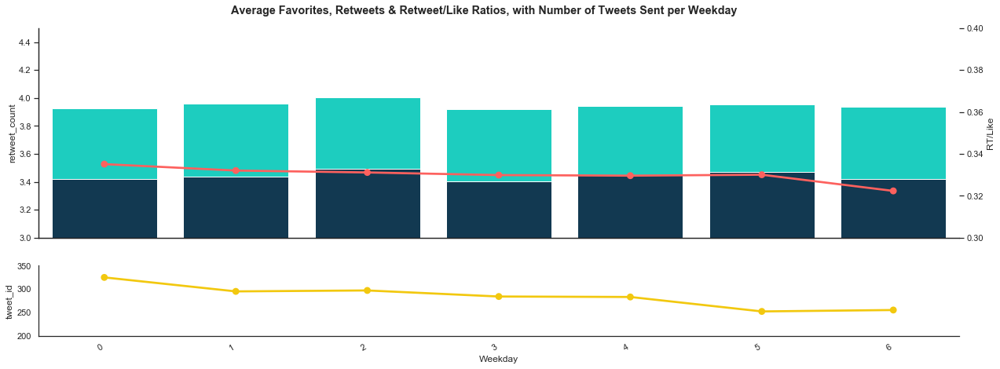

In [209]:
# 绘制发推时间点及时间点对应的平均点赞、转发和转赞比
fig520, (ax5200, ax5202) = plt.subplots(2, 1, sharex=True,
                                        figsize=(21, 8), gridspec_kw={'height_ratios': [3, 1]})
ax5201 = ax5200.twinx()

# 绘制点赞量&转发量，将二者取10的对数避免极值影响观察
sns.barplot(x=pivot_tweets_per_weekday['Weekday'], y=pivot_tweets_per_weekday['favorite_count'].apply(np.log10),
            ax=ax5200, color='#00EAD8')
sns.barplot(x=pivot_tweets_per_weekday['Weekday'], y=pivot_tweets_per_weekday['retweet_count'].apply(np.log10),
            ax=ax5200, color='#083B5B')

# 绘制转赞比
sns.pointplot(x='Weekday', y='RT/Like', data=pivot_tweets_per_weekday,
              ax=ax5201, color='#FD615E')

# 绘制各时间点推文数量
sns.pointplot(x='Weekday', y='tweet_id', data=pivot_tweets_per_weekday,
              ax=ax5202, color='#F2C80F')

# fig441.legend(['5-Day Moving Average of Like/Retweet Ratio'], loc='upper left')
fig520.autofmt_xdate()
ax5200.set_ylim(3.0, 4.5)
ax5201.set_ylim(0.3, 0.4)
ax5202.set_ylim(200, 350)
sns.despine()

# 设置大图标题
plt.suptitle('Average Favorites, Retweets & Retweet/Like Ratios, with Number of Tweets Sent per Weekday',
             fontweight='bold', y=.93)


In [210]:
# 创建所有推文按发出年份和时间点的聚合，并计算该时间点的平均点赞量，转发量和转赞比
pivot_tweets_per_weekday_per_year = df520.pivot_table(values=['favorite_count', 'retweet_count', 'RT/Like', 'tweet_id'],
                                                    index=['Year', 'Weekday'],
                                                    columns=None,
                                                    aggfunc={'favorite_count': np.mean,
                                                             'retweet_count': np.mean,
                                                             'tweet_id': len,
                                                             'RT/Like': np.mean})

# 为每年的发推时间点数据建立单独的数据集，并补全缺失的小时
# 2015 -------------------------------------------------------------------
pivot_tweets_per_weekday_2015 = pivot_tweets_per_weekday_per_year.loc[2015]
pivot_tweets_per_weekday_2015 = pivot_tweets_per_weekday_2015.copy()  # 复制一下，不然有警告


# 2016 -------------------------------------------------------------------
pivot_tweets_per_weekday_2016 = pivot_tweets_per_weekday_per_year.loc[2016]
pivot_tweets_per_weekday_2016 = pivot_tweets_per_weekday_2016.copy()  # 复制一下，不然有警告

# 2017 -------------------------------------------------------------------
pivot_tweets_per_weekday_2017 = pivot_tweets_per_weekday_per_year.loc[2017]
pivot_tweets_per_weekday_2017 = pivot_tweets_per_weekday_2017.copy()  # 复制一下，不然有警告



Text(0.5, 0.93, 'Average Favorites, Retweets & Retweet/Like Ratios, with Number of Tweets Sent per Weekday per Year')

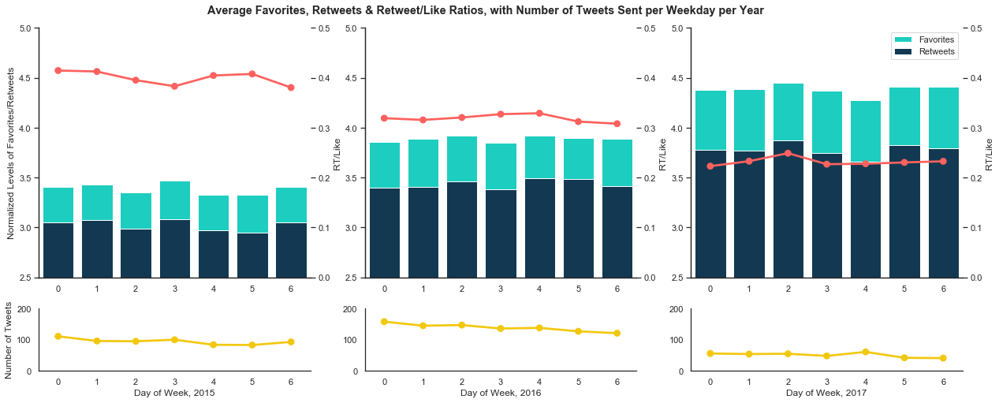

In [211]:
# 绘制发推时间点及时间点对应的平均点赞、转发和转赞比
fig521, ax5210 = plt.subplots(2, 3,
                              figsize=(21, 8), gridspec_kw={'height_ratios': [4, 1]})

# 2015 ------------------------------------------------------------------------------------------------------------------------------
# 绘制2015年点赞量&转发量，将二者取10的对数避免极值影响观察
sns.barplot(x=pivot_tweets_per_weekday_2015.index, y=pivot_tweets_per_weekday_2015['favorite_count'].apply(
    np.log10), ax=ax5210[0, 0], color='#00EAD8')
sns.barplot(x=pivot_tweets_per_weekday_2015.index, y=pivot_tweets_per_weekday_2015['retweet_count'].apply(
    np.log10), ax=ax5210[0, 0], color='#083B5B')

# 绘制转赞比
ax521a = ax5210[0, 0].twinx()
sns.pointplot(x=pivot_tweets_per_weekday_2015.index, y=pivot_tweets_per_weekday_2015['RT/Like'],
              ax=ax521a, color='#FD615E')

# 绘制各时间点推文数量
sns.pointplot(x=pivot_tweets_per_weekday_2015.index,
              y=pivot_tweets_per_weekday_2015['tweet_id'], ax=ax5210[1, 0], color='#F2C80F')

# 2016 ------------------------------------------------------------------------------------------------------------------------------
# 绘制2016年点赞量&转发量，将二者取10的对数避免极值影响观察
sns.barplot(x=pivot_tweets_per_weekday_2016.index, y=pivot_tweets_per_weekday_2016['favorite_count'].apply(
    np.log10), ax=ax5210[0, 1], color='#00EAD8')
sns.barplot(x=pivot_tweets_per_weekday_2016.index, y=pivot_tweets_per_weekday_2016['retweet_count'].apply(
    np.log10), ax=ax5210[0, 1], color='#083B5B')

# 绘制转赞比
ax521b = ax5210[0, 1].twinx()
sns.pointplot(x=pivot_tweets_per_weekday_2016.index, y=pivot_tweets_per_weekday_2016['RT/Like'],
              ax=ax521b, color='#FD615E')

# 绘制各时间点推文数量
sns.pointplot(x=pivot_tweets_per_weekday_2016.index,
              y=pivot_tweets_per_weekday_2016['tweet_id'], ax=ax5210[1, 1], color='#F2C80F')

# 2017 ------------------------------------------------------------------------------------------------------------------------------
# 绘制2017年点赞量&转发量，将二者取10的对数避免极值影响观察
sns.barplot(x=pivot_tweets_per_weekday_2017.index, y=pivot_tweets_per_weekday_2017['favorite_count'].apply(
    np.log10), ax=ax5210[0, 2], color='#00EAD8', label='Favorites')
sns.barplot(x=pivot_tweets_per_weekday_2017.index, y=pivot_tweets_per_weekday_2017['retweet_count'].apply(
    np.log10), ax=ax5210[0, 2], color='#083B5B', label='Retweets')

# 绘制转赞比
ax521c = ax5210[0, 2].twinx()
sns.pointplot(x=pivot_tweets_per_weekday_2017.index, y=pivot_tweets_per_weekday_2017['RT/Like'],
              ax=ax521c, color='#FD615E')

# 绘制各时间点推文数量
sns.pointplot(x=pivot_tweets_per_weekday_2017.index,
              y=pivot_tweets_per_weekday_2017['tweet_id'], ax=ax5210[1, 2], color='#F2C80F')

# 其他设置 -------------------------------------------------------------------------------------------------------------------------
# fig441.legend(['5-Day Moving Average of Like/Retweet Ratio'], loc='upper left')
# fig511.autofmt_xdate()

# 统一反映点赞量和转发量的柱状图坐标轴，去掉不影响观察的部分（低于2.5的部分）以突出变化情况
ax5210[0, 0].set_ylim(2.5, 5)
ax5210[0, 1].set_ylim(2.5, 5)
ax5210[0, 2].set_ylim(2.5, 5)

# 统一反映专注比的次坐标轴
ax521a.set_ylim(0, 0.5)
ax521b.set_ylim(0, 0.5)
ax521c.set_ylim(0, 0.5)

# 统一反映发帖量的折线图坐标轴
ax5210[1, 0].set_ylim(0, 200)
ax5210[1, 1].set_ylim(0, 200)
ax5210[1, 2].set_ylim(0, 200)

sns.despine()

# 设置轴标题
ax5210[0, 0].set(ylabel='Normalized Levels of Favorites/Retweets', xlabel='')
ax5210[0, 1].set(ylabel='', xlabel='')
ax5210[0, 2].set(ylabel='', xlabel='')
ax5210[1, 0].set(ylabel='Number of Tweets', xlabel='Day of Week, 2015')
ax5210[1, 1].set(ylabel='', xlabel='Day of Week, 2016')
ax5210[1, 2].set(ylabel='', xlabel='Day of Week, 2017')

# 为柱状图设置图例
ax5210[0, 2].legend(loc='upper right')

# 设置大图标题
plt.suptitle('Average Favorites, Retweets & Retweet/Like Ratios, with Number of Tweets Sent per Weekday per Year',
             fontweight='bold', y=.93)


观察：
- 整体情况
    - 无论星期几，推文的平均点赞，平均转发和转赞比都非常平缓；
    - 硬要说什么不同的话：
        - 点赞量上，周三平均点赞量稍高，在10<sup>4</sup>，也即1万左右，其他天数的平均点赞量都在10<sup>3.9</sup>左右徘徊，也即8000左右，属于小幅正常波动；
        - 转赞比上，周一转赞比稍高，周日转赞比稍低，差距在0.02之间，属于小幅的正常波动；
    - 发推习惯上，Nelson每周一的发帖数量多余一周中剩余的天数。
- 逐年情况
    - 波动情况较所有年份聚合在一起时稍大，但也在小幅波动下总体平稳，看不出有明显的趋势。
    
总体来看看不出发帖星期相关的因素。我们不再进一步研究相关内容。

# 6. 数据的可视化与分析II：推文内容对推文受欢迎程度的影响
---

## 6.0 是骡子是马，先画出来看看

### 1. 点赞量/转赞比与品种的关系

In [212]:
pivot_breeds_plotting_enhanced = pivot_breeds_enhanced.reset_index().head(10)
pivot_breeds_plotting_enhanced


breed   RT/Like           favorite_count                \
                                mean       var           mean           var   
0                   Saluki  0.231612  0.001874   23996.250000  4.339710e+08   
1           French_bulldog  0.272406  0.006962   17854.769231  4.900946e+08   
2             Afghan_hound  0.320666  0.003847   17250.666667  1.042446e+08   
3  black-and-tan_coonhound  0.312262  0.009321   16952.500000  5.671375e+08   
4    flat-coated_retriever  0.271282  0.009093   16731.625000  2.593176e+08   
5      Irish_water_spaniel  0.300861  0.003500   16335.333333  1.554033e+08   
6          standard_poodle  0.329931  0.014794   15732.142857  1.229594e+09   
7         English_springer  0.287837  0.010762   15631.222222  1.223449e+09   
8                 Cardigan  0.295001  0.004941   15251.705882  1.262056e+08   
9                 Leonberg  0.290442  0.004919   14870.000000  1.808465e+08   

  retweet_count tweet_id  
           mean      len  
0   5103.250000        4  
1   4656.384615       26  
2   5946.000000        3  
3   4144.000000        2  
4   4500.125000        8  
5   4475.000000        3  
6   6602.142857        7  
7   5948.666667        9  
8   4513.647059       17  
9   3842.000000        3

Text(0.5, 1.04, 'Details of Most Favored Breeds')

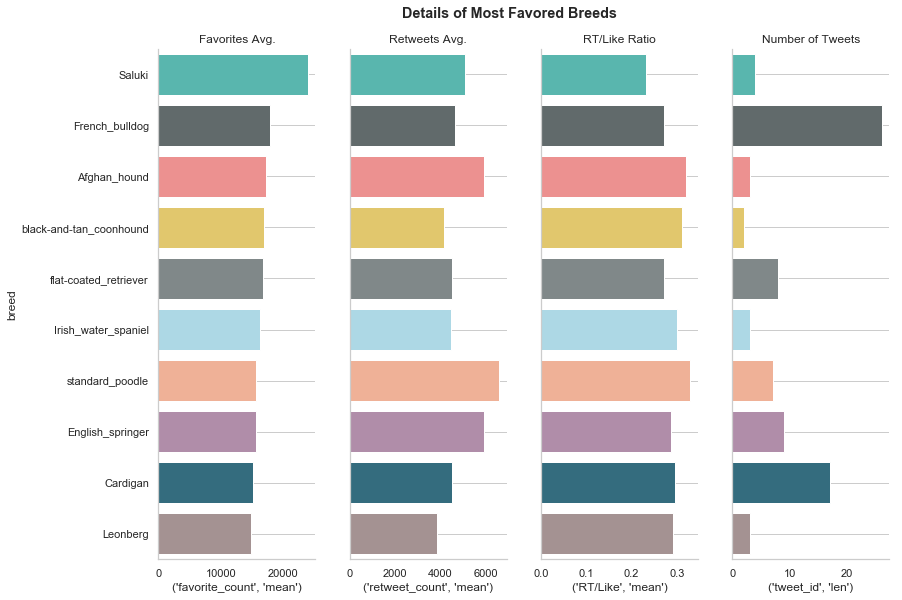

In [213]:
# 'https://seaborn.pydata.org/examples/pairgrid_dotplot.html'


sns.set(style='whitegrid')

fig610 = sns.PairGrid(pivot_breeds_plotting_enhanced, palette=ui_palette_light, x_vars=[('favorite_count', 'mean'), ('retweet_count', 'mean'), ('RT/Like', 'mean'),
                                                                                        ('tweet_id',  'len')], y_vars=['breed'], height=8, aspect=.35)

fig610 = fig610.map(sns.barplot, orient='h', edgecolor='w',
                    palette=ui_palette_light)
# sns.despine(bottom=True, left=True)

# 设定标题，轴等
titles = ['Favorites Avg.', 'Retweets Avg.',
          'RT/Like Ratio', 'Number of Tweets']

for ax, title in zip(fig610.axes.flat, titles):

    # 为每个轴单独设定标题
    ax.set(title=title)

    # 取消纵向网格线，改为水平网格线
    ax.xaxis.grid(False)
    ax.yaxis.grid(True)

# 设置大图标题
plt.suptitle('Details of Most Favored Breeds', fontweight='bold', y=1.04)


经过上面的一系列操作，我们得到了平均点赞量前10的狗狗品种（点赞量由高到低排序）。

从上图看来，萨卢基猎犬收获的平均点赞量最多，其次是法国斗牛犬和阿富汗猎犬；但在转赞比上，阿富汗猎犬，斑点狗和标准贵宾犬的转赞比较高。另外，萨卢基猎犬，阿富汗猎犬等较为稀有的品种推特数量也较少。

我们想问：有没有狗狗品种收获的平均点赞量显著的超越其他的品种呢？有没有狗狗的品种有显著的粉丝群体呢？想要解答这两个问题，我们将跟别对上图挑选出来的10各品种的点赞量和转赞比分别做因此方差分析。

### 2. 生长阶段与点赞量/转赞比的关系

推主Marr Nelson在表述狗狗的时候发明了如下词汇：
- Doggo，可以简单的理解为大狗（尽管作者表示这并不代表大狗就不是宝宝了）
- Pupper，可以简单的理解为小狗，主要是体型小，一般年龄也比较小（但这不代表大狗就不是宝宝了）
- Puppo，可以简单的理解为青春期的狗狗，介于大狗和小狗之间（也可能是表现得像pupper的doggo）
- Floofer，可以简单的立即为毛好看的狗狗。

这些词汇主要用于形容不同狗狗的生长状态。从词汇构成的角度来看，其主要由一个主词汇和后缀变体组成（例如doggo = dog + go, pupper = pup + per），营造出一种喜庆但略显低龄化的语言现象（待补充）。上述所谓的“简单理解”，是指在尽可能不曲解原意的情况下，抛弃作者营造的一切搞笑成分，并尽量压缩理解难度。总而言之言而总之一言以蔽之，这个分类比较随意，亲爱的读者你大概知道这么个意思就行。



我们不禁感到好奇：小狗会更受欢迎吗？不同的分类之间到底有没有受到喜爱程度的区别呢？如果有，多大呢？我们先用箱型图展示一下不同分类之间的点赞量额转赞比的分布情况。

Text(0.5, 0.93, 'Stage Difference on Favorites and RT/Like Ratios (Normalized)')

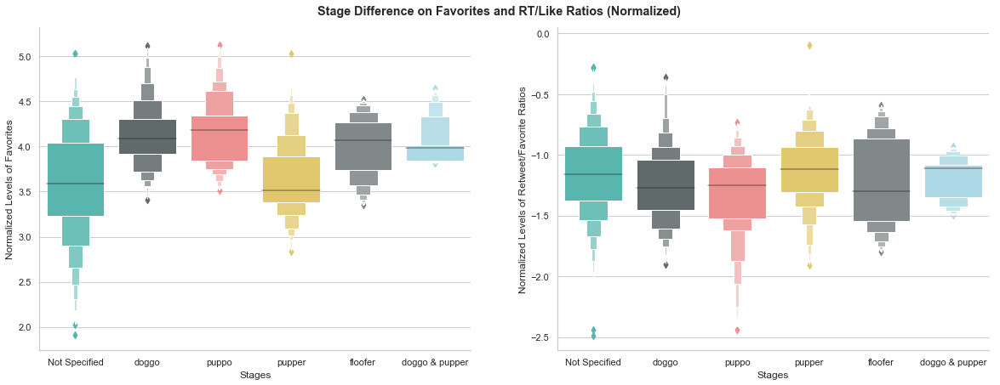

In [214]:
# 绘制不同分类的点赞量和转赞比分布情况
fig620, (ax6200, ax6201) = plt.subplots(1, 2, figsize=(20, 7))

# 绘制点赞量分布图
sns.boxenplot(x=dogrates_clean['stage(s)'], y=dogrates_clean['favorite_count'].apply(np.log10), palette = ui_palette_light, ax=ax6200)

# 绘制转赞比分布图
sns.boxenplot(x=dogrates_clean['stage(s)'], y=dogrates_clean['RT/Like'].apply(np.log), palette = ui_palette_light, ax=ax6201)

sns.despine()

# 设置轴标题
ax6200.set(ylabel='Normalized Levels of Favorites', xlabel="Stages")
ax6201.set(ylabel='Normalized Levels of Retweet/Favorite Ratios', xlabel="Stages")

# 设置大图标题
plt.suptitle('Stage Difference on Favorites and RT/Like Ratios (Normalized)', fontweight='bold', y=.93)


### 3. 评分与转发量/点赞数的关系

诚然，推主在每条推特中对狗狗的打分都是出于娱乐目的。但分数越高，确实越有可能代表着狗狗的故事更加搞笑/欢乐，进而带来更多的点赞和转发。另外，分数低的推文并不代表魅力全无，其很可能是故意为之；比如这副😆：

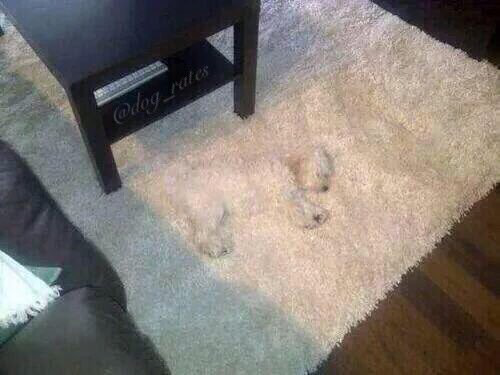

1517    What kind of person sends in a picture without a dog in it? 1/10 just because that's a nice table https://t.co/RDXCfk8hK0
Name: text, dtype: object

In [215]:
# example 3: Not Dog
show_tweet_pic(method='tweet_id', tweet_id = 675153376133427200)


因此，探索不同分数等级的点赞量和转赞比情况，我们有可能能够发现更受欢迎的内容。我们将首先直观的绘制不同分数等级的分布情况；随后，我们将绘制每个分数对应的点赞量和转赞，观察其是否有潜在的线性关系；最后，我们将探索分数等级之间的均值是否相同，进而判断不同的分数等级之间是否拥有足够的差异。

Text(0.5, 0.93, 'Scattered Favorites & Retweets for Average Categories (Normalized)')

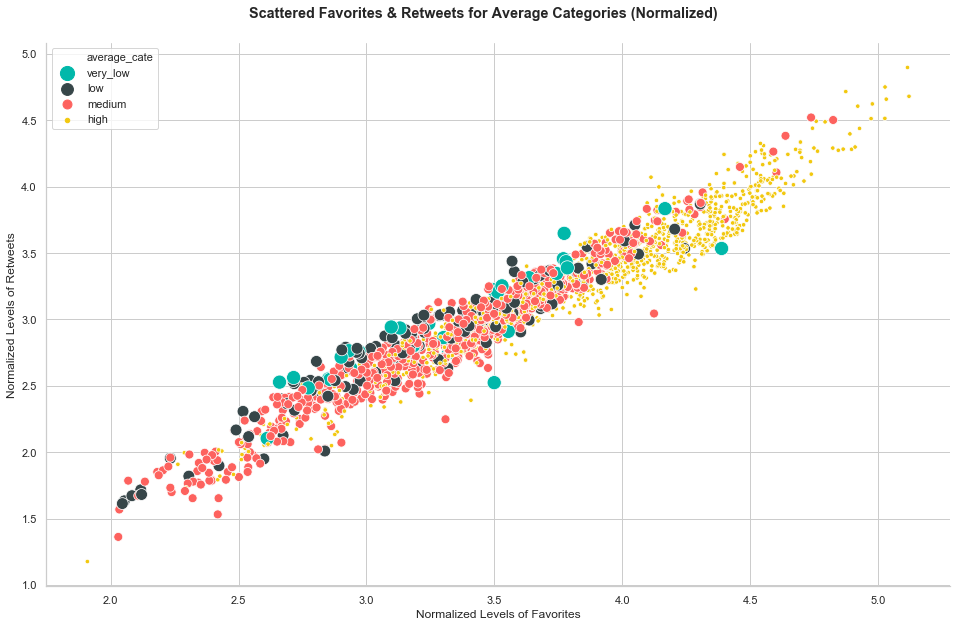

In [216]:
# 绘制不同分数等级的分布情况的散点图，以不同颜色表达不同分数等级
fig630, ax630 = plt.subplots(figsize=(16.2, 10))

ax630 = sns.scatterplot(x=dogrates_clean['favorite_count'].apply(np.log10), y=dogrates_clean['retweet_count'].apply(np.log10), hue='average_cate',
                        size='average_cate', sizes=(20, 200), data=dogrates_clean, palette=["#01B8AA", "#374649", "#FD625E", "#F2C80F"])

sns.despine()

# 设置轴标题
ax630.set(ylabel='Normalized Levels of Retweets', xlabel="Normalized Levels of Favorites")
ax630.legend()

# 设置大图标题
plt.suptitle('Scattered Favorites & Retweets for Average Categories (Normalized)',
             fontweight='bold', y=.93)


Text(0.5, 0.93, 'Scattered Favorites & RT/Like Ratios for Average Ratings (Normalized)')

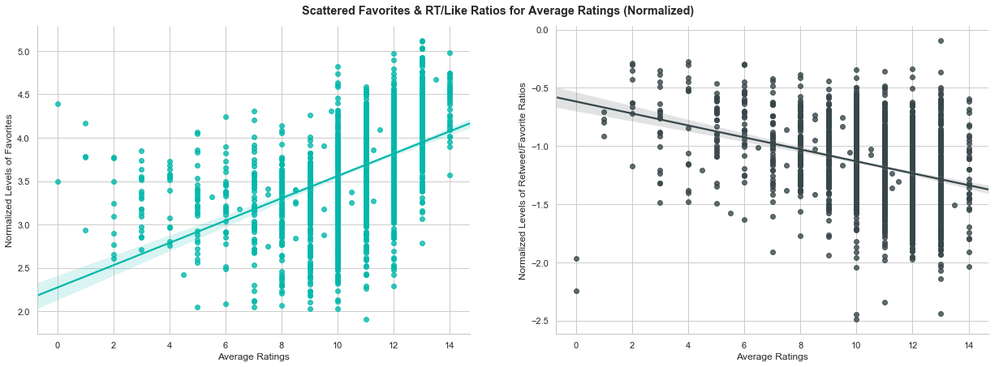

In [217]:
fig631, (ax6310, ax6311) = plt.subplots(1, 2, figsize=(21, 7))

sns.regplot(x=dogrates_clean['average'], y=dogrates_clean['favorite_count'].apply(
    np.log10), color='#01B8AA', ax=ax6310)

sns.regplot(x=dogrates_clean['average'],
            y=dogrates_clean['RT/Like'].apply(np.log), color='#374649', ax=ax6311)

sns.despine()

# 设置轴标题
ax6310.set(ylabel='Normalized Levels of Favorites', xlabel="Average Ratings")
ax6311.set(ylabel='Normalized Levels of Retweet/Favorite Ratios', xlabel="Average Ratings")

# 设置大图标题
plt.suptitle('Scattered Favorites & RT/Like Ratios for Average Ratings (Normalized)',
             fontweight='bold', y=.93)


Text(0.5, 0.93, 'Distribution of Favorites & Retweets for Average Categories (Normalized)')

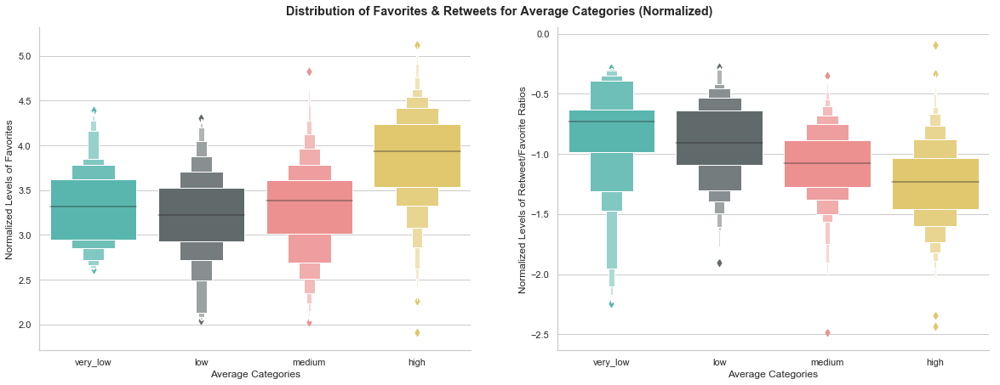

In [218]:
# 绘制不同分类的点赞量和转赞比分布情况
fig632, (ax6320, ax6321) = plt.subplots(1, 2, figsize=(20, 7))

# 绘制点赞量分布图
sns.boxenplot(x=dogrates_clean['average_cate'], y=dogrates_clean['favorite_count'].apply(
    np.log10), palette=ui_palette_light, ax=ax6320)

# 绘制转赞比分布图
sns.boxenplot(x=dogrates_clean['average_cate'], y=dogrates_clean['RT/Like'].apply(
    np.log), palette=ui_palette_light, ax=ax6321)

sns.despine()

# 设置轴标题
ax6320.set(ylabel='Normalized Levels of Favorites', xlabel="Average Categories")
ax6321.set(ylabel='Normalized Levels of Retweet/Favorite Ratios', xlabel="Average Categories")

# 设置大图标题
plt.suptitle('Distribution of Favorites & Retweets for Average Categories (Normalized)',
             fontweight='bold', y=.93)


观察上三张图可知：
- 高分数段的的点赞与转发横跨范围最广；
- 最低分数段的转赞比最高；
- 分数超过一定范围之后，点赞数往往随着分数的上升而增加；
- 转赞比随着分数的增加不断降低（0分除外）；
- 对点赞数拟合的线性回归模型在高分数段效果较好，低分数段的实际结果远远高于线性回归的预测。

我们不禁要问：点赞量和转赞比的关系究竟是怎样的？这种关系能够多大程度上反映实际情况？我们将首先利用线性回归模型来尝试解答这一疑问。

但是，中了线性回归的结果显然是不够的。正如fig632所示，当我们将分数分段，不同分数段之间的点赞量和转赞比也是有区别的。哪个分数段的记过与其他显著的不同？上述观察能否在统计上站住脚？这个结论效应量多大呢？我们还需要进行单因素方差分析来进一步加强我们的结果。

### 4. 推文主题是不是狗的影响

Text(0.5, 0.93, 'Distribution of Favorites & RT/Like Ratios for Possibility Levels of Tweets Talking About Dogs (Normalized)')

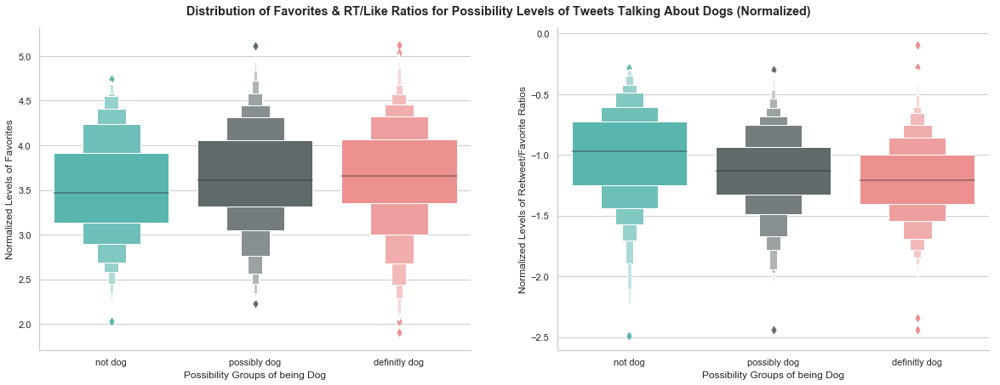

In [219]:
# 绘制不同分类的点赞量和转赞比分布情况
fig640, (ax6400, ax6401) = plt.subplots(1, 2, figsize=(20, 7))

# 绘制点赞量分布图
sns.boxenplot(x=dogrates_clean['dog?'], y=dogrates_clean['favorite_count'].apply(
    np.log10), palette=ui_palette_light, ax=ax6400)

# 绘制转赞比分布图
sns.boxenplot(x=dogrates_clean['dog?'], y=dogrates_clean['RT/Like'].apply(
    np.log), palette=ui_palette_light, ax=ax6401)

sns.despine()

# 设置轴标题
ax6400.set(ylabel='Normalized Levels of Favorites', xlabel="Possibility Groups of being Dog")
ax6401.set(ylabel='Normalized Levels of Retweet/Favorite Ratios', xlabel="Possibility Groups of being Dog")

# 设置大图标题
plt.suptitle('Distribution of Favorites & RT/Like Ratios for Possibility Levels of Tweets Talking About Dogs (Normalized)', fontweight='bold', y=.93)


仔细观察箱型图发现，推文主题是否是狗的分类在点赞量和转赞比上的均值分布差距不算大。看来这一因素跟推文的受欢迎程度并无强烈的相关关系，我们不做深入探索。

### 5. 点赞量/转赞比与性别的关系

Text(0.5, 1.02, 'Distribution of RT/Like Ratios for Average Ratings')

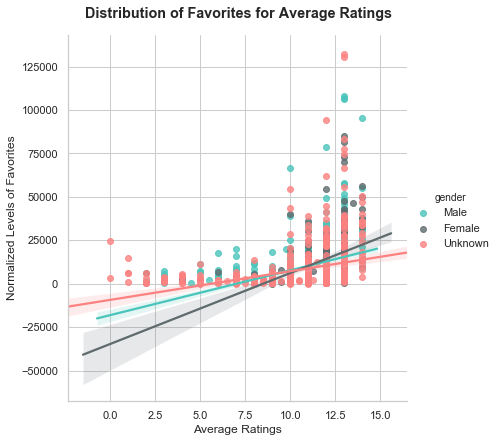

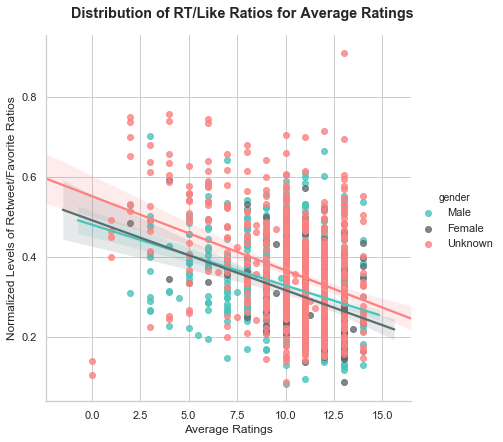

In [220]:
# 绘制性别的点赞量与转赞比的散点/多重线性回归图

ax6500 = sns.lmplot(x='average', y='favorite_count', hue='gender',
                    data=dogrates_clean, palette=ui_palette_light, height=6)
# 设置轴标题
ax6500.set(ylabel='Normalized Levels of Favorites', xlabel="Average Ratings")

# 设置大图标题
plt.suptitle('Distribution of Favorites for Average Ratings',
             fontweight='bold', y=1.02)

ax6501 = sns.lmplot(x='average', y='RT/Like', hue='gender',
                    data=dogrates_clean, palette=ui_palette_light, height=6)

# 设置轴标题
ax6501.set(ylabel='Normalized Levels of Retweet/Favorite Ratios', xlabel="Average Ratings")

# 设置大图标题
plt.suptitle('Distribution of RT/Like Ratios for Average Ratings',
             fontweight='bold', y=1.02)


Text(0.5, 0.95, 'Distribution of Favorites & RT/Like Ratios for Gender Groups')

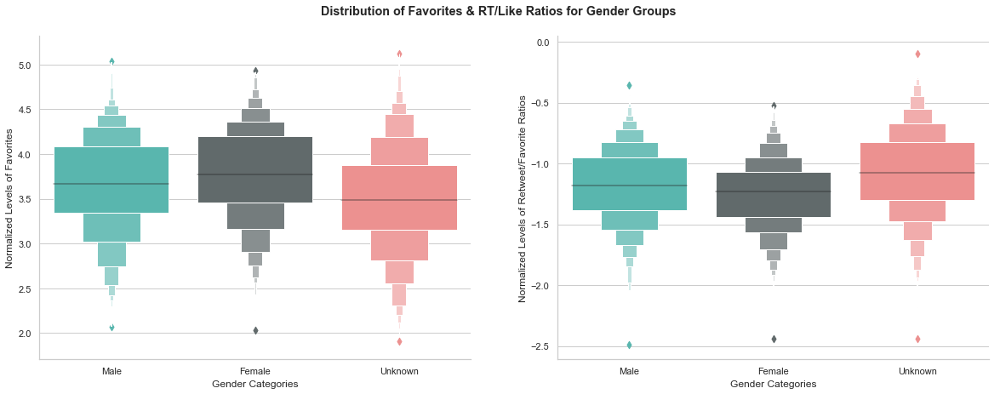

In [221]:
# 绘制不同分类的点赞量和转赞比分布情况
fig651, (ax6510, ax6511) = plt.subplots(1, 2, figsize=(20, 7))

# 绘制点赞量分布图
sns.boxenplot(x=dogrates_clean['gender'], y=dogrates_clean['favorite_count'].apply(
    np.log10), palette=ui_palette_light, ax=ax6510)

# 绘制转赞比分布图
sns.boxenplot(x=dogrates_clean['gender'], y=dogrates_clean['RT/Like'].apply(
    np.log), palette=ui_palette_light, ax=ax6511)

sns.despine()

# 设置轴标题
ax6510.set(ylabel='Normalized Levels of Favorites', xlabel="Gender Categories")
ax6511.set(ylabel='Normalized Levels of Retweet/Favorite Ratios', xlabel="Gender Categories")

# 设置大图标题
plt.suptitle('Distribution of Favorites & RT/Like Ratios for Gender Groups',
             fontweight='bold', y=.95)


从fig650和fig651看来，推文主体的不同性别确实有点赞数和专注那笔之间的差异，但其差异并不大（箱型图中差距没有超过0.5）。就算我们进一步分析，结论很可能不显著，甚至可能比较偏激（例如雌性主体能吸引更多点赞量是为什么？）。我们不会对这一分类做更进一步的探索。

## 6.1 转发量/点赞量与品种的关系

Text(0.5, 1.04, 'Details of Most Favored Breeds')

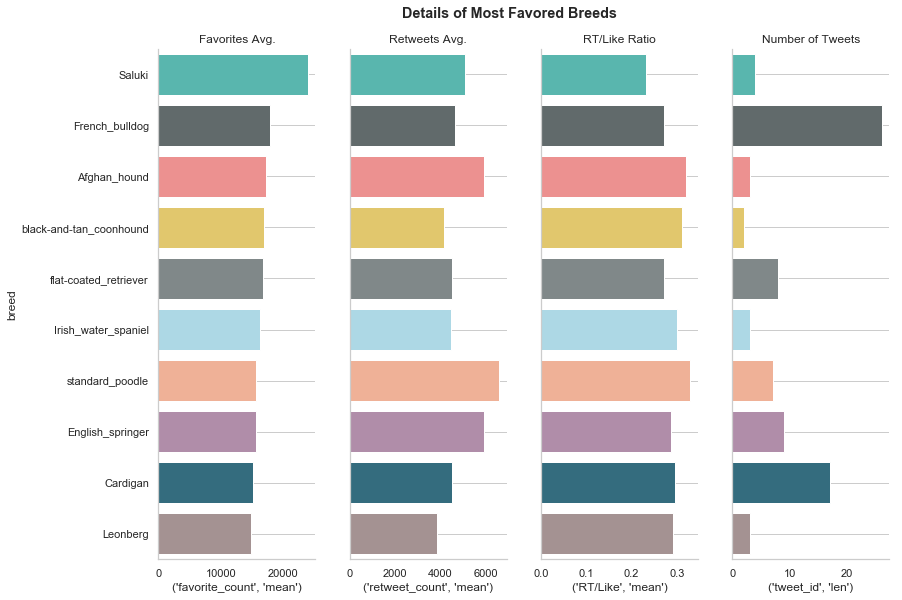

In [222]:
# 'https://seaborn.pydata.org/examples/pairgrid_dotplot.html'


sns.set(style='whitegrid')

fig610 = sns.PairGrid(pivot_breeds_plotting_enhanced, palette=ui_palette_light,
                      x_vars=[('favorite_count', 'mean'), ('retweet_count', 'mean'), ('RT/Like', 'mean'),
                              ('tweet_id',  'len')], y_vars=['breed'], height=8, aspect=.35)

fig610 = fig610.map(sns.barplot, orient='h', edgecolor='w',
                    palette=ui_palette_light)
# sns.despine(bottom=True, left=True)

# 设定标题，轴等
titles = ['Favorites Avg.', 'Retweets Avg.',
          'RT/Like Ratio', 'Number of Tweets']

for ax, title in zip(fig610.axes.flat, titles):

    # 为每个轴单独设定标题
    ax.set(title=title)

    # 取消纵向网格线，改为水平网格线
    ax.xaxis.grid(False)
    ax.yaxis.grid(True)

# 设置大图标题
plt.suptitle('Details of Most Favored Breeds', fontweight='bold', y=1.04)


### 6.1.1 对点赞量前10名的狗狗，点赞量的单因素方差分析（One-Way ANOVA）

单因素方差分析非常适合用来通过两个组别的样本判断其总体的平均数是否一致。

在这个方差分析中，我们的零假设（H<sub>0</sub>）是：这10个品种的狗狗的总体的点赞量的平均数是一致的；若分别用μ1， μ2等表示这些品种的平均点赞量，则μ1=μ2=...=μ9=μ10；我们的备择假设（H<sub>1</sub>）是：这10个品种中至少有两个品种的平均数不一致。

进行方差分析有三个前提条件：
- 总体服从正分布；
- 样本之间的方差齐性；
- 每个样本独立的独立性。

对于以上三个假设：
- 我们能确认每个样本之间是独立存在的。
- 我们看到，尽管原始点赞量偏移严重，但经过经过取对数处理后也不怎么正态，不过，保险起见我们会再用正态性检验检测一次；
- 我们需要对不同品种的点赞量进行方差齐性检验。

理论上，如果以上三个假设条件中任意一个不成立，我们就不能用[参数性的单因素方差分析](https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.f_oneway.html)，而需要转而使用[Kruskal-Wallis 单因子方差分析](https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.kruskal.html#scipy.stats.kruskal)。但是，因为返回的H值符合卡方分布，Kruskal-Wallis 单因子方差分析要求最小样本在5个以上，而根据我们的数据透视表，点赞量平均数前10名的狗狗，只有5种符合要求。因此，如果可能，我们还是使用传统的参数性单因素方差分析，因为同样[有研究指出](https://stats.stackexchange.com/questions/5680/can-i-trust-anova-results-for-a-non-normally-distributed-dv)，当样本容量足够大的时候，正态性对单因素方差分析影响较小。

在所有的假设检验中，我们所有的置信水平都选择95%，也即α值为0.05。

#### a) 检验正态性

我们首先检验正态性。在正态性检验中，我们的零假设（H<sub>0</sub>)是：点赞数量取10的对数后呈正态分布；我们的备择假设（H<sub>1</sub>）是：点赞数取10的对数后不呈正态分布。我们将使用scipy中statsmodel的normaltest执行这一检验。

In [223]:
# 参考 https://blog.csdn.net/cyan_soul/article/details/81236124?utm_source=blogxgwz8
s, p = stats.normaltest(dogrates_clean['favorite_count'].apply(np.log10))

if p < 0.05:
    print('应拒绝零假设，样本分布不呈正态性')
else:
    print('拒绝零假设失败，继续')


应拒绝零假设，样本分布不呈正态性


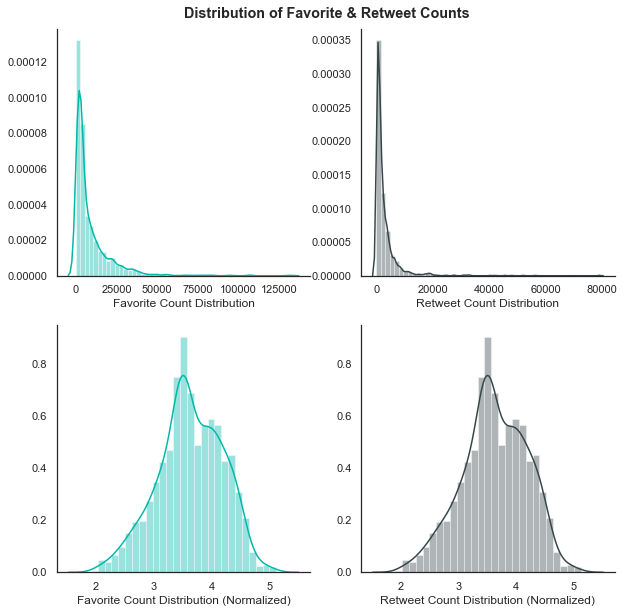

In [224]:
fig441

# 好吧，确实不咋正态

尴尬😥

#### b) 检验样本的方差齐性

我们将使用Levene检验测试品种之间点赞量的方差齐性。因为样本总体不呈正态，我们将使用默认的中值作为测试的数据。

我们的零假设（H<sub>0</sub>）是：所有的样本来自方差一致的总体。我们的备择假设（H<sub>1</sub>）是：所有样本来自的总体方差互不一致。

In [225]:
# 将需要检测的数据分组
favorite_test = [dogrates_clean[dogrates_clean['breed'] == 'Saluki']['favorite_count'].apply(np.log10),
                 dogrates_clean[dogrates_clean['breed'] ==
                                'French_bulldog']['favorite_count'].apply(np.log10),
                 dogrates_clean[dogrates_clean['breed'] ==
                                'Afghan_hound']['favorite_count'].apply(np.log10),
                 dogrates_clean[dogrates_clean['breed'] ==
                                'black-and-tan_coonhound']['favorite_count'].apply(np.log10),
                 dogrates_clean[dogrates_clean['breed'] ==
                                'flat-coated_retriever']['favorite_count'].apply(np.log10),
                 dogrates_clean[dogrates_clean['breed'] ==
                                'Irish_water_spaniel']['favorite_count'].apply(np.log10),
                 dogrates_clean[dogrates_clean['breed'] ==
                                'standard_poodle']['favorite_count'].apply(np.log10),
                 dogrates_clean[dogrates_clean['breed'] ==
                                'English_springer']['favorite_count'].apply(np.log10),
                 dogrates_clean[dogrates_clean['breed'] ==
                                'Cardigan']['favorite_count'].apply(np.log10),
                 dogrates_clean[dogrates_clean['breed'] == 'Leonberg']['favorite_count'].apply(np.log10)]


In [226]:
# 参考链接 https://pythonfordatascience.org/anova-python/
s, p = stats.levene(*favorite_test)

if p < 0.05:
    print('应拒绝零假设，样本不具方差齐性')
else:
    print('拒绝零假设失败， 继续')


拒绝零假设失败， 继续


上述检测完成，样本不呈正态分布，不过是符合方差齐性的。因此，我们对筛选出的10个品种的点赞量进行非参数性的Kruskal-Wallis单因子方差分析。

#### c) 对样本点赞量的单因素方差分析

In [227]:
# 参考链接
# https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.f_oneway.html#scipy.stats.f_oneway
# https://pythonfordatascience.org/anova-python/
stats.f_oneway(*favorite_test)


F_onewayResult(statistic=1.2714260977031635, pvalue=0.2673514594596377)

对挑出的10个平均点赞量最多的狗狗品种进行的单因素方差分析，得出了F值为1.2714260977031635，P值为0.2673514594596377，远远大于我们设定的α值0.05。

这意味着，我们推翻零假设失败，**人们对不同品种狗狗的点赞量并没有统计学意义上的不同**。我们在图形中展示的平均点赞量的前10名，其平均点赞量的差异是由于人们对这些品种有不同的偏好产生的的假设，没有统计学依据。

### 6.1.2 对点赞量前10名的狗狗，转赞比的单因素方差分析（One-Way ANOVA）

#### a) 检验正态性

我们首先检验正态性。在正态性检验中，我们的零假设（H<sub>0</sub>)是：点赞数量取10的对数后呈正态分布；我们的备择假设（H<sub>1</sub>）是：点赞数取10的对数后不呈正态分布。我们将使用scipy中statsmodel的normaltest执行这一检验。

In [228]:
# 参考 https://blog.csdn.net/cyan_soul/article/details/81236124?utm_source=blogxgwz8
s, p = stats.normaltest(dogrates_clean['RT/Like'].apply(np.log))

if p < 0.05:
    print('应拒绝零假设，样本分布不呈正态性')
else:
    print('拒绝零假设失败，继续')


应拒绝零假设，样本分布不呈正态性


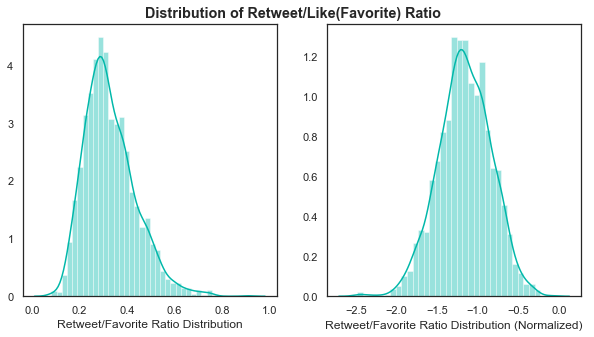

In [229]:
fig442

# 看右边那个
# 好吧，确实不咋正态

尴尬😥

#### b) 检验样本的方差齐性

我们将使用Levene检验测试品种之间转赞比的方差齐性。因为样本总体不呈正态，我们将使用默认的中值作为测试的数据。

我们的零假设（H<sub>0</sub>）是：所有的样本来自方差一致的总体。我们的备择假设（H<sub>1</sub>）是：所有样本来自的总体方差互不一致。

In [230]:
RTLikeRatio_test = [dogrates_clean[dogrates_clean['breed'] == 'Saluki']['RT/Like'].apply(np.log),
                    dogrates_clean[dogrates_clean['breed'] ==
                                   'French_bulldog']['RT/Like'].apply(np.log),
                    dogrates_clean[dogrates_clean['breed'] ==
                                   'Afghan_hound']['RT/Like'].apply(np.log),
                    dogrates_clean[dogrates_clean['breed'] ==
                                   'black-and-tan_coonhound']['RT/Like'].apply(np.log),
                    dogrates_clean[dogrates_clean['breed'] ==
                                   'flat-coated_retriever']['RT/Like'].apply(np.log),
                    dogrates_clean[dogrates_clean['breed'] ==
                                   'Irish_water_spaniel']['RT/Like'].apply(np.log),
                    dogrates_clean[dogrates_clean['breed'] ==
                                   'standard_poodle']['RT/Like'].apply(np.log),
                    dogrates_clean[dogrates_clean['breed'] ==
                                   'English_springer']['RT/Like'].apply(np.log),
                    dogrates_clean[dogrates_clean['breed'] ==
                                   'Cardigan']['RT/Like'].apply(np.log),
                    dogrates_clean[dogrates_clean['breed'] == 'Leonberg']['RT/Like'].apply(np.log)]


In [231]:
# 参考链接 https://pythonfordatascience.org/anova-python/
s, p = stats.levene(*RTLikeRatio_test)

if p < 0.05:
    print('应拒绝零假设，样本不具方差齐性')
else:
    print('拒绝零假设失败， 继续')


拒绝零假设失败， 继续


上述检测完成，样本不呈正态分布，不过是符合方差齐性的。因此，我们对筛选出的10个品种的转赞比进行非参数性的Kruskal-Wallis单因子方差分析。

#### c) 对样本转赞比的单因素方差分析

In [232]:
# https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.f_oneway.html#scipy.stats.f_oneway

stats.stats.f_oneway(*RTLikeRatio_test)


F_onewayResult(statistic=0.6229868719899678, pvalue=0.7737036509264877)

对挑出的10个平均转赞比最多的狗狗品种进行的单因素方差分析，得出了F值为5.13022058435709，P值为0.8228120104986223，远远大于我们设定的α值0.05。

这意味着，我们推翻零假设失败，**人们对不同品种狗狗的喜好程度（反映为转赞比）并没有统计学意义上的不同**。我们在图形中展示的平均点赞量的前10名，其平均转赞比的差异是由于人们对这些品种有不同的偏好产生的的假设，没有统计学依据。

### 6.1.3 小结

根据上述统计学检验，我们最终确认：人们对不同品种的点赞量并没有统计学意义上的不同

## 6.2 在狗狗不同的生长阶段，每个阶段的狗狗获得的转发量/点赞数是否不同？

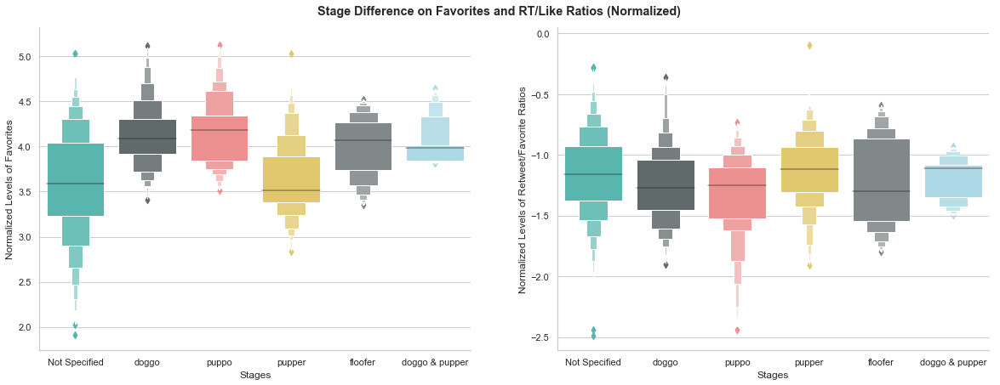

In [233]:
fig620

In [234]:
# 复制数据集，调整列名，标准化数据以更好地进行方差分析
df620 = dogrates_clean.copy()
df620 = df620.rename(columns={'stage(s)': 'stages'})
df620['RL_Ratio_log'] = df620['RT/Like'].apply(np.log)
df620['favorite_log'] = df620['favorite_count'].apply(np.log10)


In [235]:
df620.head(1)


,tweet_id,timestamp,text,single_dog,name,stage_count,stages,average,favorite_count,retweet_count,jpg_url,breed,gender,RT/Like,average_cate,dog?,RL_Ratio_log,favorite_log
0,892420643555336193,2017-08-01 16:23:56,This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,True,Phineas,0,Not Specified,13.0,39492,8842,https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg,orange,Male,0.223893,high,not dog,-1.496585,4.596509


### 6.2.1 对点赞量的单因素方差分析

进行方差分析有三个前提条件：
- 总体服从正分布；
- 样本之间的方差齐性；
- 每个样本独立的独立性。

对于以上三个假设：
- 我们能确认每个样本之间是独立存在的。
- 我们看到，尽管原始点赞量偏移严重，但经过经过取对数处理后也不怎么正态，不过，保险起见我们会再用正态性检验检测一次；
- 我们需要对不同品种的点赞量进行方差齐性检验。

理论上，如果以上三个假设条件中任意一个不成立，我们就不能用[参数性的单因素方差分析](https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.f_oneway.html)，而需要转而使用[Kruskal-Wallis 单因素方差分析](https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.kruskal.html#scipy.stats.kruskal)。

在所有的假设检验中，我们所有的置信水平都选择95%，也即α值为0.05。

#### a) 检验样本方差齐性

In [236]:
favorite_test_stages = [df620[df620['stages'] == 'Not Specified']['favorite_log'],
                        df620[df620['stages'] == 'doggo']['favorite_log'],
                        df620[df620['stages'] == 'puppo']['favorite_log'],
                        df620[df620['stages'] == 'pupper']['favorite_log'],
                        df620[df620['stages'] == 'floofer']['favorite_log'],
                        df620[df620['stages'] == 'doggo & pupper']['favorite_log']]


In [237]:
# 参考链接 https://pythonfordatascience.org/anova-python/
s, p = stats.levene(*favorite_test_stages)

if p < 0.05:
    print('应拒绝零假设，样本不具方差齐性')
else:
    print('拒绝零假设失败， 继续')


应拒绝零假设，样本不具方差齐性


#### b) 执行单因素方差分析

因为样本不具齐方差性，我们必须使用Kruskal Wallis 单因素方差分析。

In [238]:
# 使用scipy库的kruskal方法进行方差分析
# https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.kruskal.html
H, p = stats.kruskal(*favorite_test_stages)

if p < 0.05:
    print("H值为 {}， 对应P值为 {} < 0.05, 拒绝零假设".format(H, p))
else:
    print("H值为 {}， 对应P值为 {} > 0.05, 拒绝零假设失败".format(H, p))


H值为 84.35263997245896， 对应P值为 1.0289064814520131e-16 < 0.05, 拒绝零假设


根据上表的结果，我们的自由度为5，得出的H值为84.35263997245896，对应P值为1.0289064814520131e-16，小于我们设置的α值0.05。因此我们推翻零假设，不同分类之间的平均点赞量确实是有统计上显著的区别的。

我们接下来需要解答的两个问题，分别是：1）到底哪些组之间的均值互不相同？2）我们的统计结果能在多大程度上说明问题？

#### c) 哪些组之间均值不同——Dunn's检验

因为我们的样本不具有齐方差性，因此后续检验需要同样非参数性的检验方法。[Dunn's Test是Kruskal-Wallis单因素方差分析后续检验的好方法](https://stats.stackexchange.com/tags/dunn-test/info)。这是一个逐对比较不同分类均值的检验方法。其针对每一对比较的零假设(H<sub>0</sub>)是：[观察到从样本1中随机抽取的值大于样本2中随机抽取的值的几率为0.5](https://cran.r-project.org/web/packages/dunn.test/index.html)（[也即两样本的均值相同](https://www.statisticshowto.datasciencecentral.com/dunns-test/)）。其对应的备择假设（H<sub>1</sub>)为：观察到从样本1中随机抽取的值大于样本2中随机抽取的值的几率不为0.5，也即两样本的均值不相同。我们用于执行这项检验的函数会返回一个包含P值的`Dataframe`，供我们判断有没有对样本对的检验能够成功拒绝零假设。

In [239]:
# 参考链接
# https://scikit-posthocs.readthedocs.io/en/latest/generated/scikit_posthocs.posthoc_dunn/
# https://stats.stackexchange.com/questions/108958/kruskal-wallis-test-is-not-significant-but-some-of-the-mann-whitney-comparisons/108966#108966
result_6200 = sp.posthoc_dunn(df620, 'favorite_log', 'stages', p_adjust=None)
result_6200


,Not Specified,doggo,doggo & pupper,floofer,pupper,puppo
Not Specified,-1.000000e+00,9.974956e-14,0.056876,0.038035,6.573039e-01,0.000002
doggo,9.974956e-14,-1.000000e+00,0.850080,0.583523,8.214346e-12,0.842045
doggo & pupper,5.687620e-02,8.500803e-01,-1.000000,0.836439,5.037290e-02,0.782732
floofer,3.803458e-02,5.835228e-01,0.836439,-1.000000,3.308655e-02,0.536415
pupper,6.573039e-01,8.214346e-12,0.050373,0.033087,-1.000000e+00,0.000003
puppo,2.467685e-06,8.420446e-01,0.782732,0.536415,3.390420e-06,-1.000000


Text(0.5, 0.93, 'Unique Pairs Highlighted')

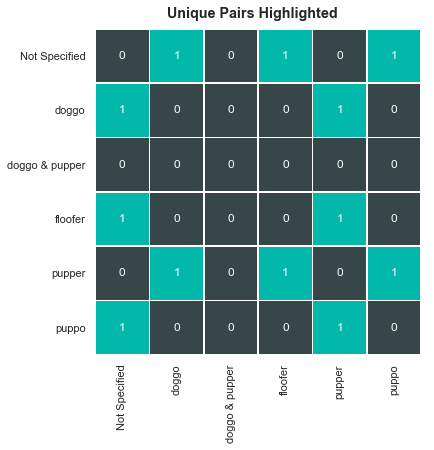

In [240]:
result_6200_x = (result_6200 < 0.05) & (result_6200 > 0)

plt.subplots(figsize=(6, 6))
sns.heatmap(result_6200_x, annot=True, fmt="d", linewidths=.5,
            cbar=False, cmap=["#374649", "#01B8AA"], square=True)

# 设置大图标题
plt.suptitle('Unique Pairs Highlighted', fontweight='bold', y=.93)


利用Dunn's检验，我们发现，除doggo & pupper组与其他分类没有区别外，其他每个组都与其他组有区别。但观察fig620开支，其实这些不同的组就是分成了两组：doggo, puppo和floofer一组，not specified和pupper一组，混合了doggo还有pupper的属于墙头草。

这就意味着这么一个有趣的事实：不考虑推文质量等因素，doggo, puppo和floofer的吸赞能力一致；令人大跌眼镜的是，一向是卖萌担当的小狗，竟和推主没有说明分类时的吸赞能力一致，而混合了大狗和小狗的图片的吸赞能力则介于二者之间，统计学上没有证据证明其吸赞能力与上述两组有差。

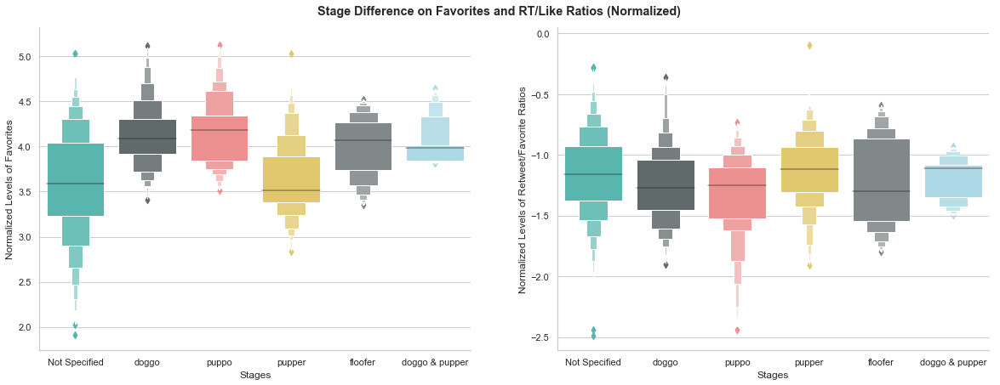

In [241]:
fig620

#### d) 统计结果能在多大程度上说明问题——对η<sup>2</sup>的计算

η<sup>2</sup>是反映组间变异占整体变异的比例的效应量。针对Kruskal-Wallis检验的η<sub>2</sub>[计算](https://www.researchgate.net/profile/Ghulam_Shaikh/post/Anyone_know_how_to_calculate_eta_squared_for_a_Kruskal-Wallis_analysis/attachment/59d6264679197b807798491e/AS%3A321508419801088%401453664988723/download/The+Kruskal-Wallis+Test.pdf)方法如下：

$$ η^2 = χ^2/N-1 $$

SciPy并没有直接报告χ<sub>2</sub>的值，但因我们的样本容量足够（全部大于5）其给出的H值[可以被当作χ<sup>2</sup>](https://stats.stackexchange.com/questions/381873/meaning-of-chi-squared-in-r-kruskal-wallis-test)。N是所有分组样本之和，是1991。η<sup>2</sup>计算如下：

In [242]:
effect_size_6200 = H/(1991-1)
print("η^2 = {}".format(effect_size_6200))


η^2 = 0.04238826129269294


我们针对不同分类之间点赞量的不同进行的方差分析，虽然说明了不同组之间的点赞量确实存在具有统计学意义的差别，但其效应量只有0.0423，比较小，对整体结果没有很强的效果。

### 6.2.2 对转赞比的单因素方差分析

#### a) 检验样本方差齐性

In [243]:
RTLikeRatio_test_stages = [df620[df620['stages'] == 'Not Specified']['RL_Ratio_log'],
                           df620[df620['stages'] == 'doggo']['RL_Ratio_log'],
                           df620[df620['stages'] == 'puppo']['RL_Ratio_log'],
                           df620[df620['stages'] == 'pupper']['RL_Ratio_log'],
                           df620[df620['stages'] == 'floofer']['RL_Ratio_log'],
                           df620[df620['stages'] == 'doggo & pupper']['RL_Ratio_log']]


In [244]:
# 参考链接 https://pythonfordatascience.org/anova-python/
s, p = stats.levene(*RTLikeRatio_test_stages)

if p < 0.05:
    print('应拒绝零假设，样本不具方差齐性')
else:
    print('拒绝零假设失败， 继续')


拒绝零假设失败， 继续


#### b) 执行单因素方差分析

In [245]:
# 使用statsmodel进行方差分析

# formula语法： http://www.statsmodels.org/stable/contrasts.html

# 模型拟合
# http://www.statsmodels.org/stable/example_formulas.html,
# https://mcfromnz.wordpress.com/2011/03/02/anova-type-iiiiii-ss-explained/

# 其他：
# https://www.marsja.se/four-ways-to-conduct-one-way-anovas-using-python/
# https://pythonfordatascience.org/anova-python/
# https://www.statsmodels.org/stable/generated/statsmodels.stats.anova.anova_lm.html#statsmodels.stats.anova.anova_lm

mod6201 = ols(formula="RL_Ratio_log ~ C(stages)", data=df620).fit()
anova_table_6201 = sm.stats.anova_lm(mod6201, typ=2)
anova_table_6201


,sum_sq,df,F,PR(>F)
C(stages),1.563550,5.0,2.974431,0.011124
Residual,208.688519,1985.0,NaN,NaN


根据上表的结果，F(5, 1985) = 2.974431，对应P值为0.011124，小于我们设置的α值0.05。因此我们推翻零假设，不同分类之间的转赞比均值确实是有统计上显著的区别的。

我们接下来需要解答的两个问题，分别是：1）到底哪些组之间的均值互不相同？2）我们的统计结果能在多大程度上说明问题？

#### c) 哪些组之间均值不同——Tukey's HSD检验

In [246]:
# 参考链接
# https://www.statsmodels.org/dev/generated/statsmodels.sandbox.stats.multicomp.MultiComparison.tukeyhsd.html
# https://www.statsmodels.org/dev/generated/statsmodels.stats.multicomp.pairwise_tukeyhsd.html
# http://cleverowl.uk/2015/07/01/using-one-way-anova-and-tukeys-test-to-compare-data-sets/

mc6201 = MultiComparison(df620['RL_Ratio_log'], df620['stages'])
hsd_result = mc6201.tukeyhsd()

print(hsd_result, '\n\n', "Unique Groups: {}".format(mc6201.groupsunique))


      Multiple Comparison of Means - Tukey HSD,FWER=0.05     
    group1         group2     meandiff  lower   upper  reject
-------------------------------------------------------------
Not Specified      doggo      -0.0927  -0.2096  0.0242 False 
Not Specified  doggo & pupper  -0.036  -0.4502  0.3782 False 
Not Specified     floofer     -0.0682   -0.396  0.2596 False 
Not Specified      pupper      0.0349  -0.0337  0.1034 False 
Not Specified      puppo       -0.177  -0.3712  0.0171 False 
    doggo      doggo & pupper  0.0567  -0.3726  0.4859 False 
    doggo         floofer      0.0245  -0.3221  0.371  False 
    doggo          pupper      0.1275  -0.0042  0.2593 False 
    doggo          puppo      -0.0843  -0.3087   0.14  False 
doggo & pupper    floofer     -0.0322  -0.5595  0.4951 False 
doggo & pupper     pupper      0.0709  -0.3478  0.4895 False 
doggo & pupper     puppo       -0.141  -0.5974  0.3154 False 
   floofer         pupper      0.103   -0.2303  0.4364 False 
   floof

利用Tukey的HSD检验，我们发现，除了pupper和puppo这两组的均值显著的不同之外，其他所有的组两两之间都一样。

#### d) 统计结果能在多大程度上说明问题——对η<sup>2</sup>的计算

η<sup>2</sup>是反映组间变异占整体变异的比例的效应量。针对不同分类之间的转赞比的区别的η<sup>2</sup>计算结果如下：

In [247]:
effect_size_6201 = anova_table_6201['sum_sq'][0] / \
    (anova_table_6201['sum_sq'][0] + anova_table_6201['sum_sq'][1])
print("η^2 = {}".format(effect_size_6201))


η^2 = 0.00743655182833364


针对不同分类之间转赞比的不同进行的方差分析虽然在统计上说明了不同组之间的转赞比确实存在具有统计学意义的差别，但其效应量只有0.007，很小，在实际当中可能根本不显著。

### 6.2.3 小结

尽管从直觉出发，我们会认为小狗更受欢迎，不同的分类之间可能有不同的受众，但统计检验的结果并没有完全支持我们猜想。

点赞量上，我们发现， 只有doggo & pupper这一大狗带小狗的组合的访问量的均值与组的均值没有统计学意义上显著的差别；而剩下的分类，则分为了两个互不相同的大组：doggo, puppo和floofer一组，未说明的推文和属于pupper的推文一组。而未说明的推文和pupper分类的推文，点赞量较另一大组低。这个结论实际上否定了我们的猜想：小狗并没有更受欢迎。

至于通过转赞比探索不同的组之间是否有不同的受众，尽管我们得出了puppo和pupper的转赞比均值有统计学意义上显著的差别，其效应量也很小。因此，我们不认为不同的分类之间有实际意义上的不同受众群体， 而poppo和pupper推文反映出的点赞比的差别很可能是由于其他我们没有考察的因素导致的。

## 6.3 评分与转发量/点赞数的关系是什么？即：分数越高的狗狗，点赞和转发量就一定越高吗？或是有什么其他的可能？

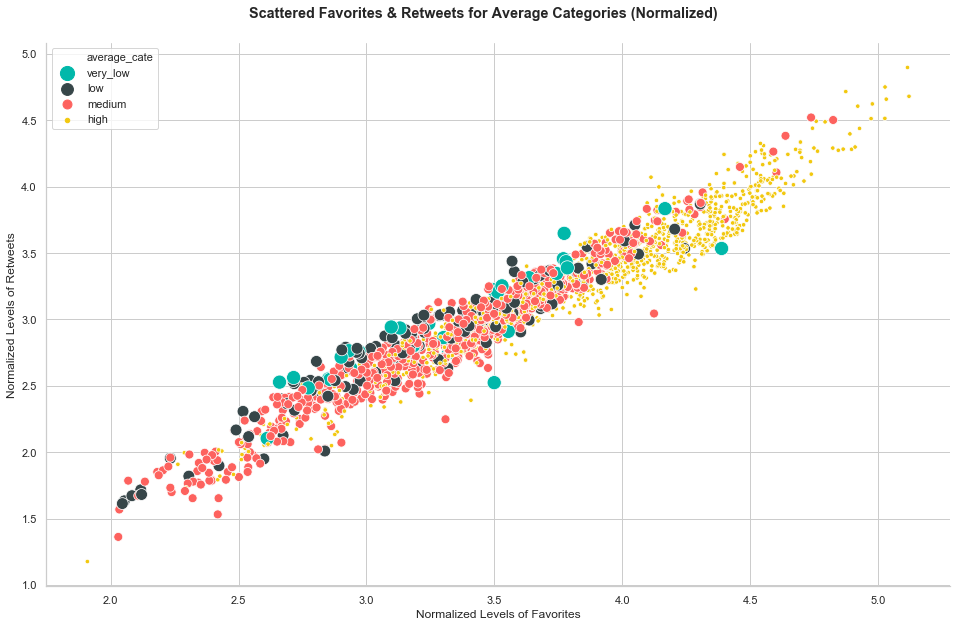

In [248]:
fig630

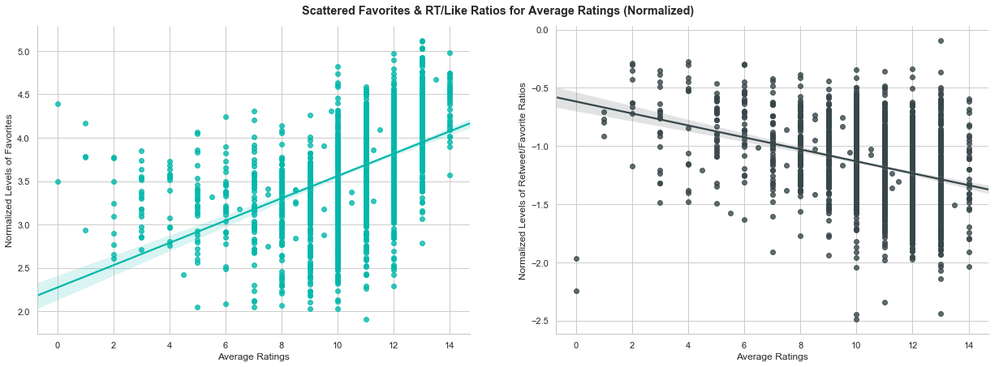

In [249]:
fig631

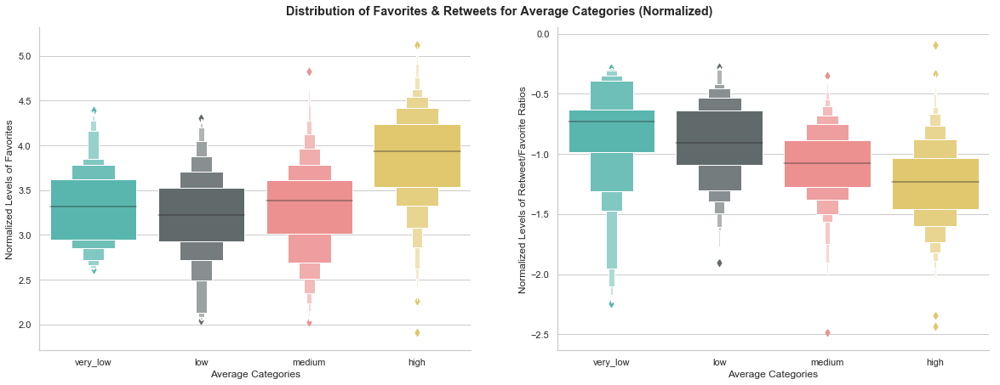

In [250]:
fig632

### 6.3.1 点赞量的线性回归分析

In [251]:
# 建立备用数据集，并设定截距
df6300 = df620.copy()
df6300['intercept'] = 1


In [252]:
df6300.head(1)


,tweet_id,timestamp,text,single_dog,name,stage_count,stages,average,favorite_count,retweet_count,jpg_url,breed,gender,RT/Like,average_cate,dog?,RL_Ratio_log,favorite_log,intercept
0,892420643555336193,2017-08-01 16:23:56,This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,True,Phineas,0,Not Specified,13.0,39492,8842,https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg,orange,Male,0.223893,high,not dog,-1.496585,4.596509,1


Text(0.5, 0.93, 'Favorites Scatter & Regression for Average Ratings')

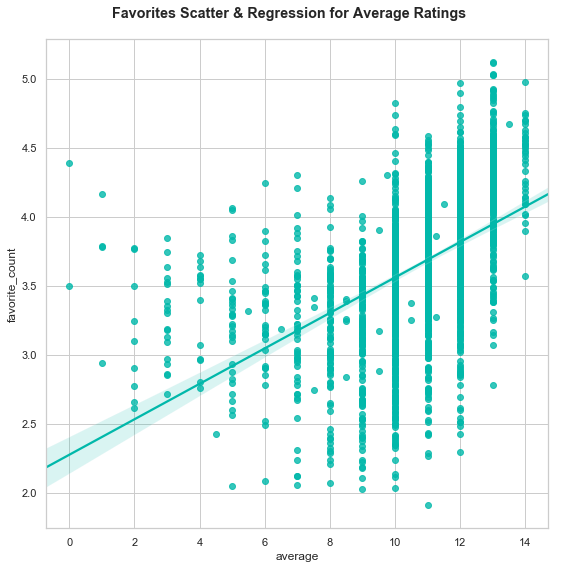

In [253]:
plt.subplots(figsize=(9, 9))
sns.regplot(x=dogrates_clean['average'], y=dogrates_clean['favorite_count'].apply(
    np.log10), color='#01B8AA')

# 设置大图标题
plt.suptitle('Favorites Scatter & Regression for Average Ratings',
             fontweight='bold', y=.93)


In [254]:
model6300 = sm.OLS(df6300['favorite_log'], df6300[['intercept', 'average']])
results6300 = model6300.fit()


In [255]:
results6300.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           favorite_log   R-squared:                       0.249
Model:                            OLS   Adj. R-squared:                  0.249
Method:                 Least Squares   F-statistic:                     659.7
Date:                Fri, 25 Jan 2019   Prob (F-statistic):          6.89e-126
Time:                        22:52:52   Log-Likelihood:                -1390.5
No. Observations:                1991   AIC:                             2785.
Df Residuals:                    1989   BIC:                             2796.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      2.2742      0.054     42.160      0.000       2.168       2.380
average        0.1286      0.005     25.685      0.000       0.119       0.138
==============================================================================
Omnibus:                       39.480   Durbin-Watson:                   1.015
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               42.449
Skew:                          -0.320   Prob(JB):                     6.06e-10
Kurtosis:                       3.319   Cond. No.                         53.7
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

所以，点赞量和平均分之间的函数关系为：

favorite_count = 10<sup>0.1286*average+2.2742</sup>

这一模型能够覆盖24.9%的数据。

### 6.3.2 转赞比的线性回归模型

Text(0.5, 0.93, 'RT/Like Ratio Scatter & Regression for Average Ratings')

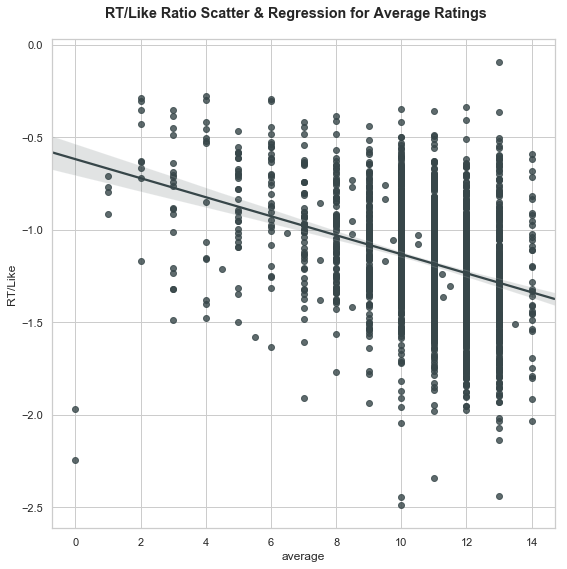

In [256]:
plt.subplots(figsize=(9, 9))
sns.regplot(x=dogrates_clean['average'],
            y=dogrates_clean['RT/Like'].apply(np.log), color='#374649')

# 设置大图标题
plt.suptitle('RT/Like Ratio Scatter & Regression for Average Ratings',
             fontweight='bold', y=.93)


In [257]:
model6301 = sm.OLS(df6300['RL_Ratio_log'], df6300[['intercept', 'average']])
results6301 = model6301.fit()


In [258]:
results6301.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           RL_Ratio_log   R-squared:                       0.119
Model:                            OLS   Adj. R-squared:                  0.118
Method:                 Least Squares   F-statistic:                     267.8
Date:                Fri, 25 Jan 2019   Prob (F-statistic):           1.42e-56
Time:                        22:52:52   Log-Likelihood:                -461.38
No. Observations:                1991   AIC:                             926.8
Df Residuals:                    1989   BIC:                             937.9
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     -0.6176      0.034    -18.258      0.000      -0.684      -0.551
average       -0.0514      0.003    -16.366      0.000      -0.058      -0.045
==============================================================================
Omnibus:                       46.082   Durbin-Watson:                   1.588
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               67.179
Skew:                          -0.242   Prob(JB):                     2.58e-15
Kurtosis:                       3.759   Cond. No.                         53.7
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

转赞比与平均分的函数关系为：

RT/Like = e<sup>-0.0514*average-0.6176</sup>

不过，这一模型只适用于大约11.9%的数据，不是很有效。

### 6.3.3 对点赞量的单因素方差分析

#### a) 检验样本方差齐性

In [259]:
favorite_test_avgcate = [df620[df620['average_cate'] == 'very_low']['favorite_log'],
                         df620[df620['average_cate'] == 'low']['favorite_log'],
                         df620[df620['average_cate'] ==
                               'medium']['favorite_log'],
                         df620[df620['average_cate'] == 'high']['favorite_log']]


In [260]:
# 使用levene test检验样本的方差齐性
s, p = stats.levene(*favorite_test_avgcate)

if p < 0.05:
    print('应拒绝零假设，样本不具方差齐性，需要使用Kruskal-Wallis单因素方差分析')
else:
    print('拒绝零假设失败， 继续')


拒绝零假设失败， 继续


#### b) 执行单因素方差分析

In [261]:
# 使用statsmodel进行方差分析
mod6301 = ols(formula="favorite_log ~ C(average_cate)", data=df620).fit()
anova_table_6301 = sm.stats.anova_lm(mod6301, typ=2)
anova_table_6301


,sum_sq,df,F,PR(>F)
C(average_cate),163.585463,3.0,233.562019,8.548624e-130
Residual,463.894367,1987.0,NaN,NaN


#### c) 执行后续分析——Tukey's HSD检验

In [262]:
# 使用Tukey's HSD找出真正不同的组
mc6301 = MultiComparison(df620['favorite_log'], df620['average_cate'])
hsd_result = mc6301.tukeyhsd()

print(hsd_result, '\n\n', "Unique Groups: {}".format(mc6301.groupsunique))


Multiple Comparison of Means - Tukey HSD,FWER=0.05
group1  group2  meandiff  lower   upper  reject
-----------------------------------------------
 high    low    -0.6561  -0.7706 -0.5416  True 
 high   medium  -0.5658  -0.6261 -0.5054  True 
 high  very_low -0.5506  -0.7668 -0.3345  True 
 low    medium   0.0903  -0.0284  0.209  False 
 low   very_low  0.1055  -0.1337  0.3446 False 
medium very_low  0.0151  -0.2033  0.2335 False 
----------------------------------------------- 

 Unique Groups: ['high' 'low' 'medium' 'very_low']


利用Tukey的HSD检验，我们发现：在点赞量上，最高分组与非常低，低和中等三个小组都显著的不同；而三小组之间的差别则没有统计学意义上显著的不同。

#### d) 统计结果能在多大程度上说明问题——对η<sup>2</sup>的计算

η<sup>2</sup>是反映组间变异占整体变异的比例的效应量。针对不同分类之间的转赞比的区别的η<sup>2</sup>计算结果如下：

In [263]:
effect_size_6301 = anova_table_6301['sum_sq'][0] / \
    (anova_table_6301['sum_sq'][0] + anova_table_6301['sum_sq'][1])
print("η^2 = {}".format(effect_size_6301))


η^2 = 0.26070234504160555


我们发现，针对点赞量的单因素方差分析能够解释26%的点赞变化。不算特别显著，但至少我们能够认为，分数的高低确实能够作为影响点赞量的一个因素：分数超过10分，将为推文带来分数低于10分在本质上不同的点赞量。

### 6.3.4 对转赞比的单因素方差分析

#### a) 检验样本方差齐性

In [264]:
RTLikeRatio_test_avgcate = [df620[df620['average_cate'] == 'very_low']['RL_Ratio_log'],
                            df620[df620['average_cate']
                                  == 'low']['RL_Ratio_log'],
                            df620[df620['average_cate'] ==
                                  'medium']['RL_Ratio_log'],
                            df620[df620['average_cate'] == 'high']['RL_Ratio_log']]


In [265]:
# 使用levene test检验样本的方差齐性
s, p = stats.levene(*RTLikeRatio_test_avgcate)

if p < 0.05:
    print('应拒绝零假设，样本不具方差齐性，需要使用Kruskal-Wallis单因素方差分析')
else:
    print('拒绝零假设失败， 继续')


应拒绝零假设，样本不具方差齐性，需要使用Kruskal-Wallis单因素方差分析


#### b) 执行单因素方差分析

In [266]:
# 使用scipy库的kruskal方法进行方差分析
# https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.kruskal.html
H6301, p = stats.kruskal(*RTLikeRatio_test_avgcate)

if p < 0.05:
    print("H值为 {}， 对应P值为 {} < 0.05, 拒绝零假设".format(H, p))
else:
    print("H值为 {}， 对应P值为 {} > 0.05, 拒绝零假设失败".format(H, p))


H值为 84.35263997245896， 对应P值为 6.341753720966771e-47 < 0.05, 拒绝零假设


#### c) 执行后续分析——Dunn's检验

In [267]:
# 使用Dunn检验找出独特的组
result_6301 = sp.posthoc_dunn(
    df620, 'RL_Ratio_log', 'average_cate', p_adjust=None)
result_6301


,very_low,low,medium,high
very_low,-1.000000e+00,4.404230e-01,2.436375e-04,3.763474e-11
low,4.404230e-01,-1.000000e+00,2.028449e-07,1.573117e-27
medium,2.436375e-04,2.028449e-07,-1.000000e+00,2.198601e-25
high,3.763474e-11,1.573117e-27,2.198601e-25,-1.000000e+00


Text(0.5, 0.95, 'Unique Pairs Highlighted')

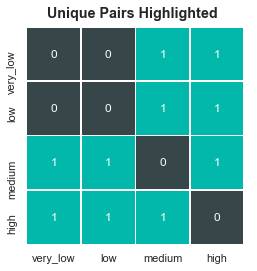

In [268]:
result_6301_x = (result_6301 < 0.05) & (result_6301 > 0)

plt.subplots(figsize=(4, 4))
sns.heatmap(result_6301_x, annot=True, fmt="d", linewidths=.5,
            cbar=False, cmap=["#374649", "#01B8AA"], square=True)

# 设置大图标题
plt.suptitle('Unique Pairs Highlighted', fontweight='bold', y=.95)


根据Dunn's检验的结果，我们发现，最高分数的一组的转赞比低于其他三组，而中间的转赞比则低于分数低和非常低的两组。也就是说，分数越低，转赞比确实越高。有意思。

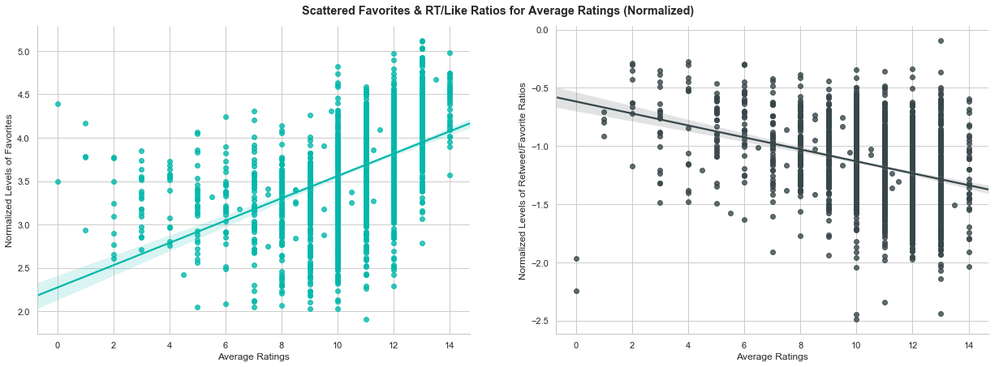

In [269]:
fig631

#### d) 统计结果能在多大程度上说明问题——对η<sup>2</sup>的计算

In [270]:
effect_size_6301 = H6301/(1991-1)
print("η^2 = {}".format(effect_size_6301))


η^2 = 0.10939160758137773


统计结果大约能解释10%的转赞比变化情况，这一比例较低。因此，转暂避的变化虽然跟分数的到底确实有关系，但关系不算显著。

### 6.3.5 小结

尽管我们成功归纳出了点赞量与转赞比与平均分数之间的函数关系，但其并不能很好的说明这两个变量随着评分变化情况的变化。

为了进一步探索这一现象，我们使用分数段对所有的推文进行了分组并执行了单因素方差分析。

对点赞量的分析结果显示，分数高于10分，能够吸引比分数低于10分更多的点赞量，而低分数低于10分的推文的点赞量，无论深处哪个分数段，并没有统计学意义上的不同。

而对转赞比的分析显示，分数低于7分的推文的转赞比，较分数在7-10分，和10分以上推文的转赞比有统计学意义上的不同。

尽管以上两点观察效应量都很低，但这确实是线性回归没有也不能告诉我们的。

# 7. 总结与讨论
---

在经历如此冗长的清洗，可视化，分析，计算和讨论之后，我们终于来到了这个环节~

我们将首先回顾我们对原始数据集所作的清理，这项清理工作奠定了我们分析工作的基础；其次，我们将回顾我们对推特账号运营情况的观察，这将有助于我们了解我们分析的对象的整体状况，并作为后续高级分析的基础；最后，我们专注于解答三个问题：是否有某些品种的狗狗更受欢迎？是否有某些生长阶段的狗狗更受欢迎？以及，是否有某些特定分数段的狗狗更受欢迎？最后，我们将讨论这份报告的局限性，以及对此数据集的后续挖掘可能展开的方向。

## 7.1 对数据集的清洗和整理

我们花费了大约1/2的篇幅用于观察和清理这个数据集；这个工作无疑是这个项目的重中之重。

针对数据集存在的质量问题，我们进行了如下操作：
- 删除影响分析的数据
    - 删除了一条tweet_id为810984652412424192的推特，因其是一条筹款推文，并不包含这份报告的分析范围之内；
    - 删除了两条评分显著异常的推文，其中一条庆祝了美国独立日，另一条似乎是为名人；
    - 在验证转发数据不包含任何未知的信息后，我们抓住转发推特都带有“RT @”的特征删除了他们
- 补全空值
    - 通过优化的正则表达式重新提取了狗狗的名字：我们重做了name列，存在多只狗狗的推文，其name列值使用了&将两名字连接（可能影响了名字频率统计）；
- 修复错误
    - 修复语言表达造成的的一只狗狗对应多个分类问题（人工辨别，手动清理）
    - 修复推文中就是有两只不同分类的狗狗的问题：我们为这类推文单独建立了一个分类（使用&连接不同的分类名称），顺便解决了狗狗生长状态四列需要合并为一列的问题；
    - 修复推文中存在多个“/”导致分数提取错误的问题：我们提取了存在该项错误的行，使用专为这项任务涉及的正则表达式重新提取分数信息，并将这些分数信息更新回原数据集；
    - 修复小数点导致的分数提取错误的问题：显然在推特账号的发展过程当中，推主的打分标准发生过一些变化；
    - 修复推文中包含两组正确的分数，但只提取了一组的问题：我们使用一个新的正则表达式为这些行提取了这些分数，并将它们暂存在新的分数列中；
    - 修复了一条推文对多只狗狗打总分的情况：我们抛弃了原来的分数系统，直接计算了每一条推文所有分数的平均分作为推文的唯一分数；在修复这一问题的过程中，也顺便解决了上一条错误修复导致的一条推文有两个分数的问题；
    - 修复了dogrates数据集下`timestamp`列数据类型错误的问题：将其修正为`datatime`数据类型；
    - 统一了不同数据集中代表同一变量的不同列名称；
    - 修改了breeds_clean数据集中不适宜的名称。
    
针对数据集的整洁度问题，我们进行了如下操作：
- 将标明狗狗生长状态的四列合并为一列（已在针对质量问题修复的过程中修复）
- 将项目涵盖的三个数据集合并，因其观察的对象本质上是一样的。

在以上工作完成之后，我们确实得到了一个清洗干净的数据集，但它还不足以解答我们的问题：有没有因素能帮助我们确定，这条推文会更受欢迎？为此，我们在上述工作的基础之上，进一步提取了如下信息，以帮助我们进一步探索数据集：
- 通过人称和物主代词，利用正则表达式，从text列提取推文主体的性别信息；这一步骤的执行效果似乎比网上其他同学的效果要好，有更少的遗漏，并通过人工辨别修复了一些错误；
- 启用全新变量“转赞比”：通过计算转发/点赞的比例，得出某一条推文更深层次受欢迎程度；
    - 通过这项指标，一般的分析中我们也无需再看单独的转发数量；
    - 通过这一指标，我们能更好的衡量推特账号核心粉丝的变化情况，并为深入分析打下基础；
- 计算了推文点赞量和转发量的各项里程碑，以帮助我们更好的理解推特账号的发展历程；
- 将评分分组，以衡量不同分数之间的点赞量和转赞比情况；1分，7分和13分一定代表着三种不同的推文风格，其受欢迎程度的不同显然值得我们进一步探索；这项分析与回归分析的结论结合，可能能让我们有更进一步的思考；
- 将推文是否是狗进行分类：我们注意到，图像预测机器学习的数据集里，对同样图像做了三次预测。我们发现，综合考虑其三次预测的结果，能够更好的说明推文的实质内容。我们根据图像预测的结果将推文分成了三大类：不是狗（三次预测结果全部为False），有可能是狗（三次预测结果有一次为True），和是狗（三次预测结果全部为True）。根据我们列举的例子，这三类实质上代表了不同类型的内容，也决定了推主在表达时的推文风格可能也有所不同，而这很可能能够帮助我们进一步不同推文的探索受欢迎程度的区别。

尽管还有许多方面值得进一步挖掘，但我们针对这个数据集的清洗和整理工作就到这里。

## 7.2 对推特账号运营情况的观察

在探索的过程中，我们发现了这些有趣的现象：
- WeRateDogs最频繁的座上宾，是金毛和拉布拉多；
- 随着时间的推移和账号的走红，推主的打分在不断上升：低分比例减少，同时分数的区间在不断收紧；
- 推文的转赞比却在不断下降，核心粉丝的增长速度并没有受众快；
- 在经历初期短暂的爆红之后，账号运营活动于16年4月跌入谷底（点赞量之和）；当然，单条推特的平均点赞量并未下滑，但是推特的条数锐减，同时推特的质量还没有大幅提高；
- 推文数量在16年4月后保持在月均40条的稳定状态，但是单条推特吸引的点赞数不断地提升。这一方面是由于推文质量的提升，另一方面也是由于公众号自身受众的上涨；

## 7.3 对影响推文受欢迎程度因素的讨论

在这份报告中，我们探索了7种可能对受欢迎程度有影响的因素：客观因素有时间，星期；主观因素有品种，生长阶段分类，评分与评分分组，推文主体是不是狗，以及推文主体的性别因素。在初步的可视化探索之后，我们认为只有品种，生长阶段分类，和评分与评分分组这三个方值得进一步探索；客观因素上看不出有明显的规律，而且变量太多；其他主观因素波动量很小，就算我们进行进一步探索，就算我们得出统计上显著的结论，其效应量也很可能很小，不具实际意义。

我们最终得出的结论可以由以下三句话来概括：
- 大千世界，众汪平等；
- 小奶狗居然不吃香；
- 低分有铁粉，高分更吸睛

### 7.3.1 大千世界，众汪平等

Text(0.5, 1.04, 'Details of Most Favored Breeds')

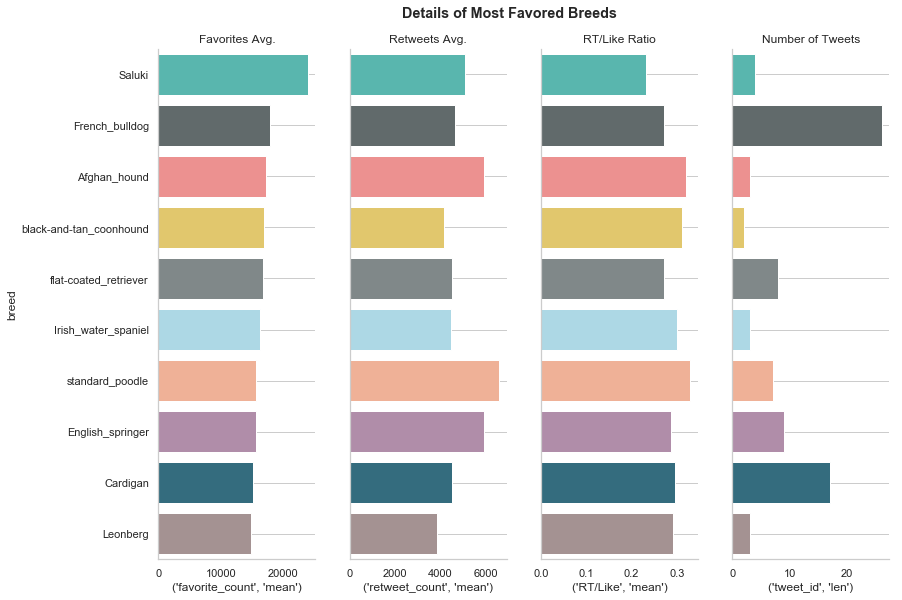

In [271]:
sns.set(style='whitegrid')

fig610 = sns.PairGrid(pivot_breeds_plotting_enhanced, palette=ui_palette_light,
                      x_vars=[('favorite_count', 'mean'), ('retweet_count', 'mean'), ('RT/Like', 'mean'),
                              ('tweet_id',  'len')], y_vars=['breed'], height=8, aspect=.35)

fig610 = fig610.map(sns.barplot, orient='h', edgecolor='w',
                    palette=ui_palette_light)

# 设定标题，轴等
titles = ['Favorites Avg.', 'Retweets Avg.',
          'RT/Like Ratio', 'Number of Tweets']

for ax, title in zip(fig610.axes.flat, titles):

    # 为每个轴单独设定标题
    ax.set(title=title)

    # 取消纵向网格线，改为水平网格线
    ax.xaxis.grid(False)
    ax.yaxis.grid(True)

# 设置大图标题
plt.suptitle('Details of Most Favored Breeds', fontweight='bold', y=1.04)

我们筛选出了单条推特平均点赞量前10的狗狗。看上去每条狗狗的在不同的指标上差距都不小。

为了进一步确认这些狗狗的平均点赞量和转赞比有没有统计学意义上的不同，我们分布对这两项指标进行了单因素方差分析。结果显示，这10各品种狗狗的平均点赞量和转赞比没有统计学意义上的差别。这也意味着，尽管有些狗狗收获的单条点赞量较多，但我们不能据此认为某些狗狗更受欢迎。更合理的解释是，在可爱又调皮的狗狗面前，不管什么品种大家都爱，正所谓：大千世界，众汪平等。

### 7.3.2 小奶狗居然不吃香

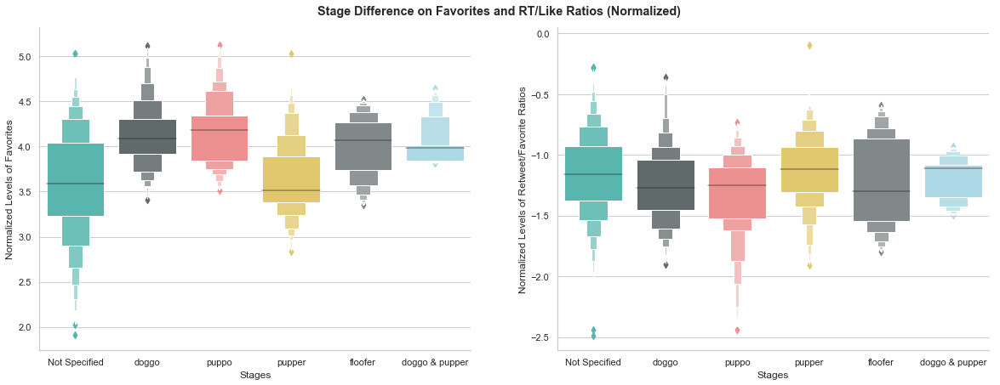

In [272]:
fig620

通过对不同生长阶段的分类的探索，我们发现，小狗狗pupper的平均点赞量低，居然时真的和其他的分类有统计学意义上的不同的。当推主没有说明狗狗的生长状态的时候，其吸赞能力和小狗pupper是一个水平；而其他的分类，如大狗doggo，青少年狗puppo，和毛好看狗floofer的吸赞能力在二者之上。大狗带小狗的分类的吸赞能力在这二者之间。

而对转赞比的分析，则显示推特账号的粉丝似乎并没有特别强烈的偏好，唯一在统计学意义上不同的组就是puppo和pupper，且这个统计的效应量只能解释0.743%的变化.在实际中，我们可以认为粉丝们对不同阶段的狗狗是一视同仁的。

至于为什么小狗狗反而不吸睛呢？这有可能是因为本公众号的核心优势在于搞笑，而小狗的“萌”属性并没有很好的与搞笑结合，导致这一，也有可能是因为有小狗的特征没有提取出来

### 7.3.3 低分有铁粉，高分更吸睛

针对评分与点赞量/转发量之间的关系问题，我们进行了线性回归和单因素方差分析两种探索。两个模型单独都不能很好的解释发生的现象（虽然都是这篇报告中最好的），但将二者合起来看，会带来有趣的见解。

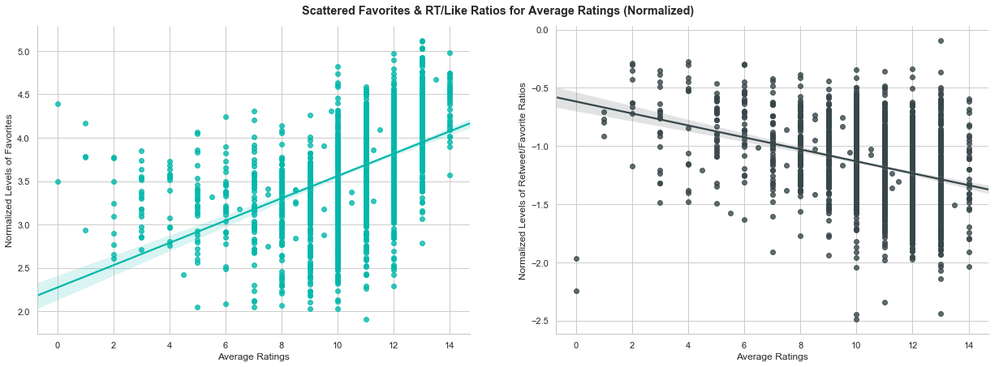

In [273]:
fig631

回归模型为我们带来了分数与点赞量和转赞比关系的公式：

favorite_count = 10^0.1286*average+2.2742；

RT/Like = e^-0.0514*average-0.6176

点赞量随着分数的提高而提高，转赞比却随着分数的提高而不断下滑。但是，针对点赞的回归模型只能解释24.9%的数据，而针对转赞比的回归模型则只能解释11.9%的数据。效果不算好。仔细观察图片发现，点赞量的回归方程似乎只适用于分数在10分以上的数据；而转赞比的方程也将大量的低分抛弃在外。

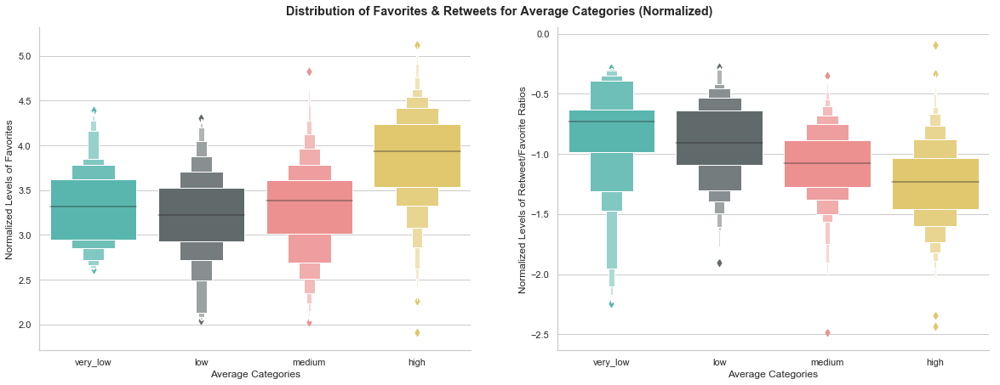

In [274]:
fig632

针对不同分数段进行的单因素方差分析显示：

点赞量上，分数高于10分，将为推文带来与低于10分显著不同的点赞量，而低于10分的三组自身没有统计学意义上显著的差异；转赞比上，低于7分的低分和超低分组拥有更高的转赞比，而高分组的转赞比则统计学意义上显著的最低。

这很可能是由于低分组的推特集中在推特账号草创时期，也即转赞比很高的时期发出，因为拥有更低的点赞量和更高的转赞比。(见下面二图）

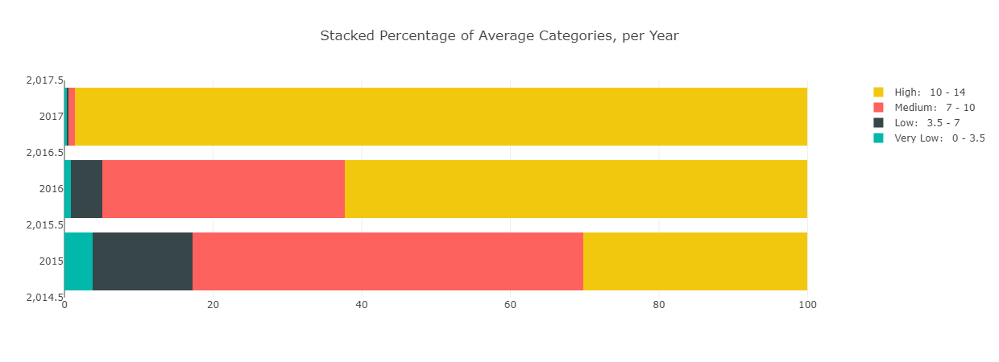

In [275]:
of.iplot(fig4523)

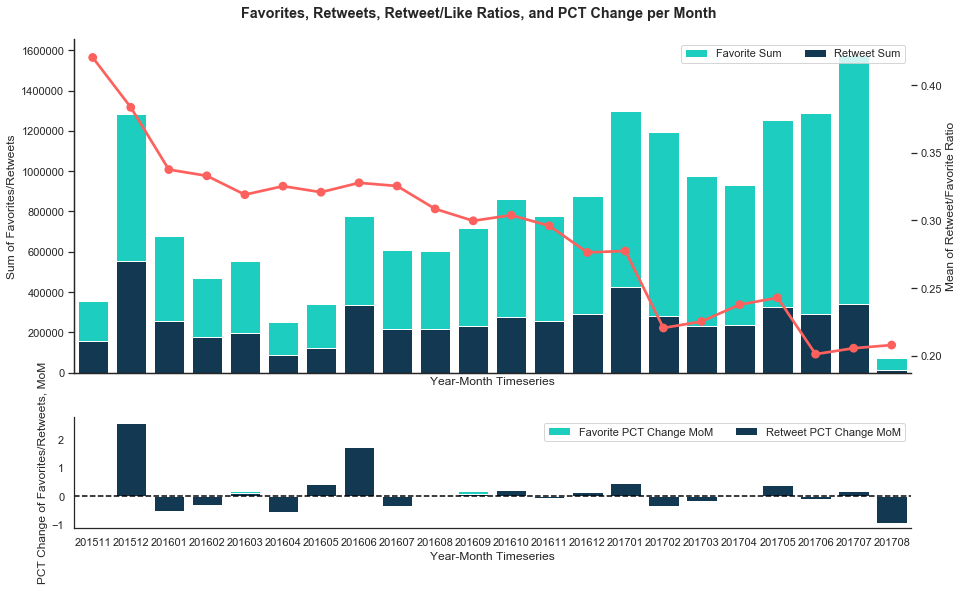

In [276]:
fig4532

## 7.4 本报告的局限之处，和未来努力的方向

目前能想到的局限性：
- 分析的角度和目标可能有待商榷；目前选取的分析角度将战线拖得太长，有点陷入过度分析的样子；（well虽然过程当中也学到了不少）
- 最大最大最大的问题，应该是没有排除时间流逝的干扰，导致结论很可能不可靠；
- 发现的几大特征都比较弱，就算结论能在统计上成立，在实际中的影响也值得怀疑。

目前能想到的，可以进一步挖掘的方向：
- 去趋势化： 本报告的所有数据都没有去趋势化，也就意味着本文所有的观察都随着时间流逝，账号本身走红而导致增长的影响；这一干扰很可能影响了我们总结规律的能力；
- 融合喜剧与文学理论的特征工程：在分析了所有根据常识能够总结出的特征后，我们实际上已经发现这些因素对推文的影响较小。真正重要的，是其作为一个搞笑萌宠推特的搞笑特性，而这就牵扯到了语义分析和文学理论。